In [1]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Looking for ETVs in TIC 52357


In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid = 52357  # EA/EB, 3 sectors

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u


sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
display(sr)
lc_tess = sr.download_all().stitch()
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 11,2019,SPOC,120,52357,0.0,N/A
1,TESS Sector 38,2021,SPOC,120,52357,0.0,N/A
2,TESS Sector 65,2023,SPOC,120,52357,0.0,N/A


56196

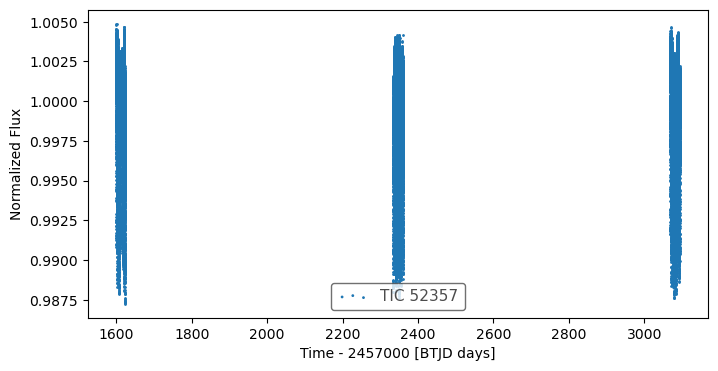

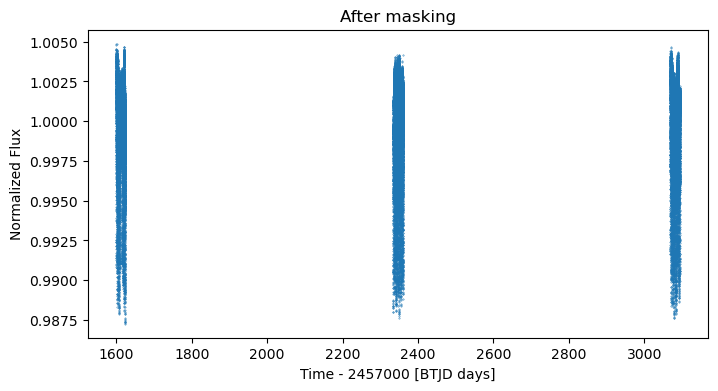

In [90]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# mask = time < 0 #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  
mask = flux < 0.85    # remove occassional outliers

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

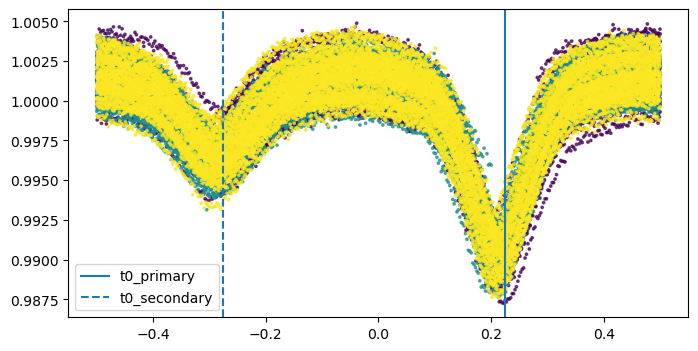

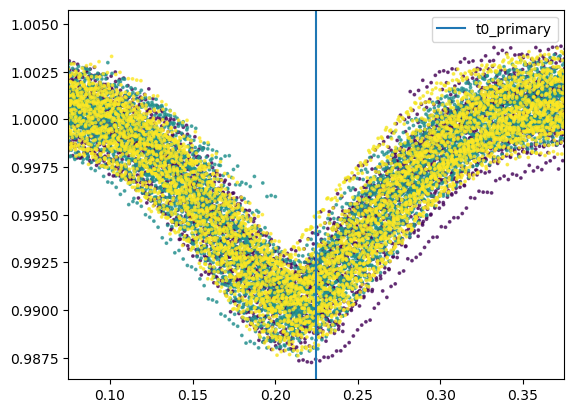

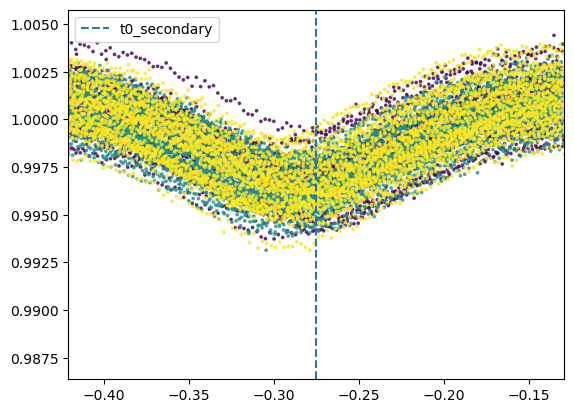

In [91]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# epoch=1597.3174, duration_hr=3.2896, period=0.547536, label="s0001-s0065:TCE1", # deep, uncertainty="2.1790825E-6" period=0.5475362634863508
# LombScargle, default, peak > 0.5 d: 0.5487699115521766
# AoV: 0.5475398759603165  (1 / 1.826351)
# AoV period might be better than TCE1, but it's hard to tell. 
# MCMC on primary:   0.5475400275843703
# MCMC on secondary: 0.5475398030738354

# FILL-IN THE eclipse epoch / period, 
# period = 0.5475363  # TCE1
period = 0.5475400  # MAMC on primary
         
t0_primary = 1597.3174
t0_secondary = t0_primary + period / 2


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 3.2896
duration_hr_secondary = 3.2

# t0_for_plotting = 0  # keep 0 for plotting purposes
t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.6 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.6 * duration_hr_primary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.xlim(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.6 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.6 * duration_hr_secondary / 24/ period);
plt.legend();
# plt.ylim(0.975, 1.005);
plt.show()

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
# show data to visualize what's changed in each step below
data  

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1, label="flux_detrended")
plt.legend()
plt.show()

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.6 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.6 * duration_hr_primary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.xlim(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.6 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.6 * duration_hr_secondary / 24/ period);
plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

<span style="background-color: rgba(255, 0, 0, 0.6);"> NOTE: </span> The zoom windows below for the eclipses are made **smaller**, an attempt to reduce the complications of EW variability outside the minima (and some assymetery)

### Now that the data is ready we can start 

Primary:   1599.50756 0.22499999999990694
window_width_p (phase): 0.3003981444278043
Secondary: 1599.23379 -0.27500000000011704
window_width_s (phase): 0.2922160938013661


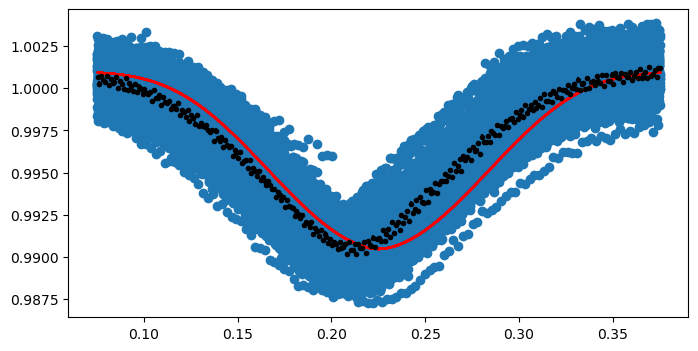

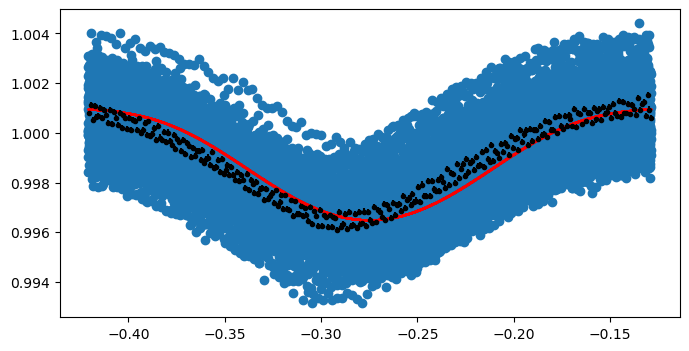

In [92]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 1.2 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)

    # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
    window_width_s = 1.2 * duration_hr_secondary / 24 / period  
    # window_width_s = 0.22
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1.001, -0.0105, midpoint_p, 0.06, 0.9]
start_vals_s = [1.001, -0.0045, midpoint_s, 0.06, 1.0]
    
# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
if t0_secondary is not None:
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

In [10]:
if False: 
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)
    

emcee parallel enabled, use all 12 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [05:28<00:00,  3.04it/s]


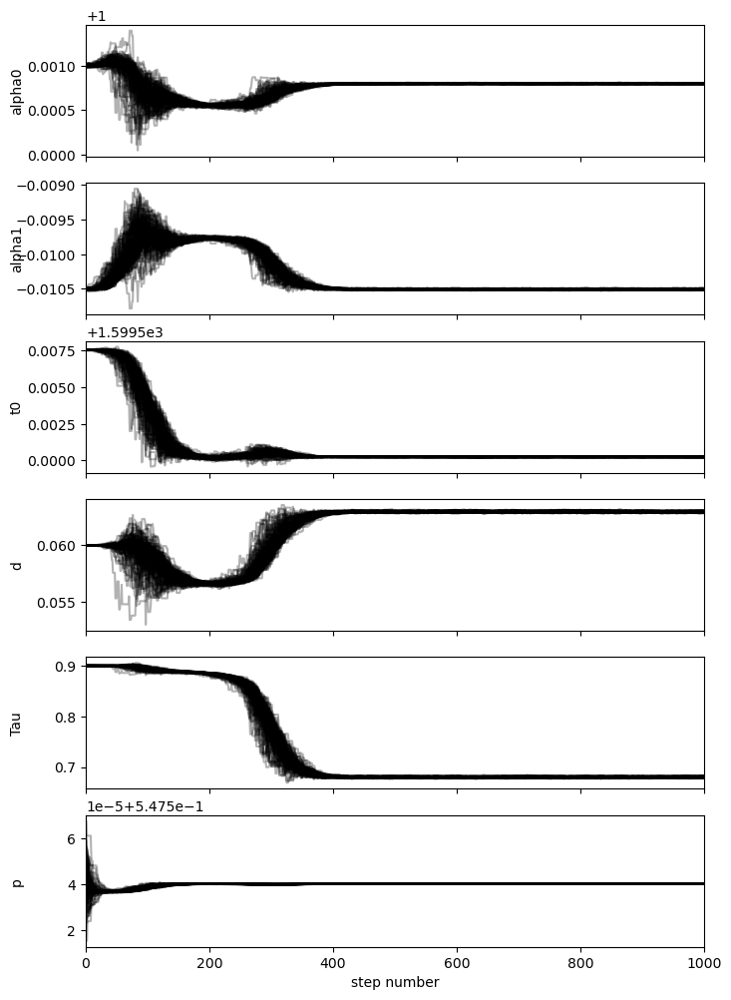

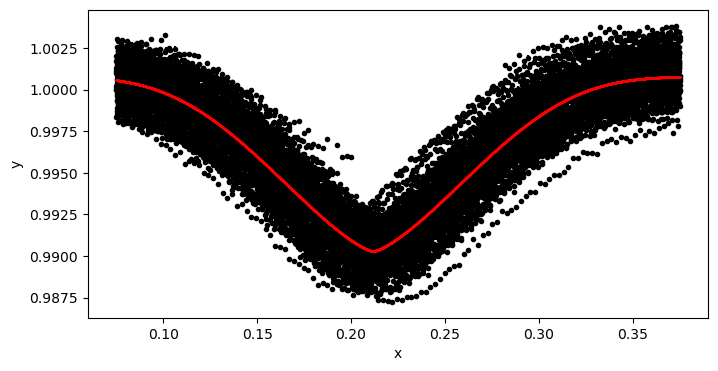

mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.0007969037917888, -0.010506501459690376, 1599.5002384500565, 0.06297874999346303, 0.6801717814691137, 0.5475400243935715
stdev of p 6.775564997504718e-09


In [181]:
# use MCMC to refine the period

use_mcmc_to_fit_period = True


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp
    reload(etvp)

    # enable info logging
    import sys
    import logging
    etvp.log.setLevel(logging.INFO)
    if not getattr(etvp.log, "_stdout_handler_added", False):  # for Jupyter        
        etvp.log.addHandler(logging.StreamHandler(stream=sys.stdout))
        etvp.log._stdout_handler_added = True
        
    # MCMC result
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.000762764473023, -0.01046197747753785, 1599.5002364814163, 0.06254338044274518, 0.6855018635047605, 0.5475400275843703
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.001, -0.0105, t0_primary, 0.06, 0.9, period],
        nruns=1000, discard=600, 
        # nruns=20, discard=1, 
        pool="all",
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"])

100%|██████████████████████████████████████████████████████████| 1000/1000 [04:30<00:00,  3.70it/s]


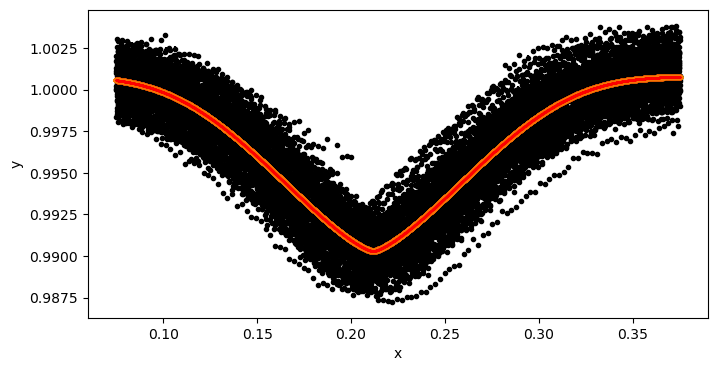

100%|██████████████████████████████████████████████████████████| 1000/1000 [04:42<00:00,  3.54it/s]


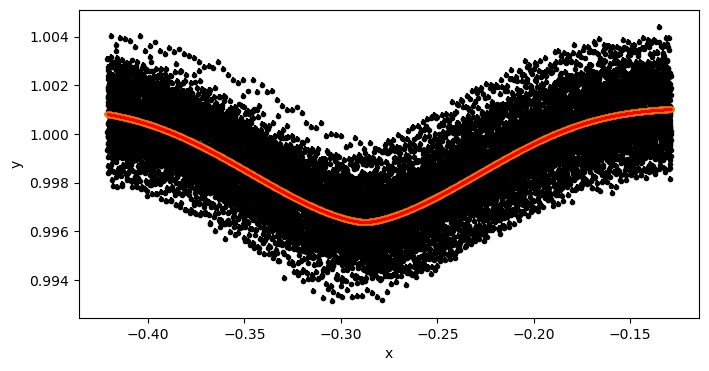

In [93]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = True

if run_init_fit:
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [22]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # initial fit params with TCE1 period
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0007400906771937, -0.010286806136915006, 0.2213678803883459, 0.06258344540894384, 0.7011870040868873
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0010687986300462, -0.004656979420750518, -0.2779233851937326, 0.06794969371478382, 0.7842527198434336

    # initial fit params with MCMC period
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0007967602762213, -0.010506693224773132, 0.21169162658024948, 0.06297963975499613, 0.680106006445453
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0010725223567305, -0.004696784257906559, -0.28762823842949303, 0.0676281477923298, 0.7807223219995945

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [95]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0007967602762213, -0.010506693224773132, 0.21169162658024948, 0.06297963975499613, 0.680106006445453
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0010725223567305, -0.004696784257906559, -0.28762823842949303, 0.0676281477923298, 0.7807223219995945


2729

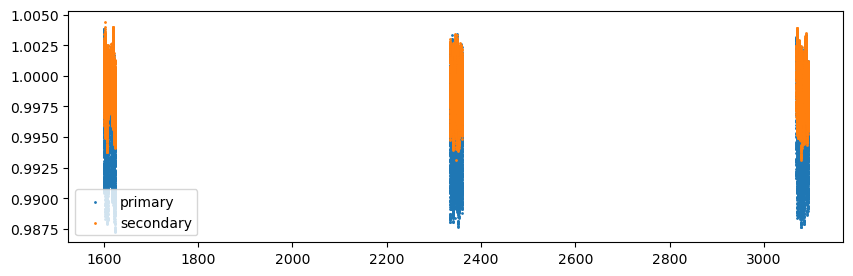

In [96]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1599.50756 0.54754 1599.50756


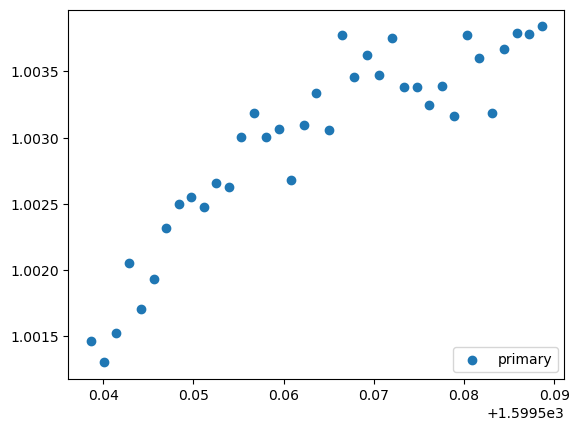

1599.50756 0.54754 1600.0551


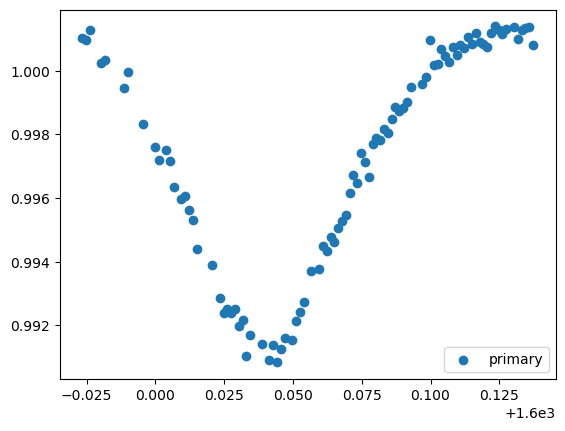

1599.50756 0.54754 1600.60264


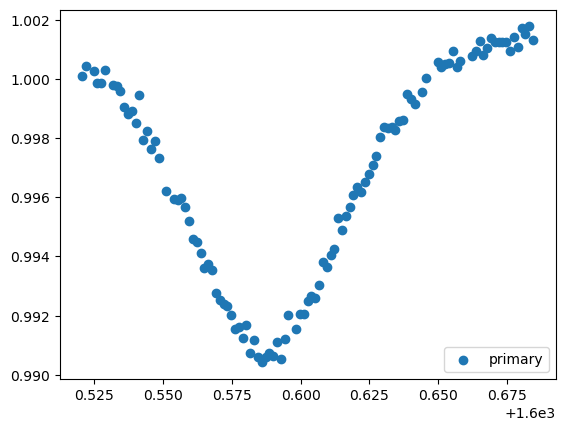

1599.23379 0.54754 1599.23379


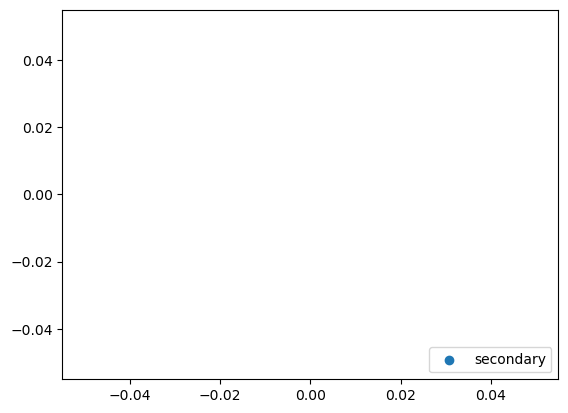

1599.23379 0.54754 1599.78133


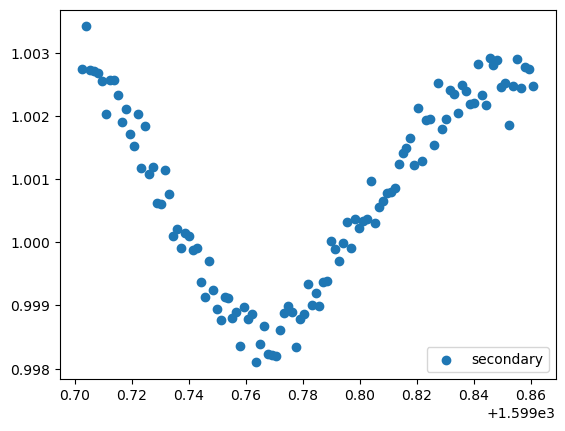

1599.23379 0.54754 1600.32887


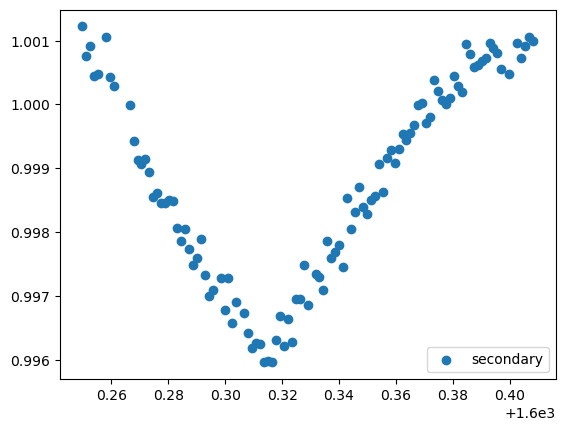

In [97]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
Number 2 has already been completed -- skip
1601.15018 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.02it/s]


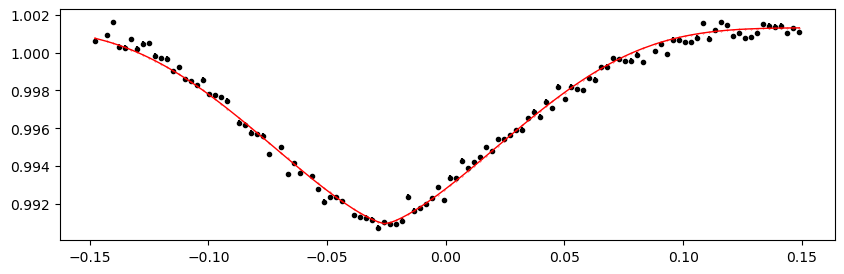

1601.6977200000001 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.46it/s]


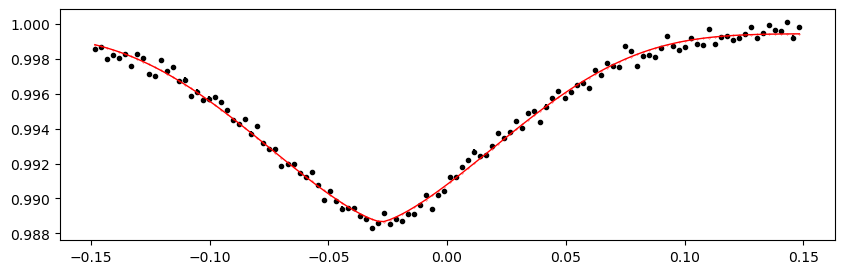

1602.24526 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.25it/s]


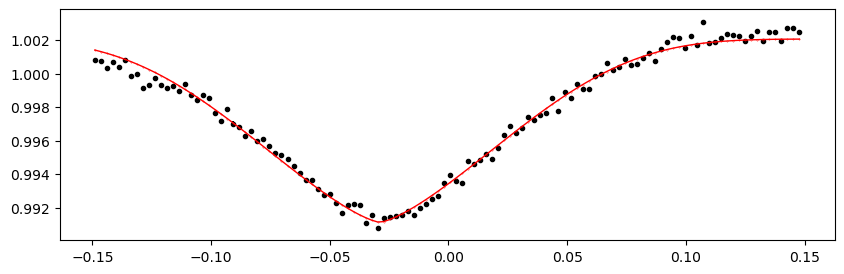

1602.7928 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.92it/s]


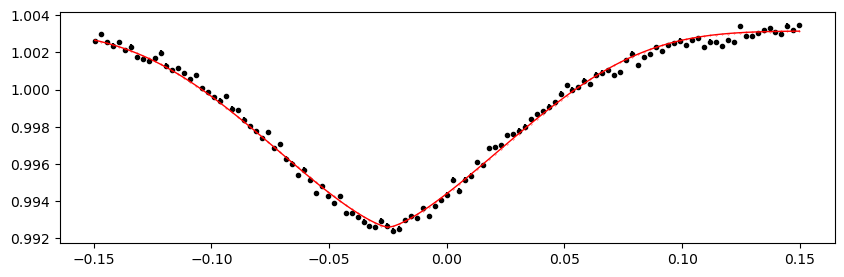

1603.34034 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.36it/s]


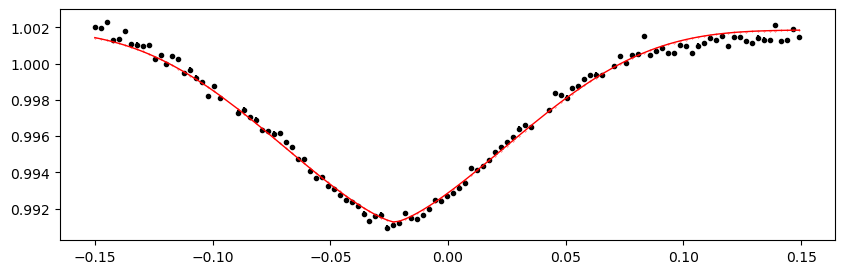

1603.88788 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.45it/s]


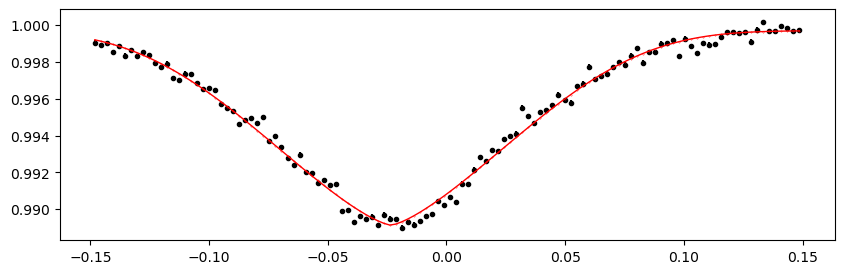

1604.43542 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.22it/s]


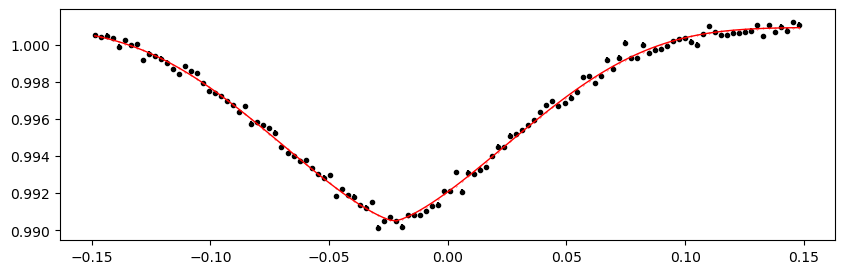

1604.98296 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.62it/s]


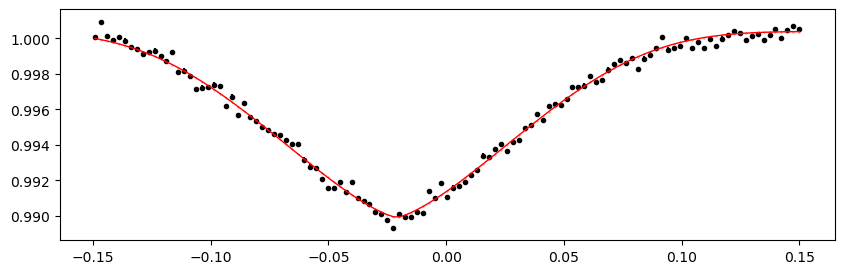

1605.5305 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.00it/s]


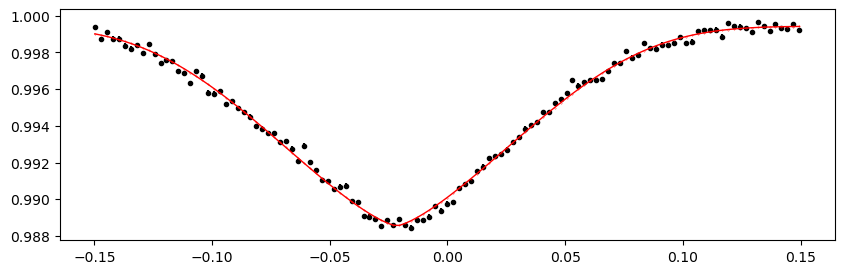

1606.07804 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.63it/s]


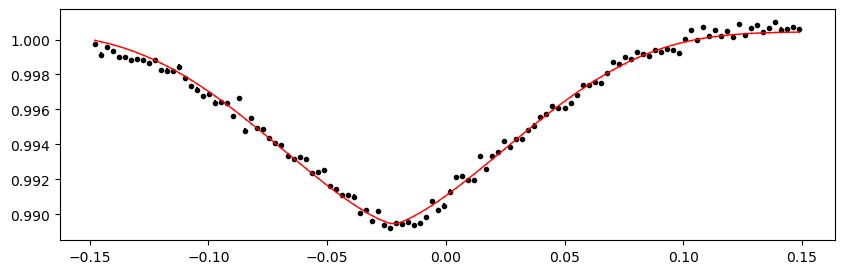

1606.62558 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.17it/s]


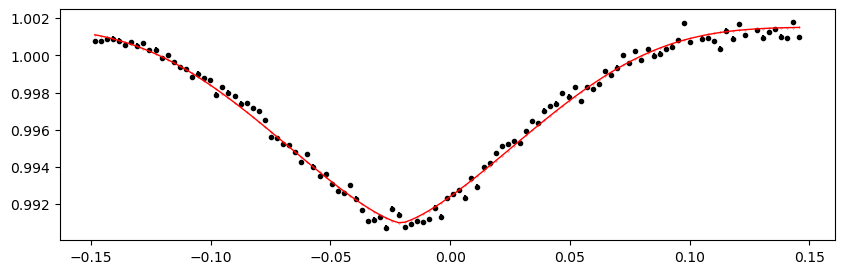

1607.17312 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 333.01it/s]


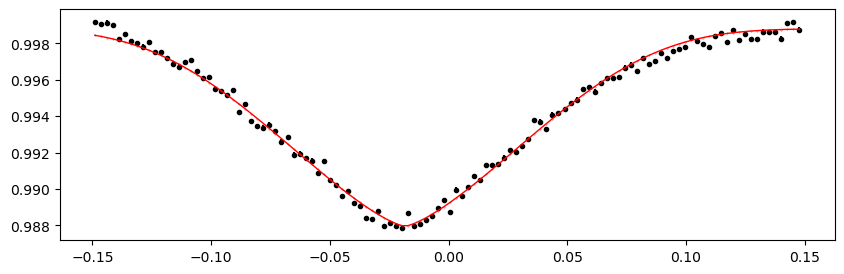

1607.72066 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.73it/s]


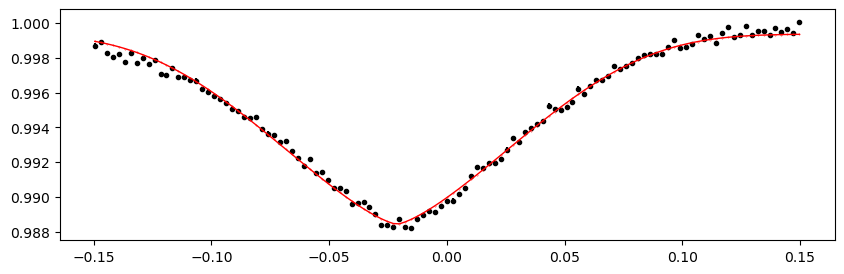

1608.2682 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.23it/s]


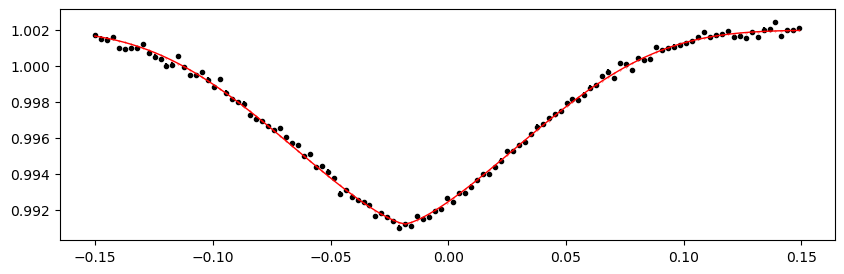

1608.81574 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.89it/s]


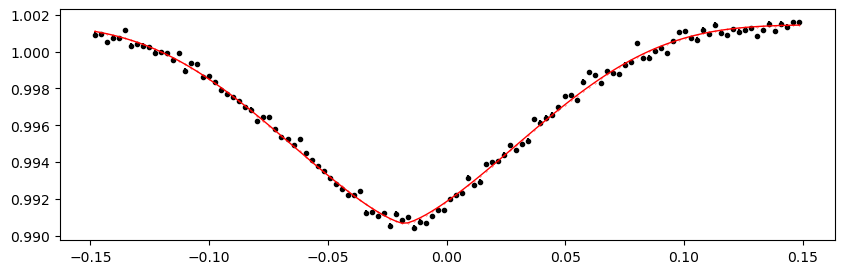

1609.36328 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.62it/s]


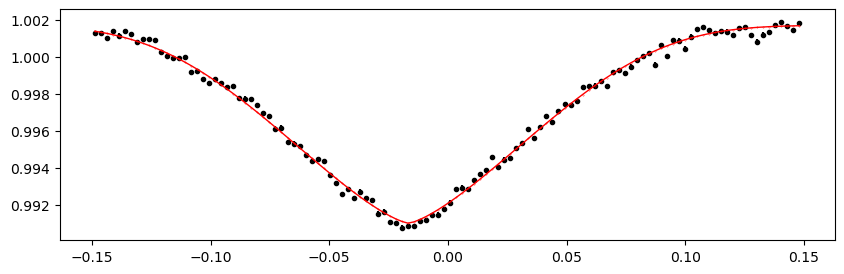

1614.29114 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.44it/s]


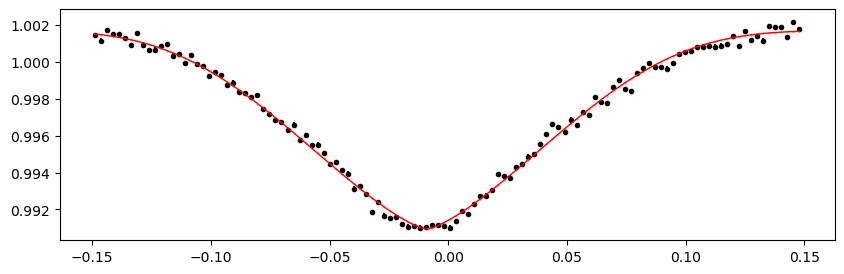

1614.83868 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.13it/s]


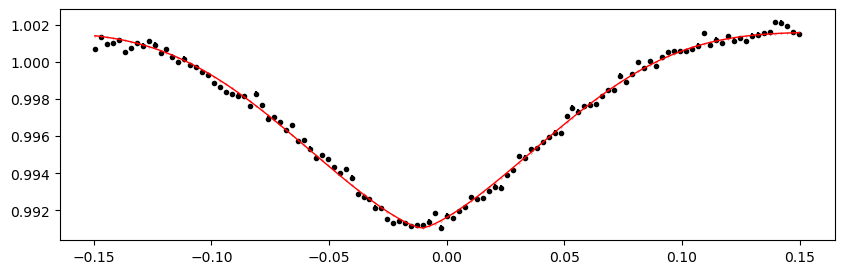

1615.38622 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.73it/s]


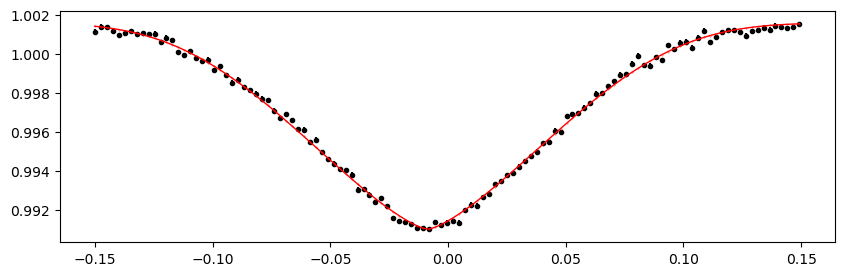

1615.9337600000001 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.52it/s]


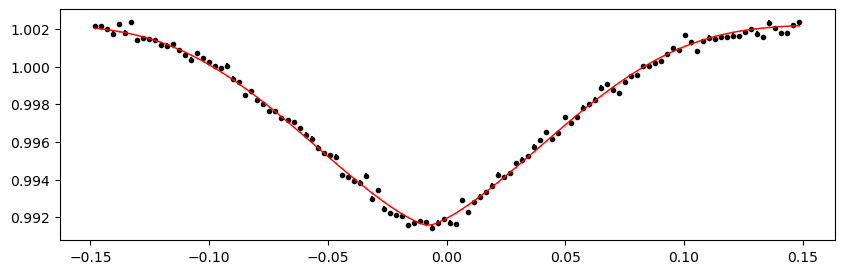

1616.4813 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.99it/s]


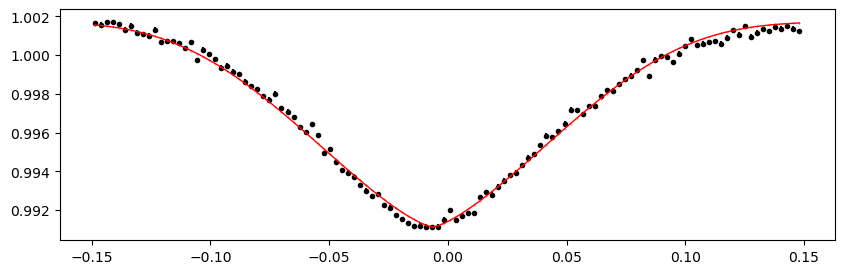

1617.02884 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.78it/s]


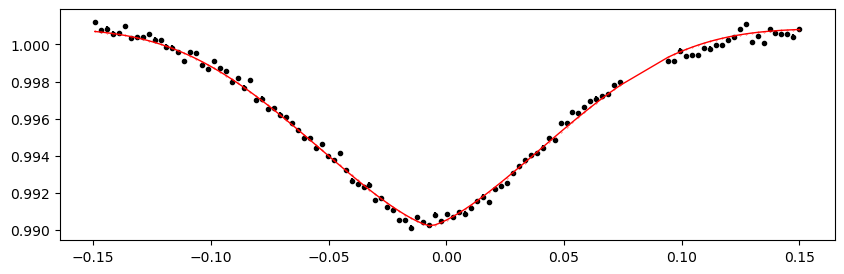

1617.57638 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.34it/s]


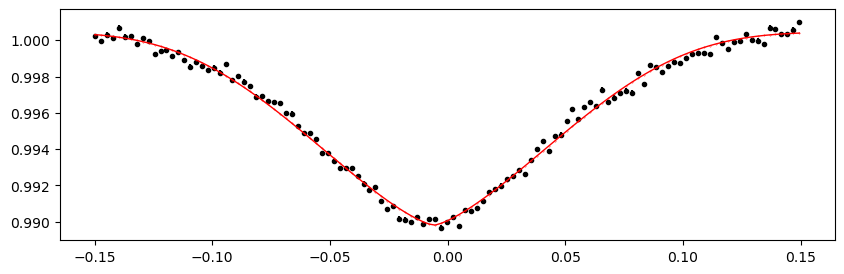

1618.12392 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.84it/s]


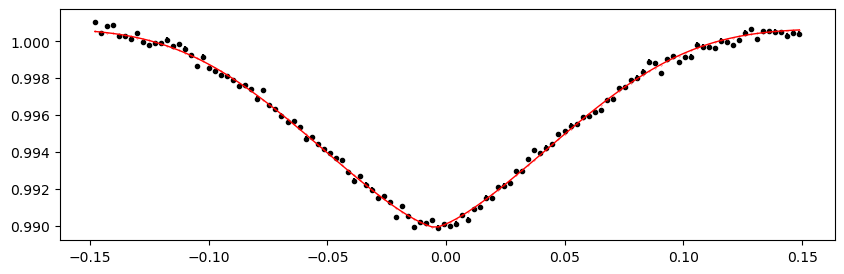

1618.67146 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.08it/s]


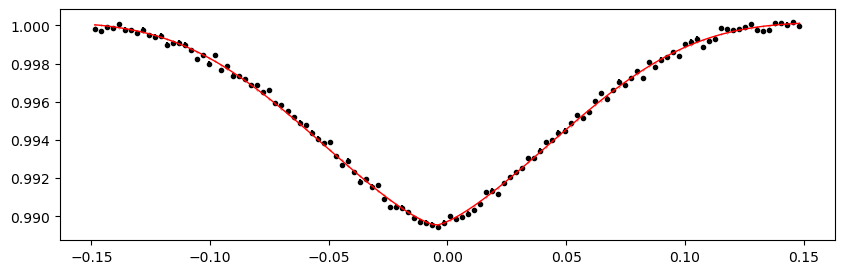

1619.219 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.56it/s]


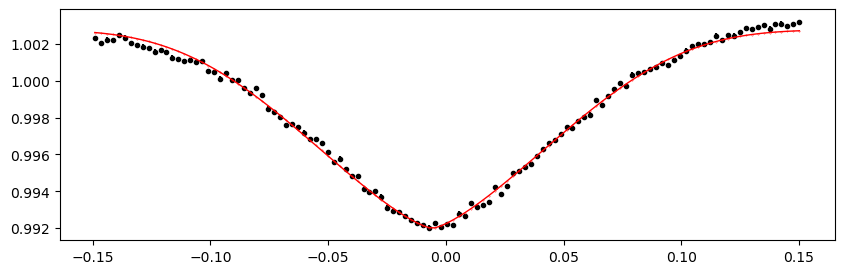

1619.76654 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.54it/s]


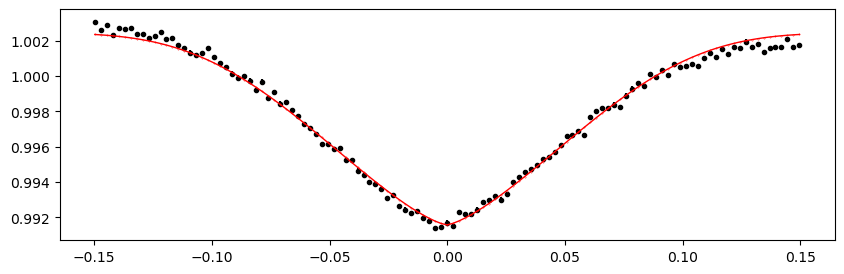

1620.31408 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.64it/s]


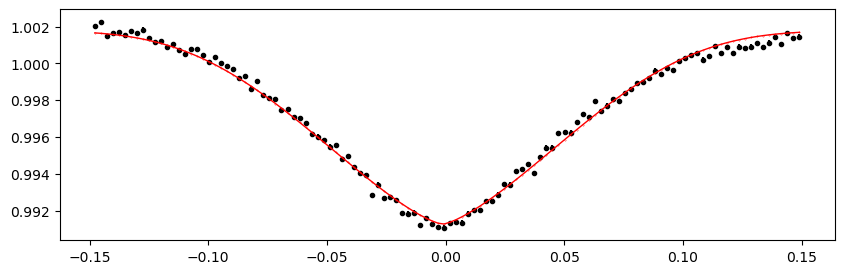

1620.86162 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.66it/s]


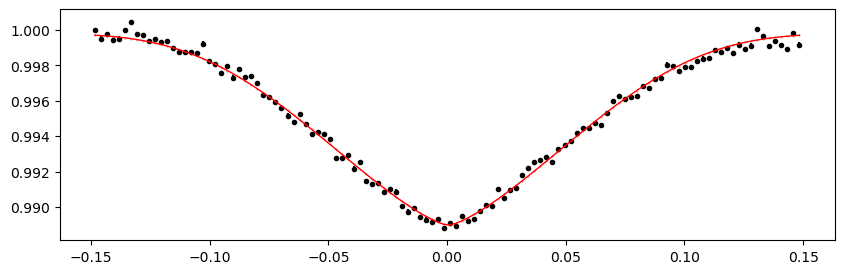

1621.40916 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.83it/s]


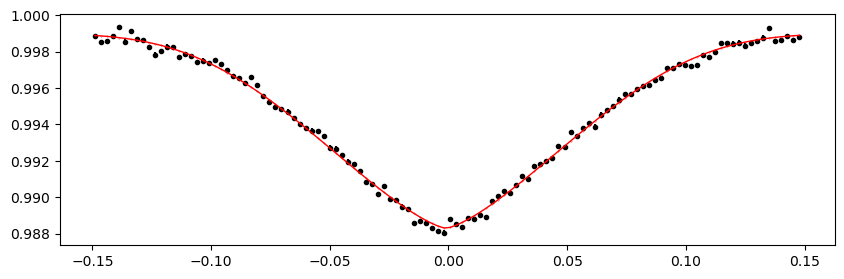

1621.9567 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.72it/s]


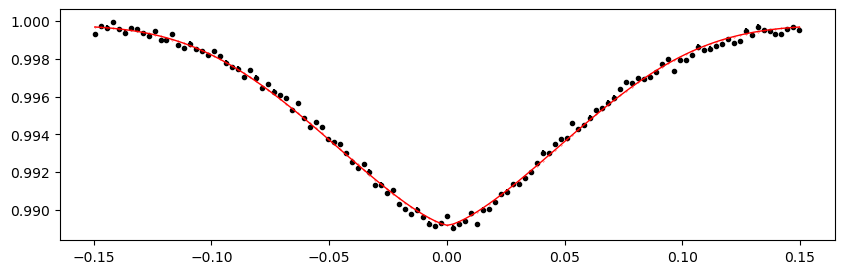

1622.50424 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.03it/s]


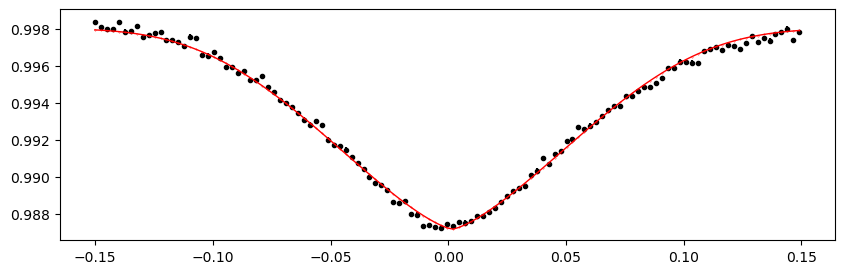

1623.05178 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.15it/s]


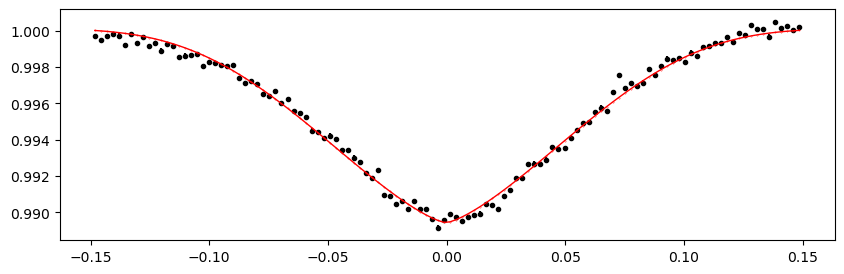

1623.59932 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.86it/s]


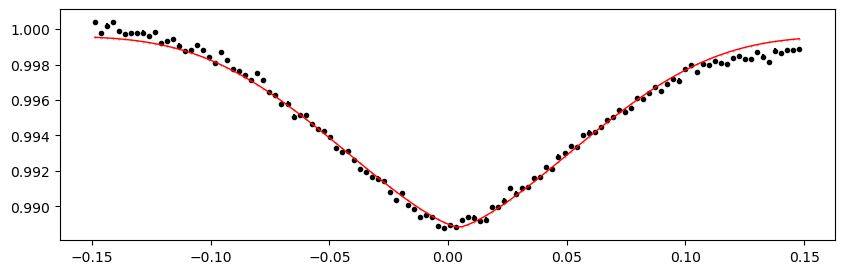

2334.30624 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.95it/s]


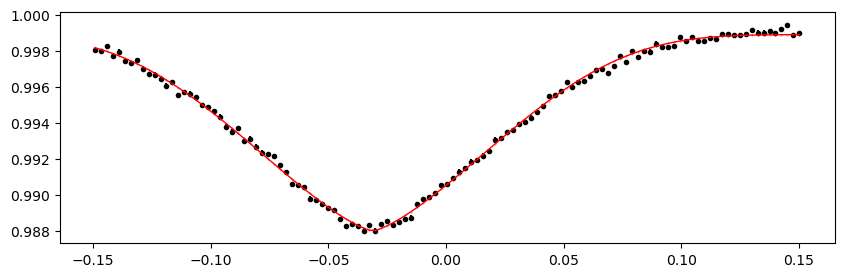

2334.85378 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.70it/s]


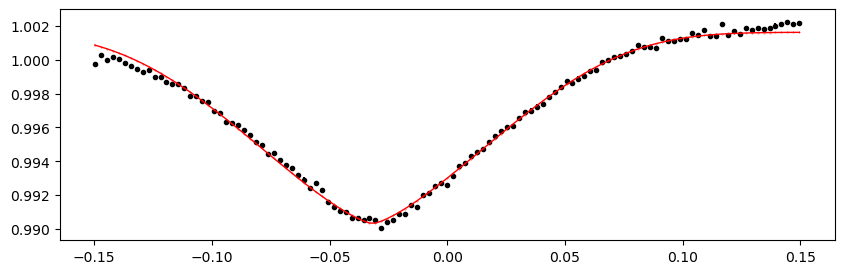

2335.40132 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.78it/s]


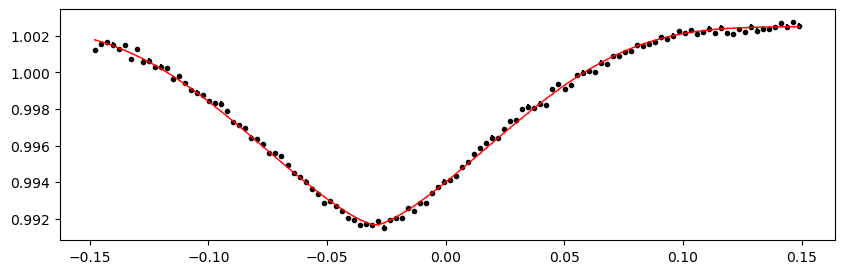

2335.94886 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.26it/s]


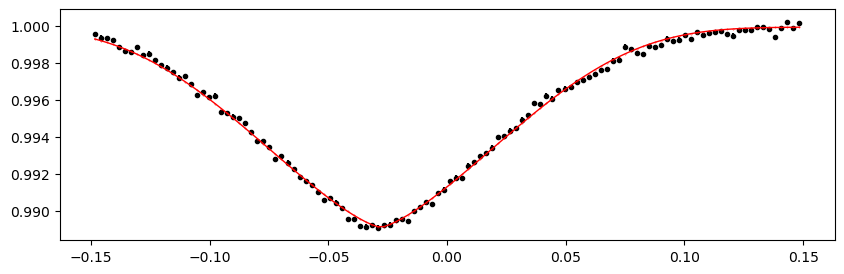

2336.4964 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.76it/s]


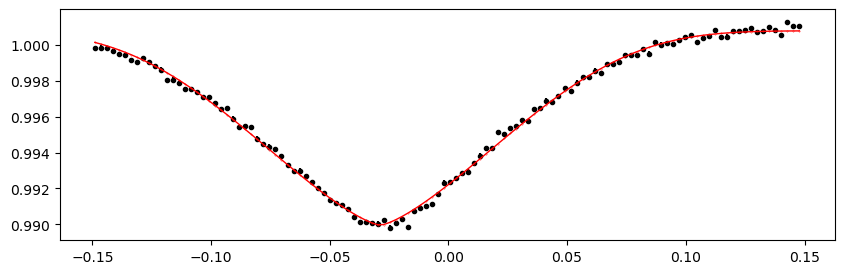

2337.04394 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.69it/s]


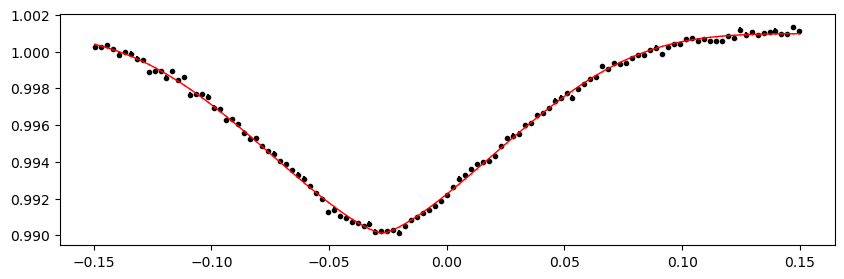

2337.59148 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.03it/s]


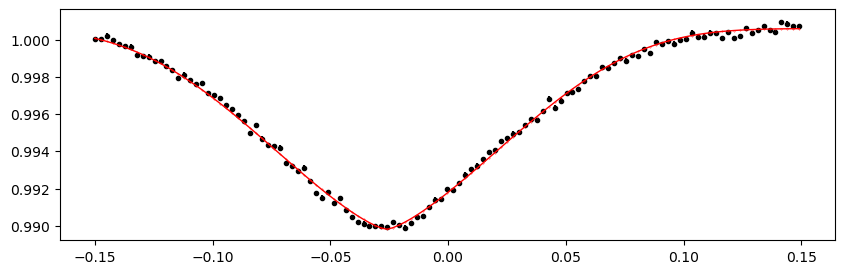

2338.13902 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.45it/s]


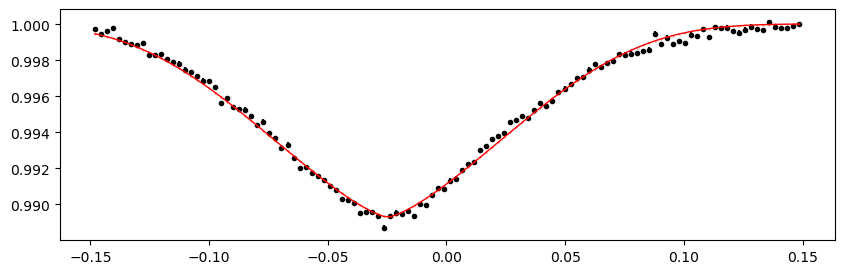

2338.68656 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.87it/s]


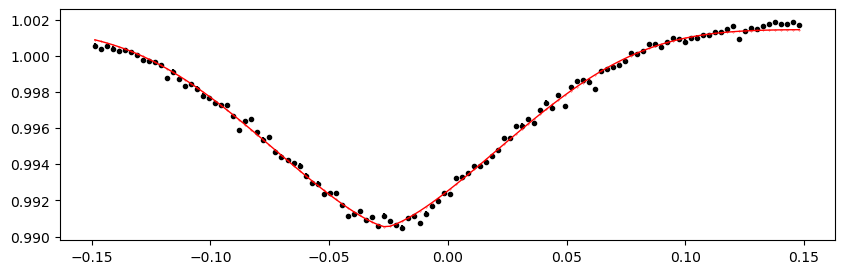

2339.2341 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.37it/s]


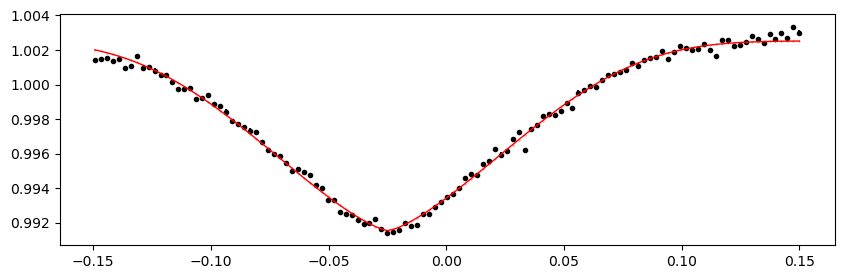

2339.78164 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.56it/s]


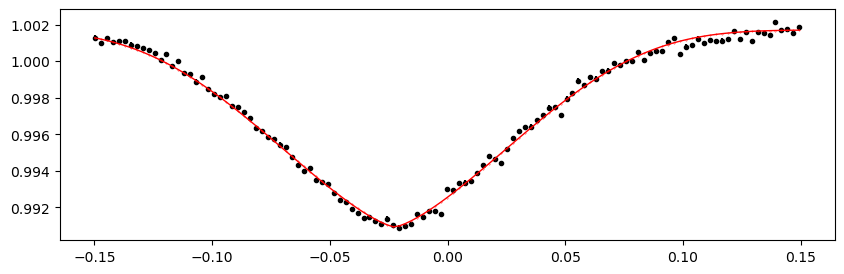

2340.32918 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.56it/s]


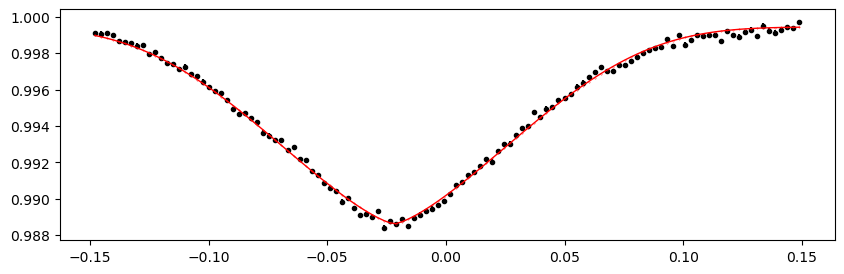

2340.87672 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.48it/s]


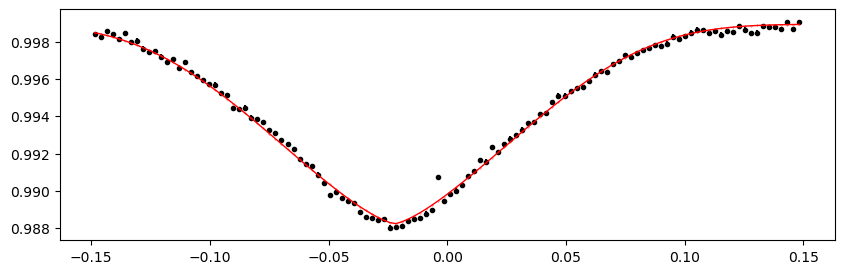

2341.42426 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.76it/s]


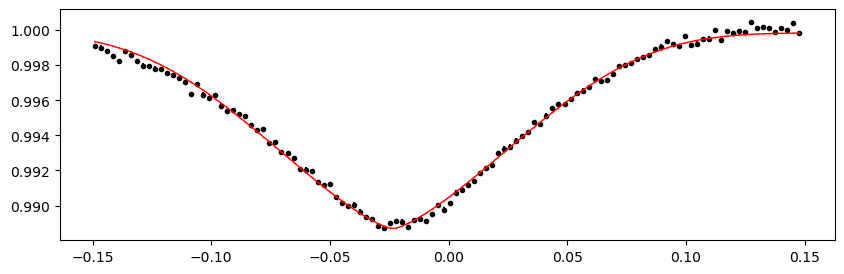

2341.9718000000003 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.33it/s]


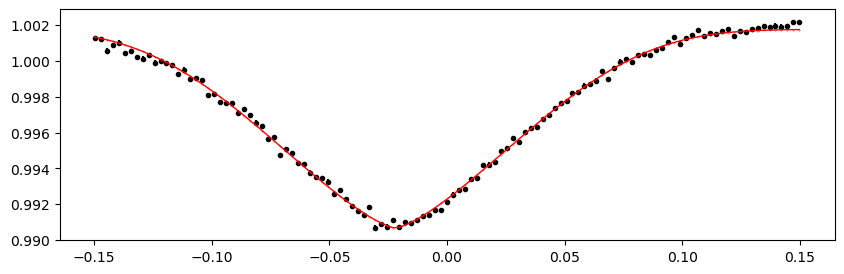

2342.51934 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.49it/s]


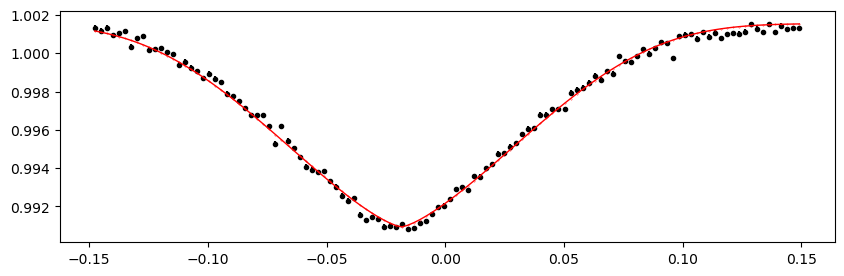

2343.0668800000003 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.15it/s]


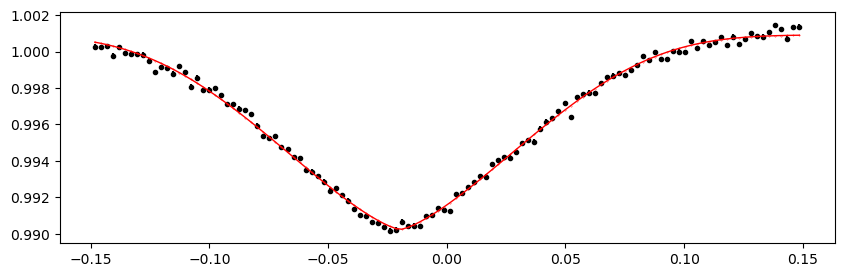

2343.61442 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.66it/s]


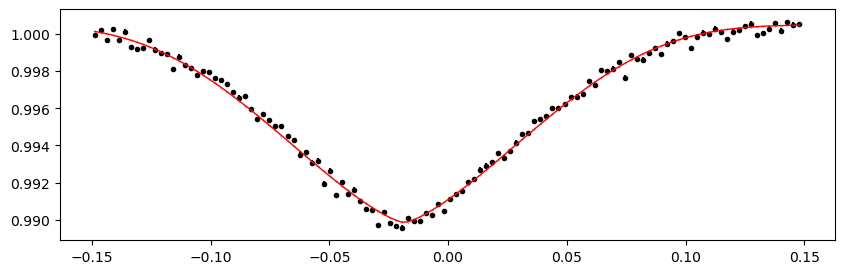

2344.16196 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.22it/s]


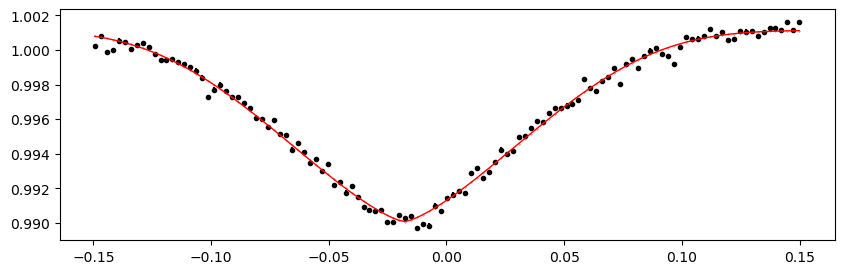

2344.7095 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.69it/s]


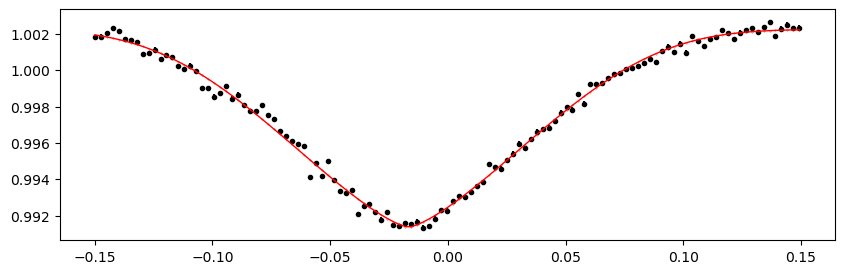

2345.25704 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.72it/s]


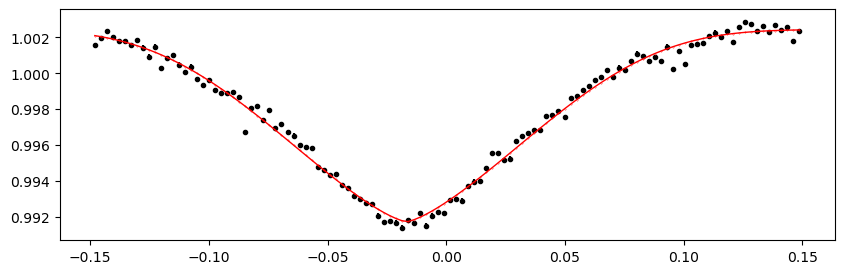

2345.80458 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.02it/s]


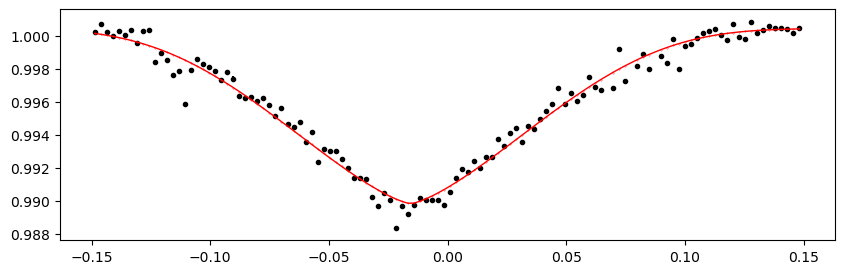

2346.35212 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.30it/s]


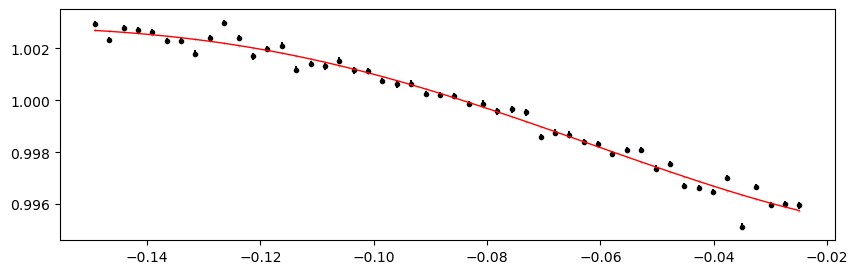

2347.4472 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.35it/s]


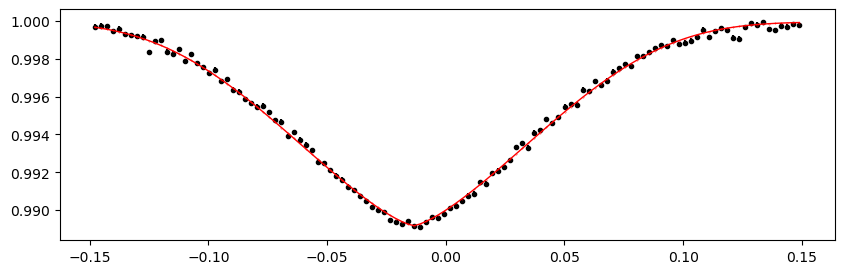

2347.99474 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.40it/s]


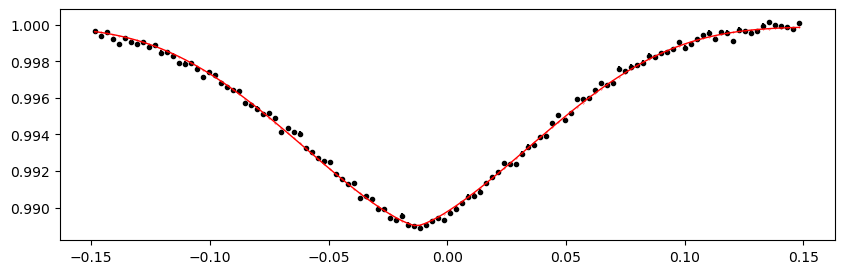

2348.54228 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.98it/s]


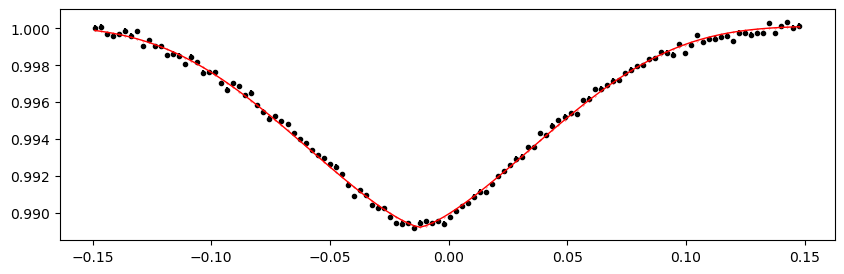

2349.08982 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.17it/s]


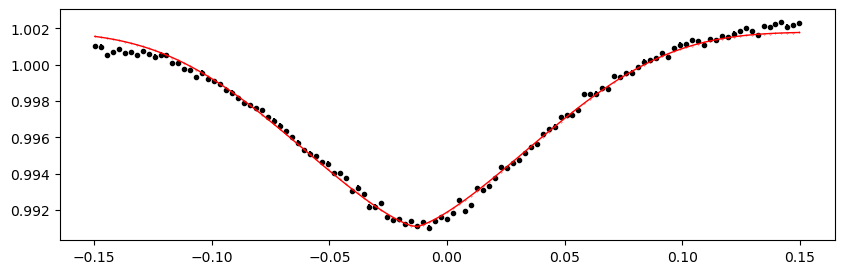

2349.63736 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.90it/s]


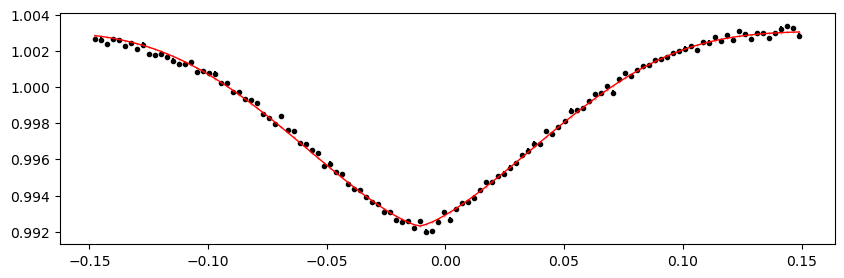

2350.1849 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.79it/s]


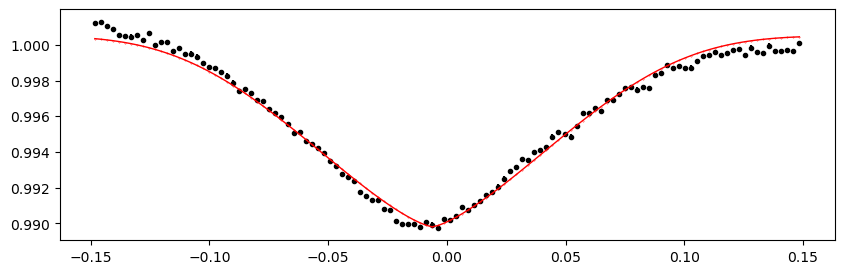

2350.7324399999998 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.39it/s]


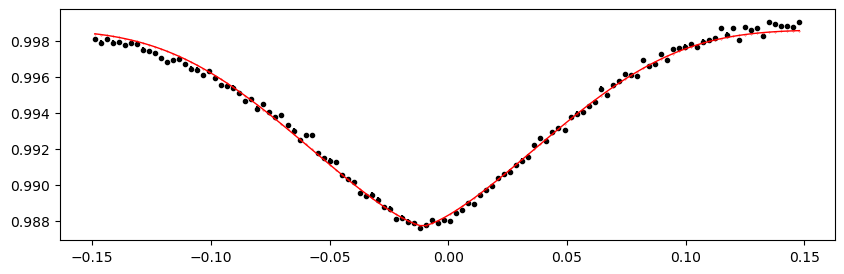

2351.2799800000003 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.12it/s]


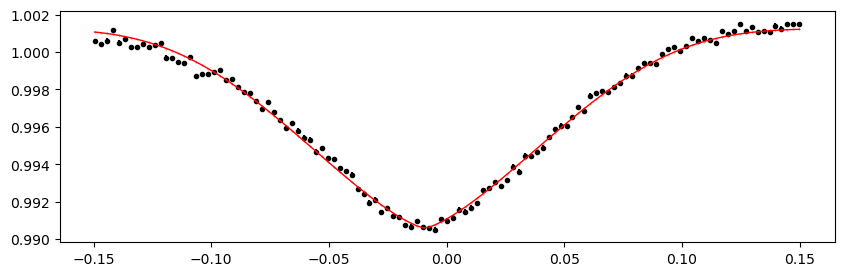

2351.82752 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.90it/s]


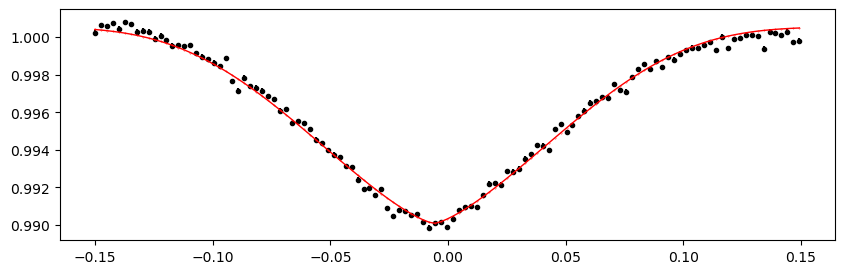

2352.3750600000003 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.10it/s]


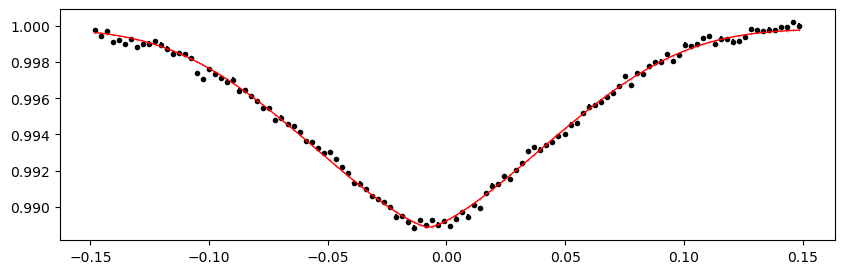

2352.9226 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.17it/s]


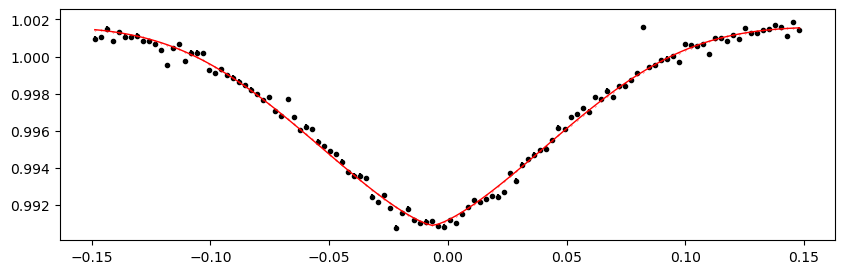

2353.47014 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.17it/s]


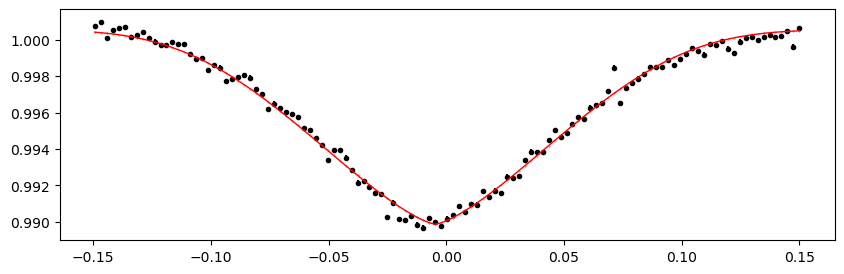

2354.01768 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.45it/s]


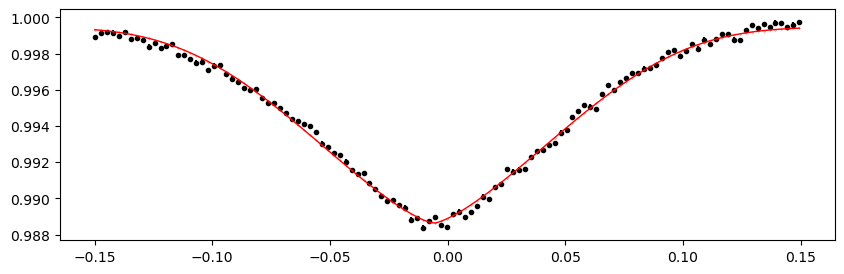

2354.56522 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.32it/s]


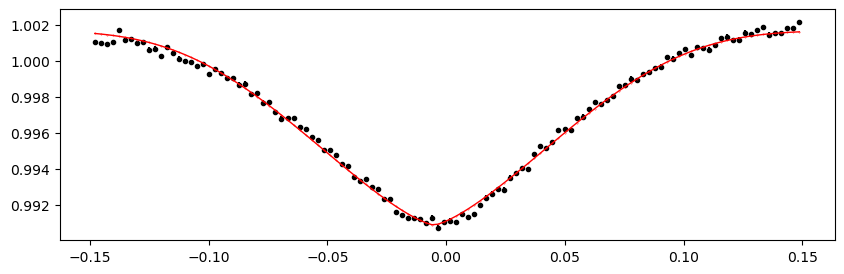

2355.11276 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.90it/s]


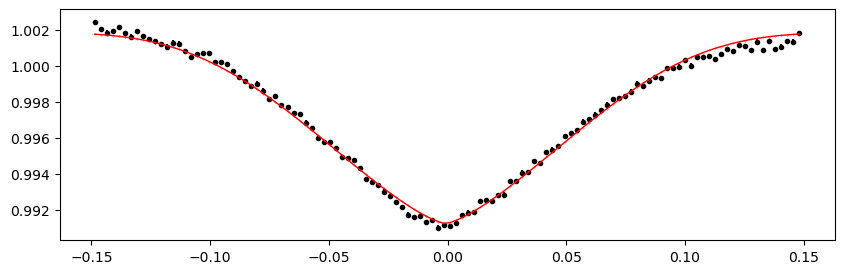

2355.6603 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.31it/s]


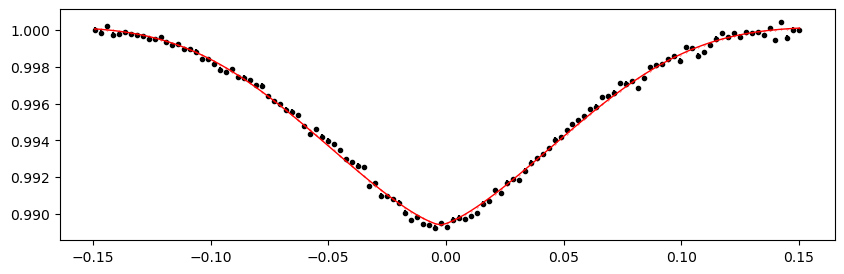

2356.20784 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.34it/s]


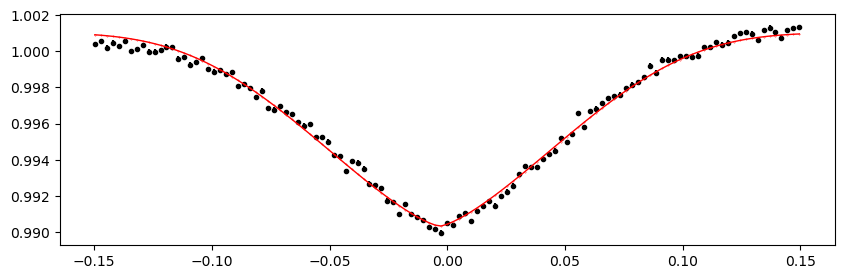

2356.75538 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.65it/s]


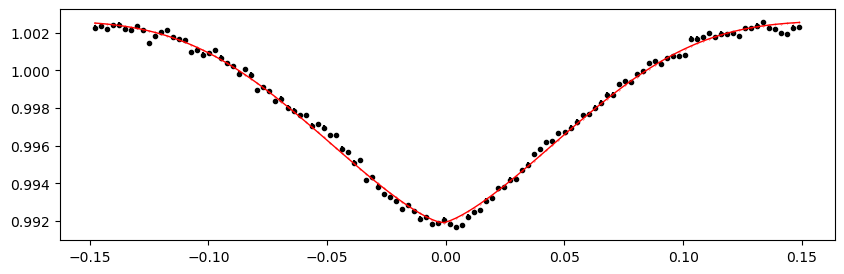

2357.30292 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.16it/s]


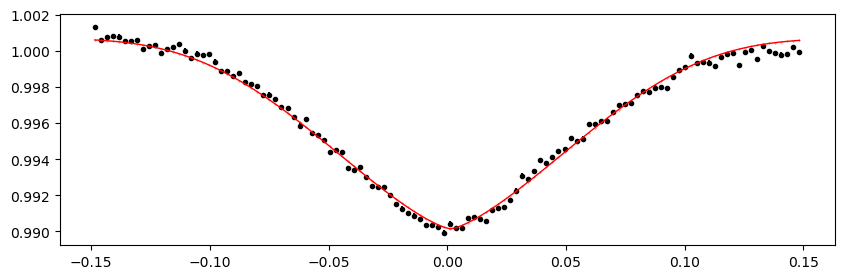

2357.85046 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.91it/s]


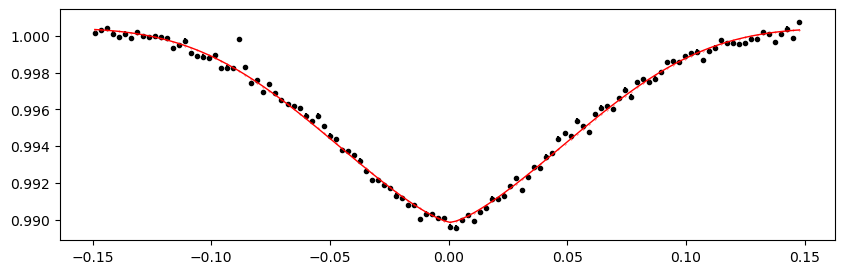

2358.398 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.10it/s]


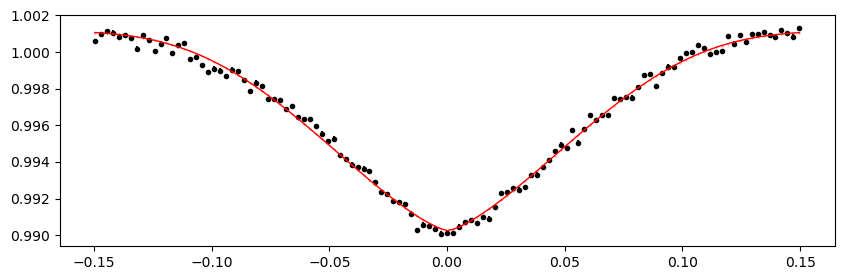

2358.94554 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.07it/s]


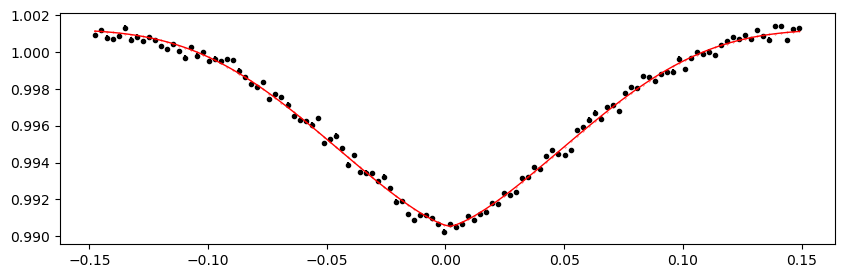

2359.49308 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.86it/s]


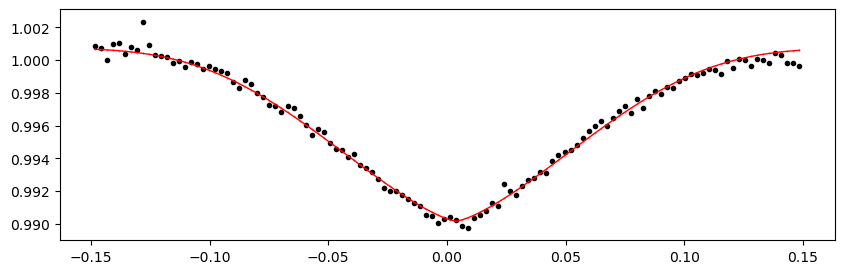

2360.04062 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.07it/s]


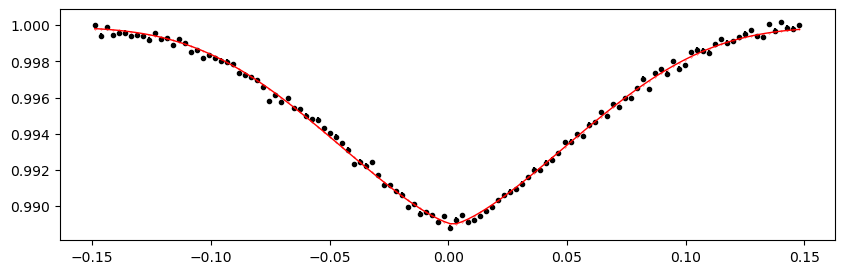

2360.5881600000002 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.97it/s]


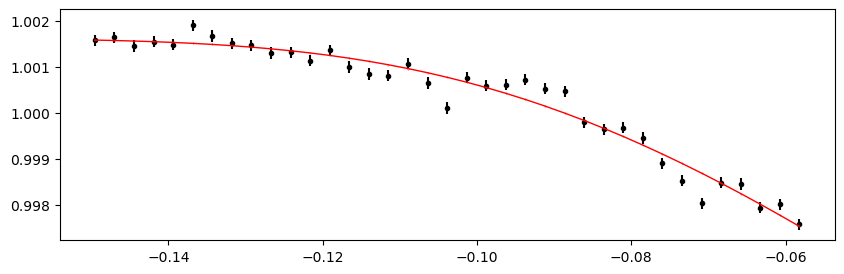

3069.1049199999998 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.86it/s]


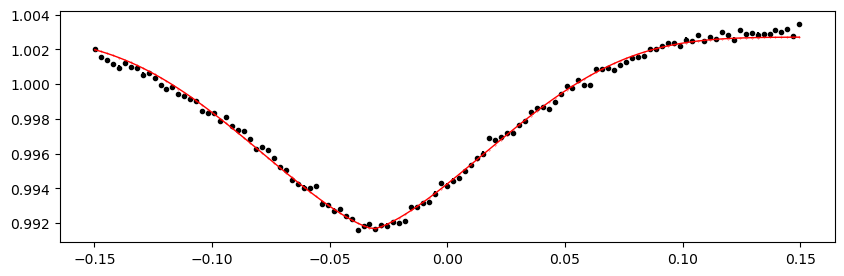

3069.6524600000002 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.03it/s]


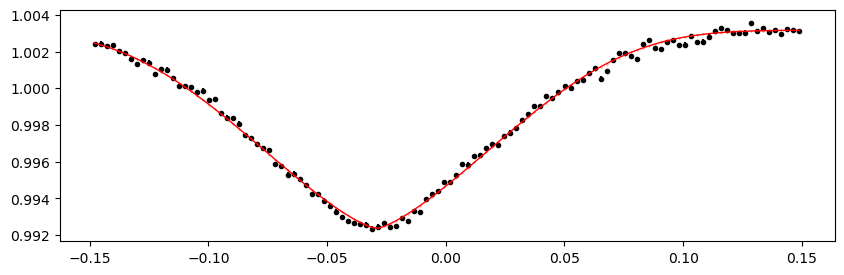

3070.2 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.94it/s]


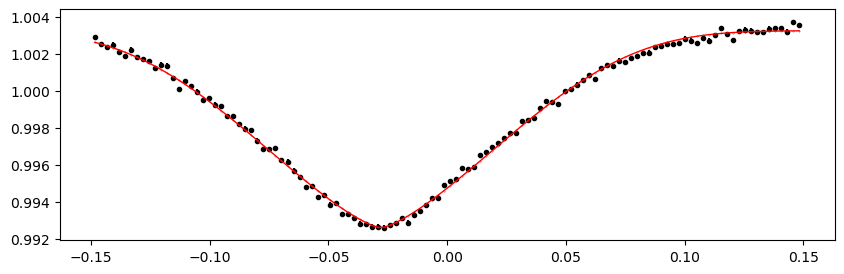

3070.7475400000003 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.53it/s]


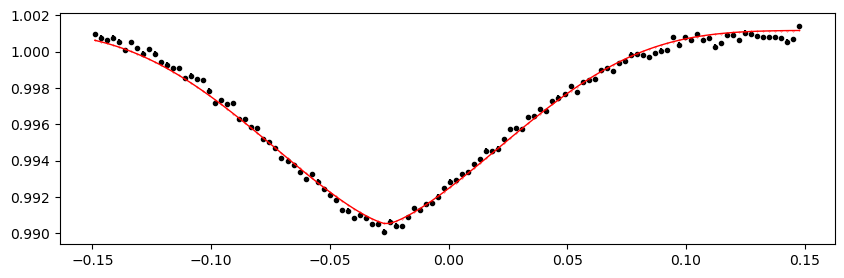

3071.29508 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.76it/s]


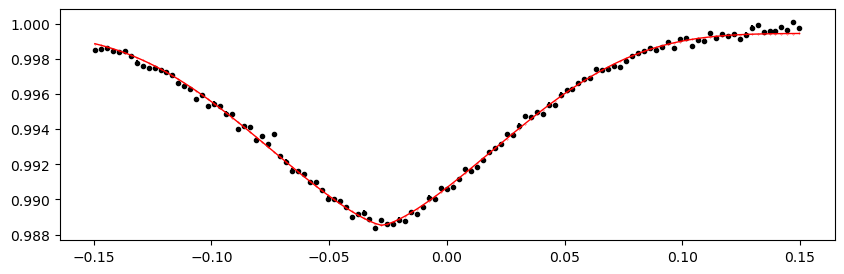

3071.8426200000004 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.56it/s]


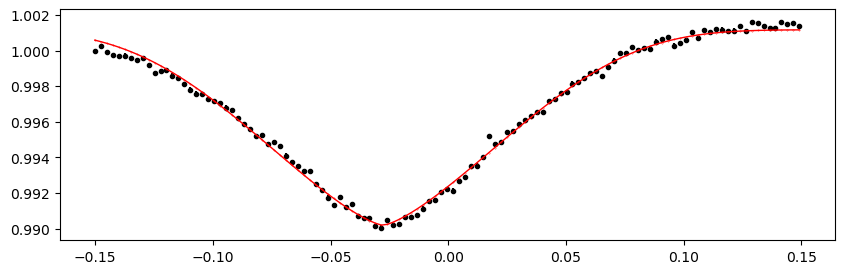

3072.39016 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.64it/s]


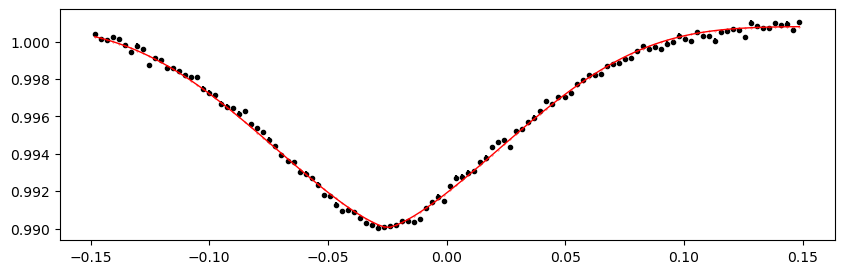

3072.9377000000004 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.53it/s]


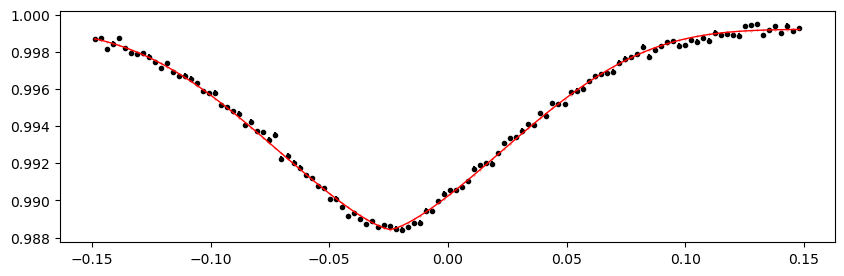

3073.48524 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 319.38it/s]


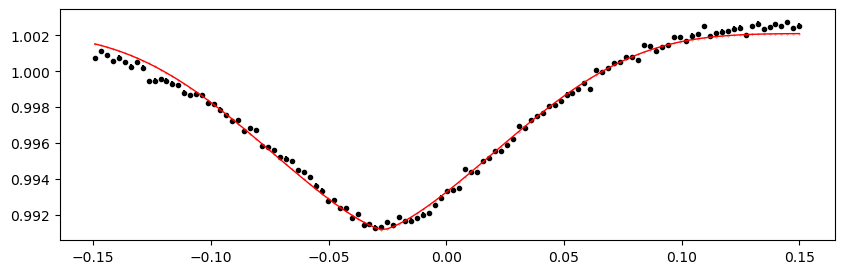

3074.03278 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.48it/s]


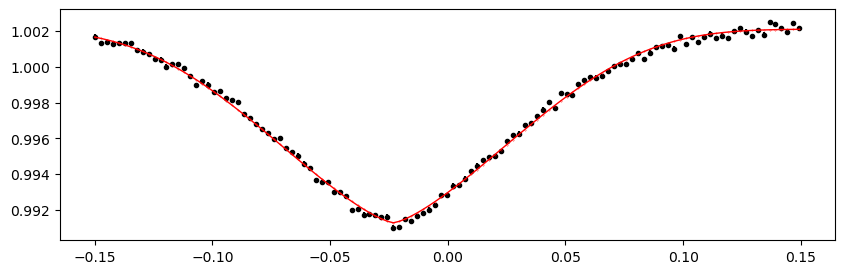

3074.58032 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.01it/s]


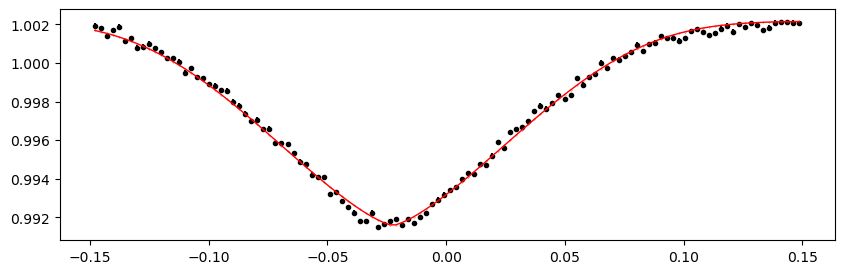

3075.12786 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.73it/s]


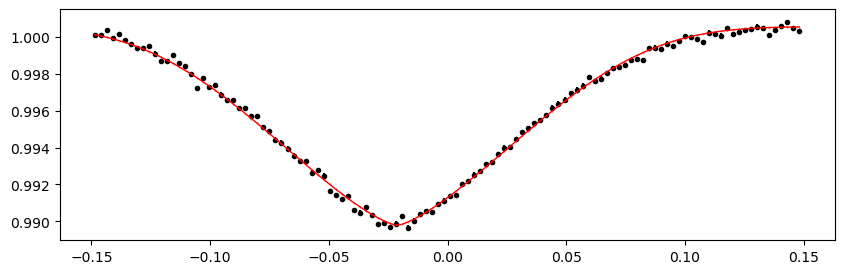

3075.6754 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.69it/s]


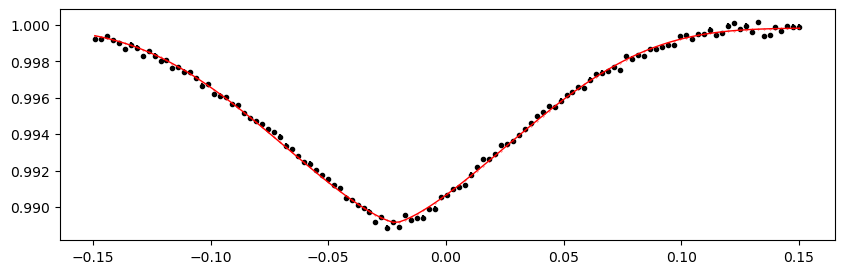

3076.22294 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.90it/s]


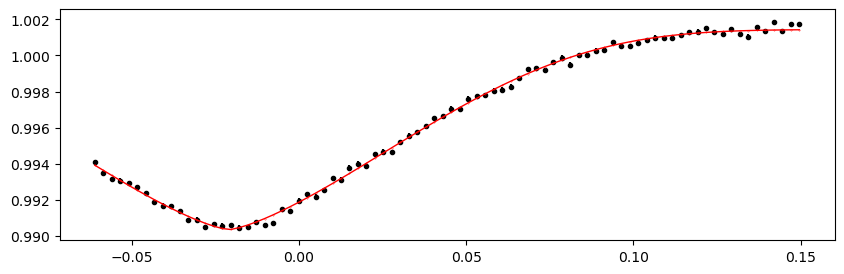

3076.77048 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.67it/s]


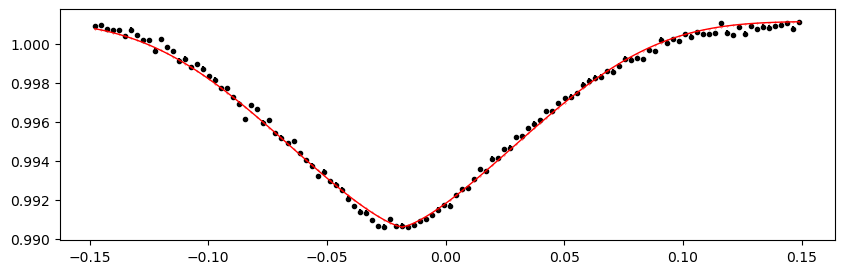

3077.31802 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.58it/s]


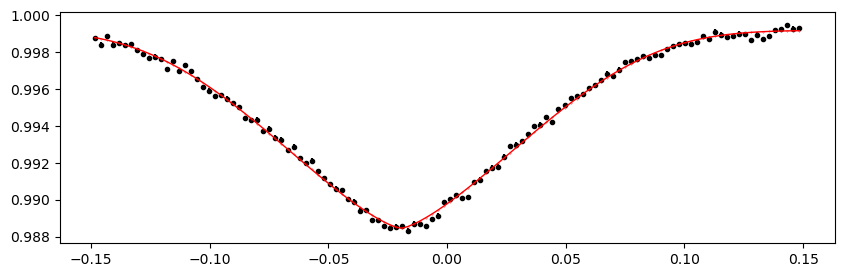

3077.86556 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.64it/s]


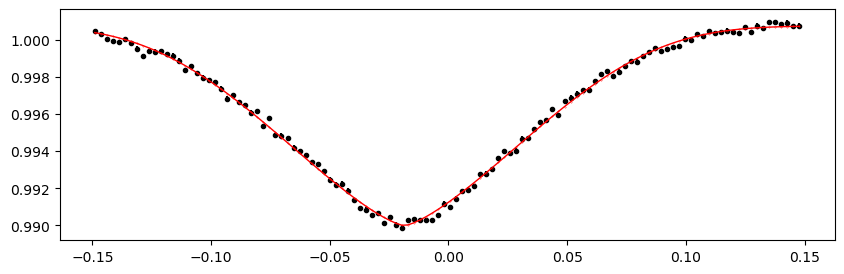

3078.4130999999998 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.81it/s]


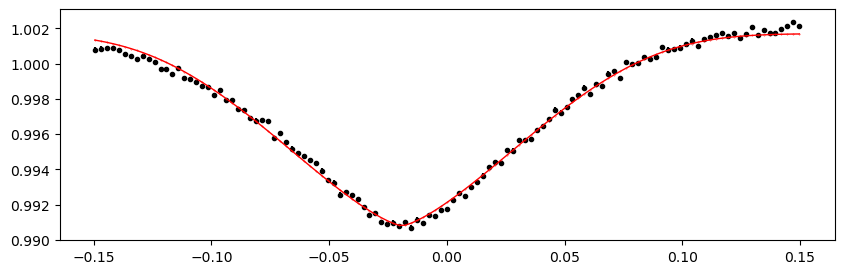

3078.9606400000002 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.39it/s]


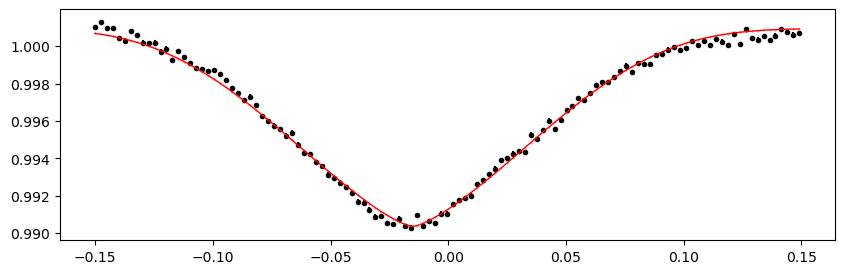

3079.50818 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.23it/s]


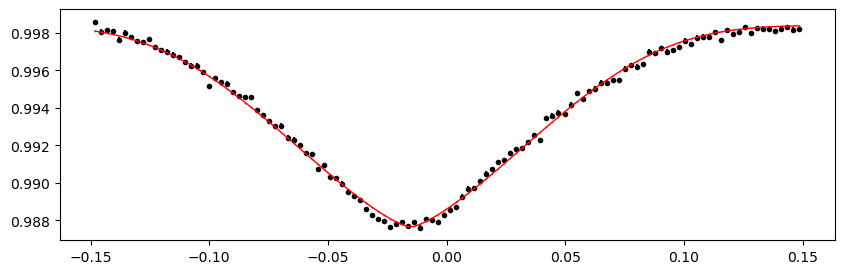

3080.0557200000003 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.42it/s]


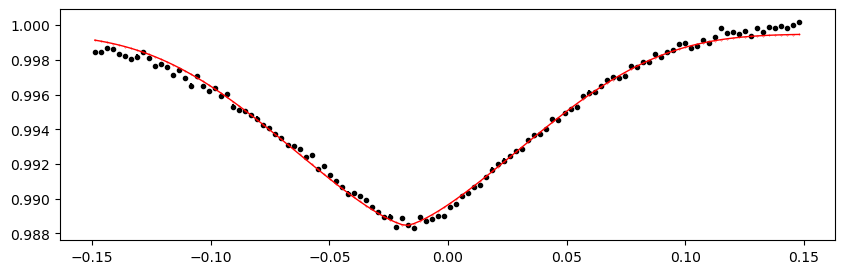

3080.60326 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.08it/s]


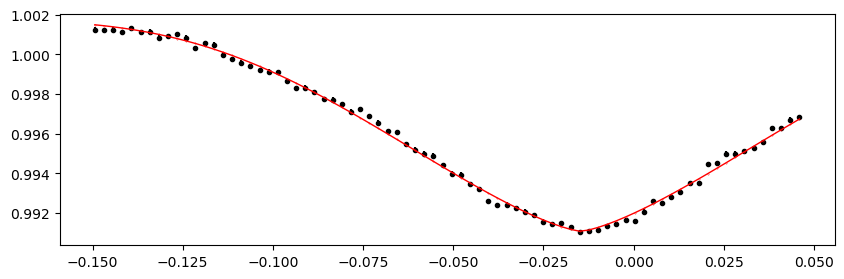

3082.2458800000004 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.01it/s]


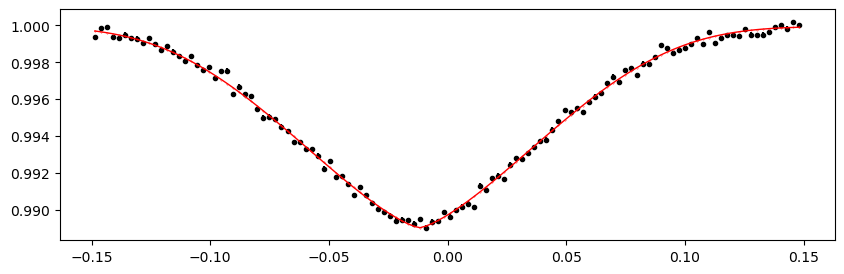

3082.79342 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.00it/s]


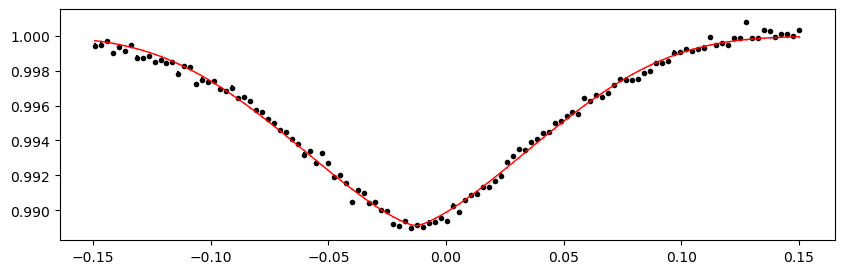

3083.34096 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.43it/s]


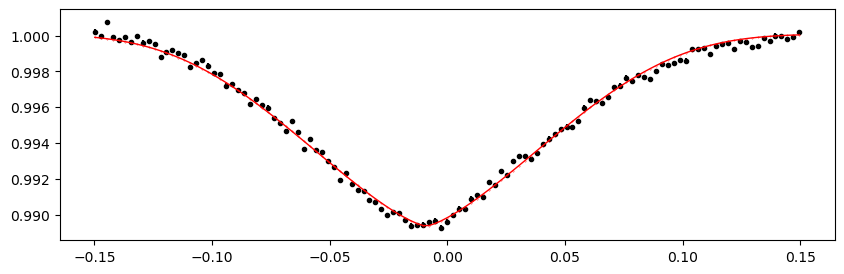

3083.8885 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.08it/s]


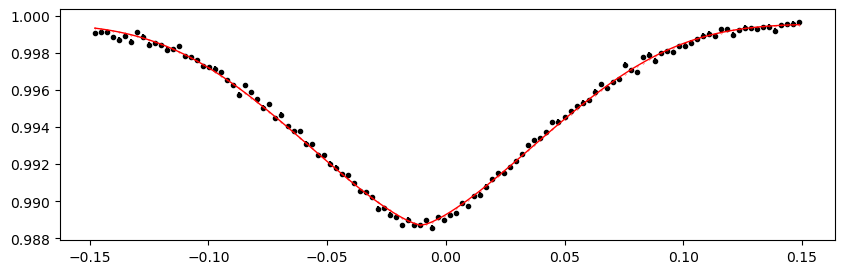

3084.43604 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.16it/s]


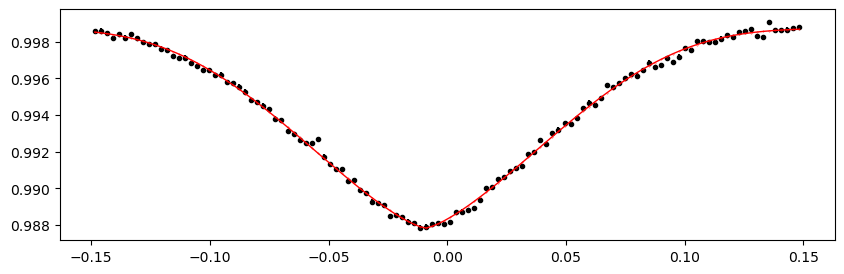

3084.98358 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.45it/s]


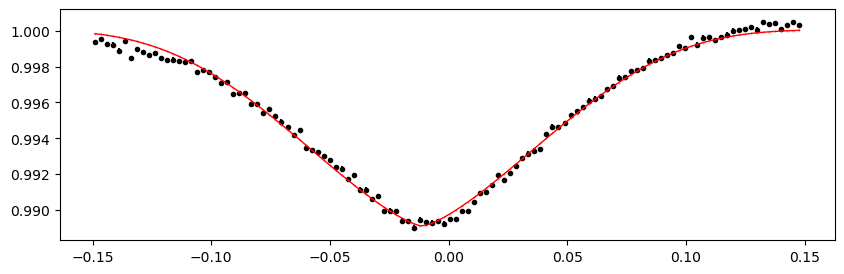

3085.53112 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.29it/s]


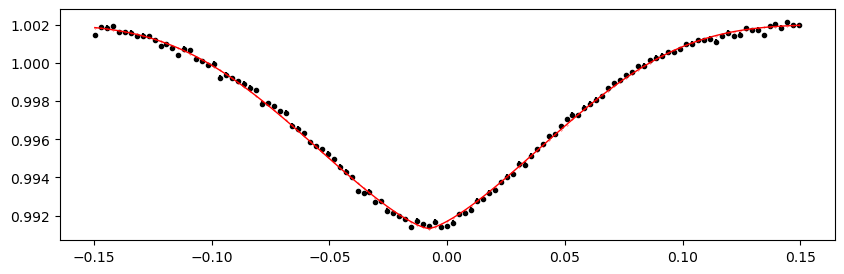

3086.07866 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.97it/s]


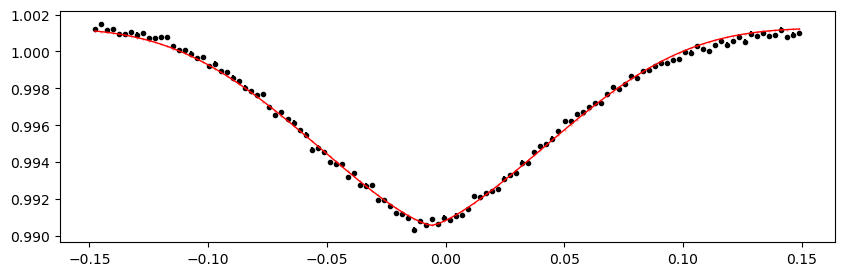

3086.6262 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.20it/s]


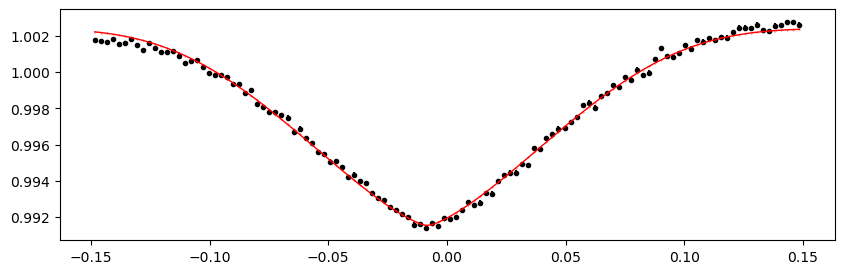

3087.17374 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.18it/s]


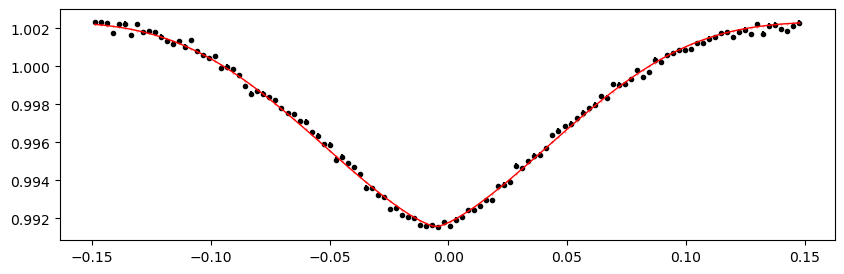

3087.7212799999998 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.93it/s]


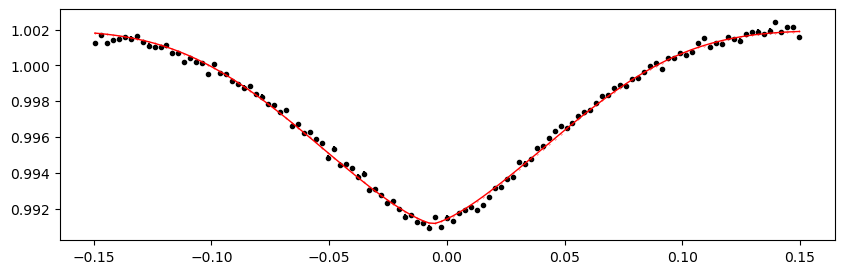

3088.2688200000002 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.63it/s]


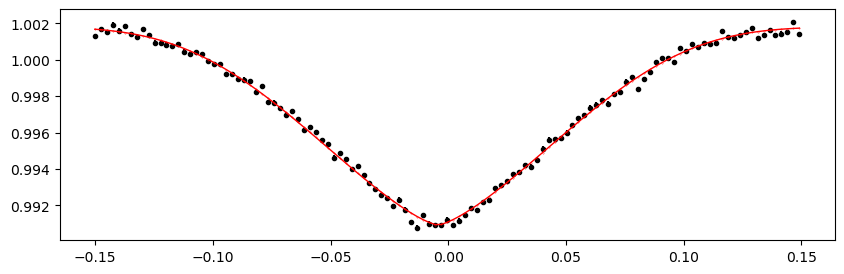

3088.81636 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.22it/s]


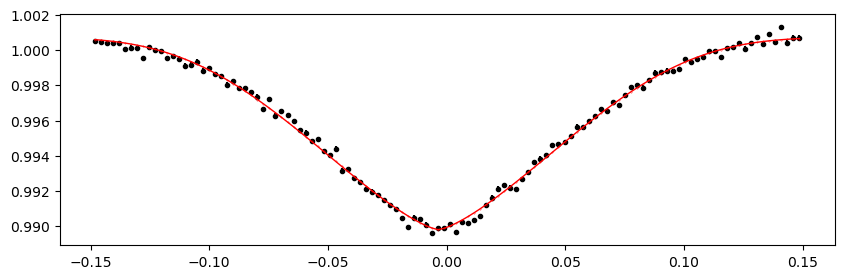

3089.3639000000003 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.31it/s]


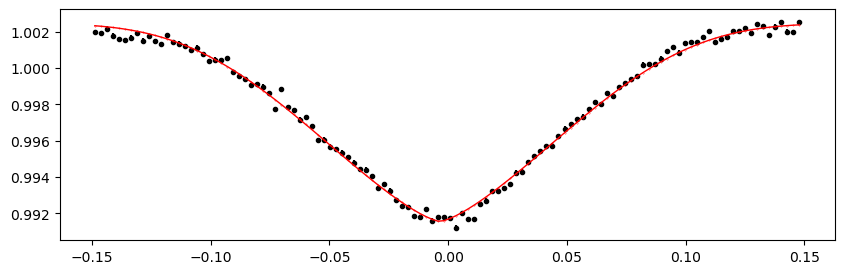

3089.91144 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.66it/s]


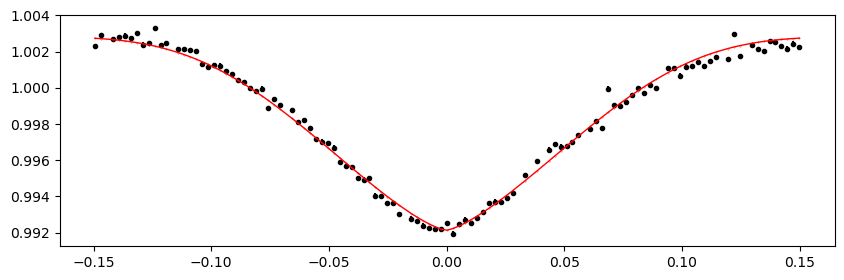

3090.4589800000003 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.96it/s]


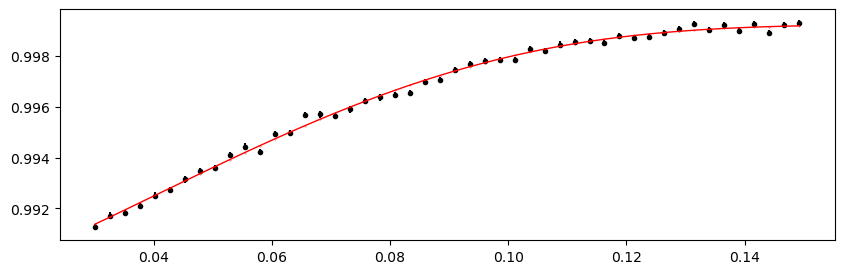

3091.00652 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.51it/s]


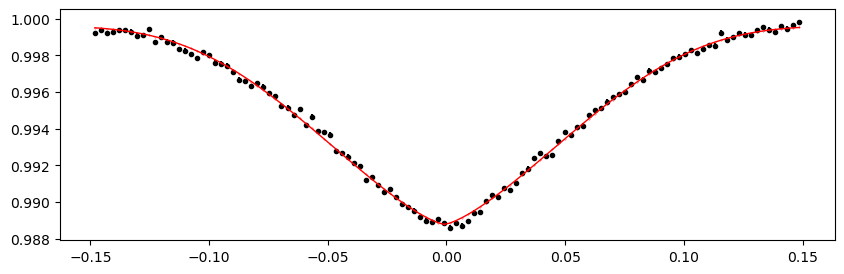

3091.5540600000004 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.47it/s]


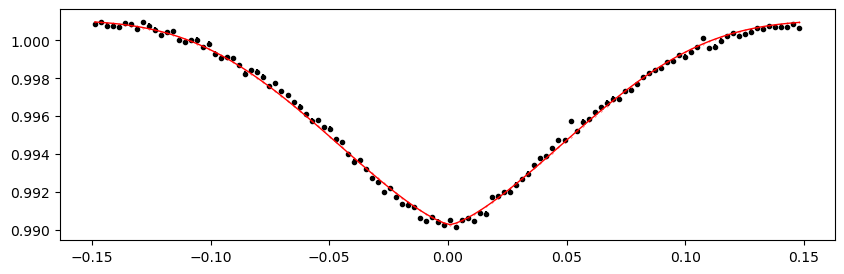

3092.1016 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.50it/s]


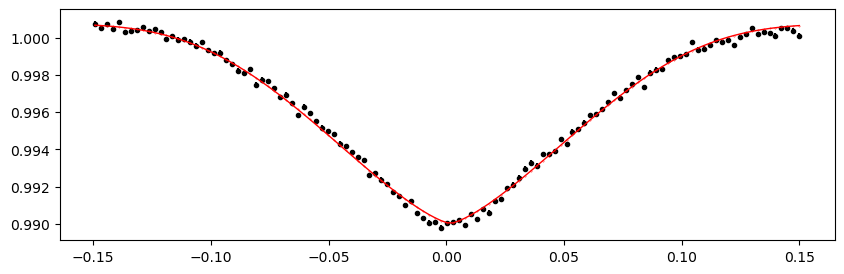

3092.64914 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.73it/s]


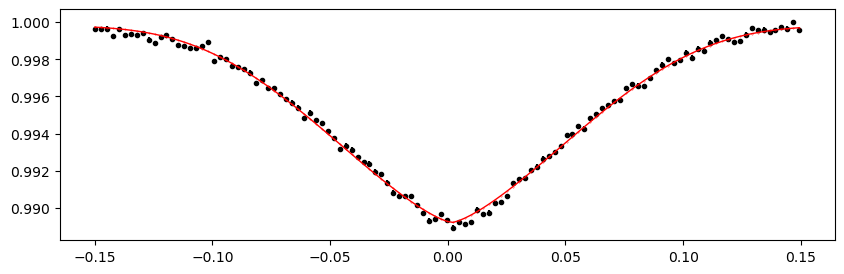

3093.19668 1.0007967602762213 -0.010506693224773132 0.21169162658024948


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.90it/s]


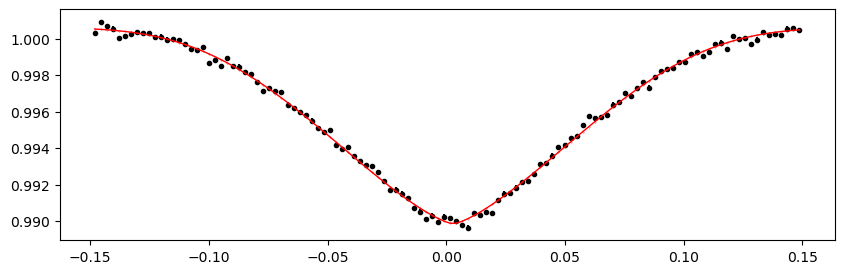

Fitting individual secondary eclipses...
Creating new manifest file
1599.78133 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.06it/s]


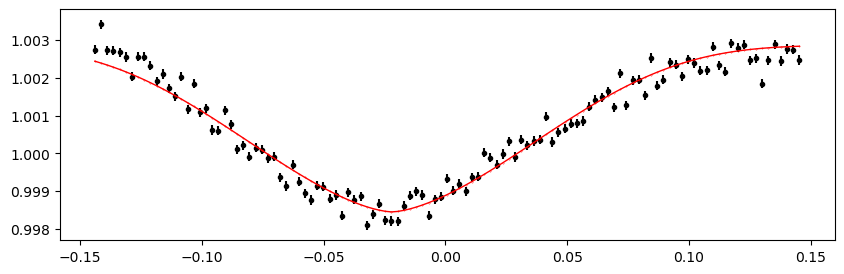

1600.32887 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.05it/s]


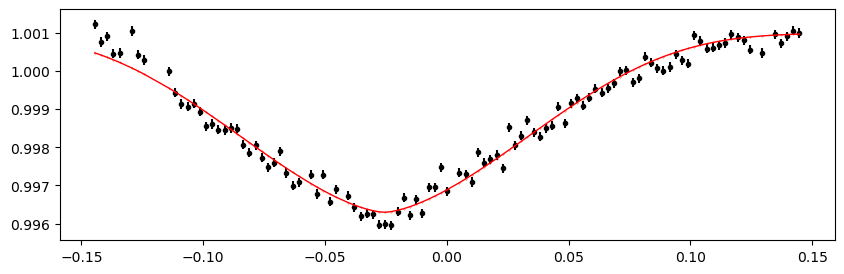

1600.87641 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.52it/s]


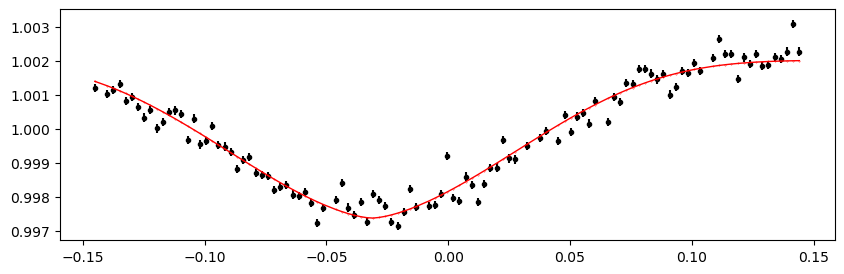

1601.42395 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.68it/s]


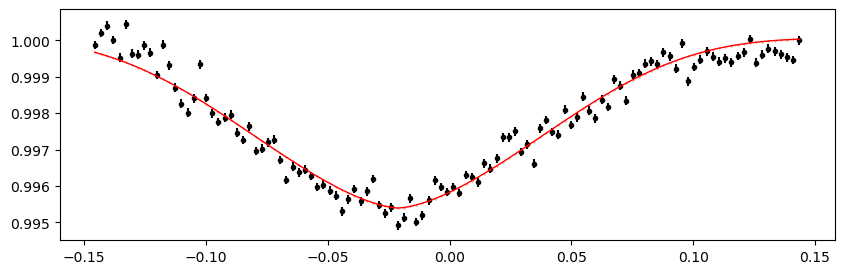

1601.97149 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.11it/s]


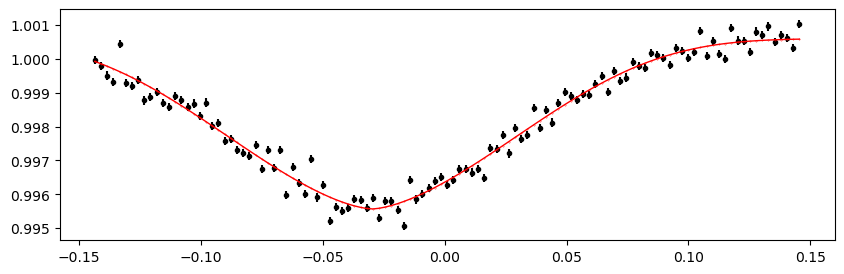

1602.51903 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.71it/s]


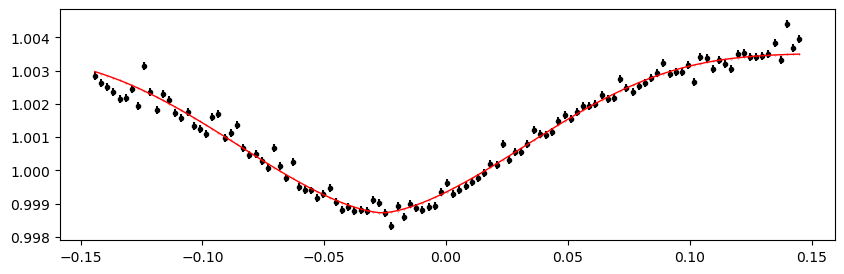

1603.06657 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.92it/s]


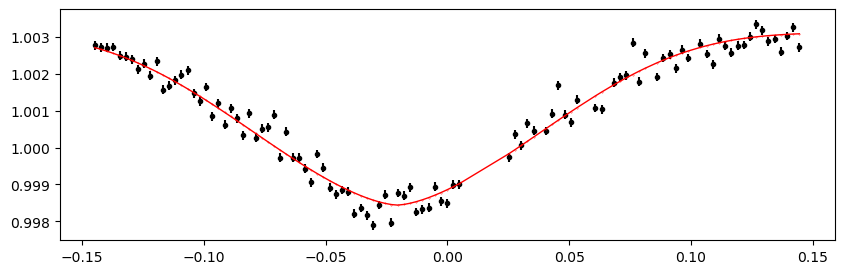

1603.61411 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


 35%|███████████████████▎                                    | 3453/10000 [00:09<00:17, 370.66it/s]


KeyboardInterrupt: 

In [100]:
%matplotlib inline

from importlib import reload
reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               # min_number_data=10,  # to handle 10 min cadence data
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"


Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 1 has already been completed -- skip
Number 2 has already been completed -- skip
Number 3 has already been completed -- skip
Number 4 has already been completed -- skip
Number 5 has already been completed -- skip
Number 6 has already been completed -- skip
Number 7 has already been completed -- skip
1603.61411 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.70it/s]


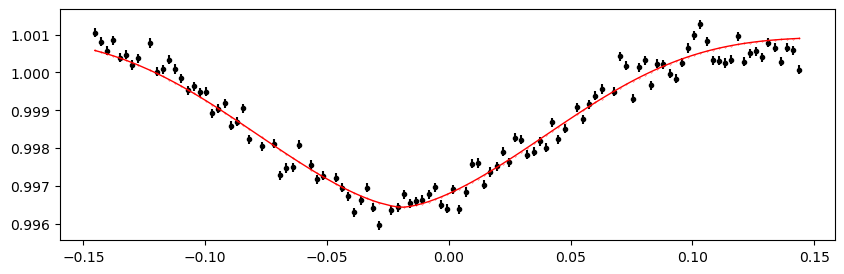

1604.16165 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.90it/s]


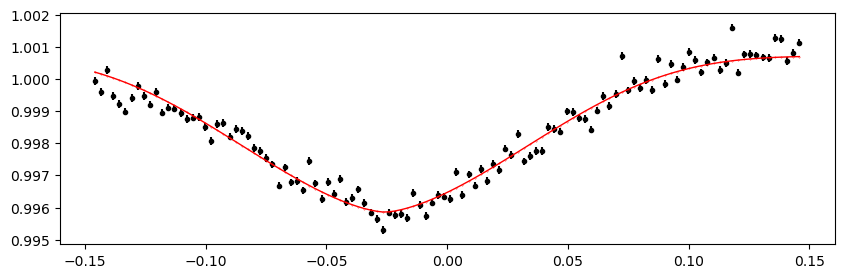

1604.70919 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.26it/s]


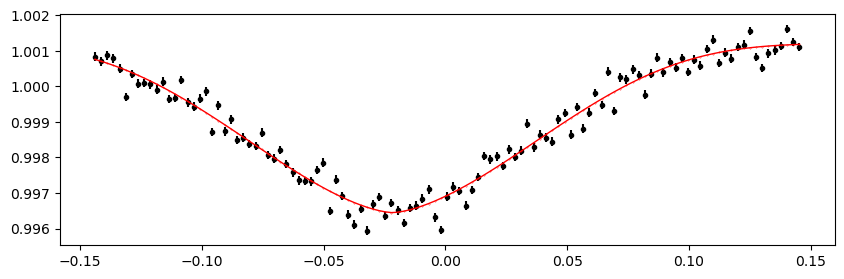

1605.25673 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.40it/s]


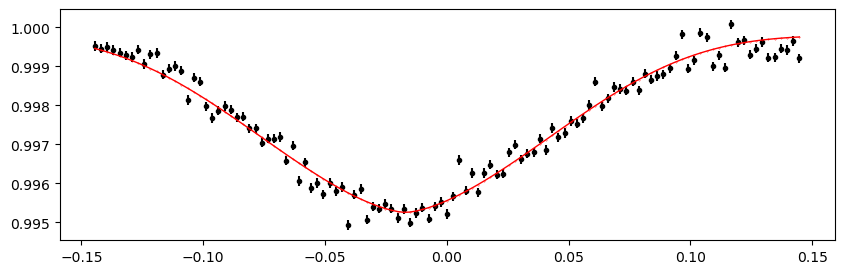

1605.80427 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.93it/s]


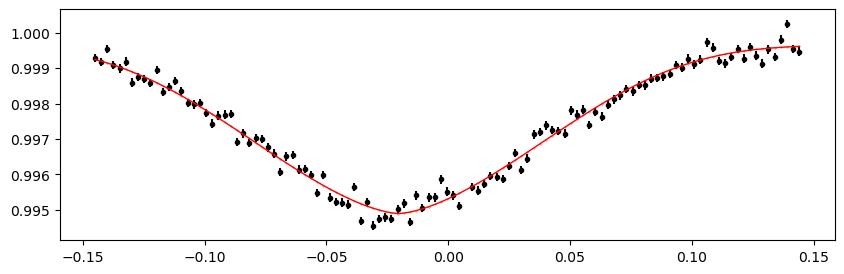

1606.35181 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.09it/s]


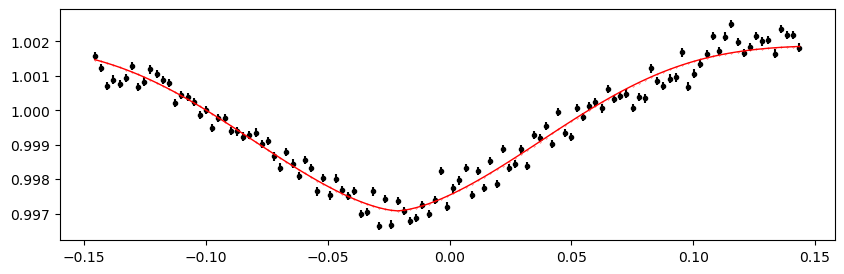

1606.89935 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.67it/s]


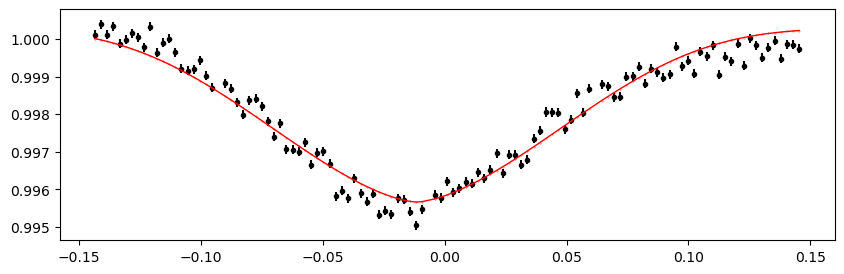

1607.44689 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.63it/s]


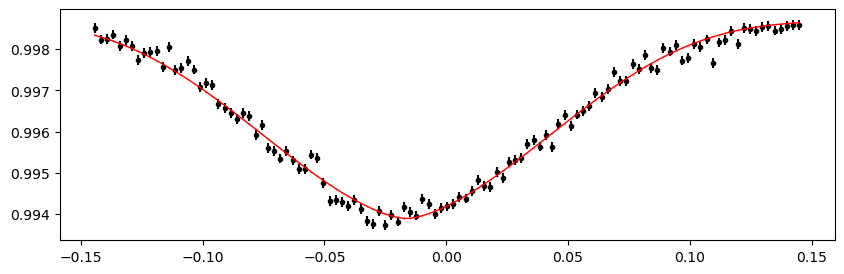

1607.99443 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.64it/s]


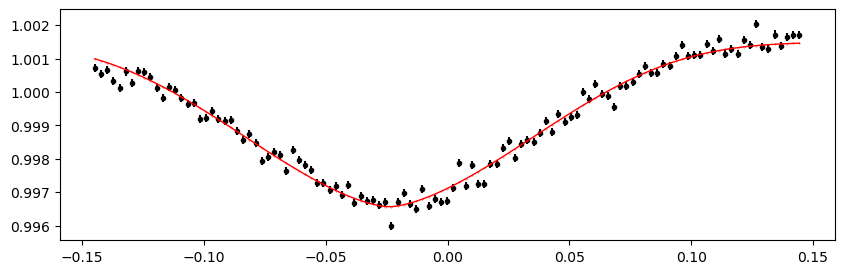

1608.54197 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.86it/s]


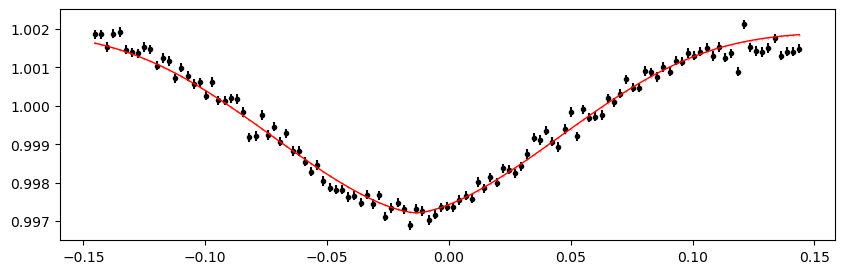

1609.08951 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.63it/s]


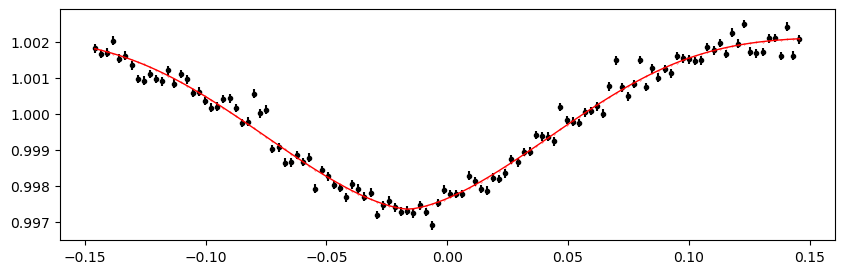

1609.63705 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.58it/s]


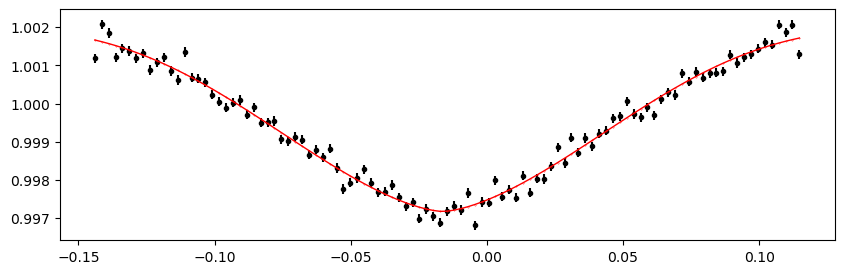

Time 1614.01737 does not have enough data points: 4
1614.56491 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.34it/s]


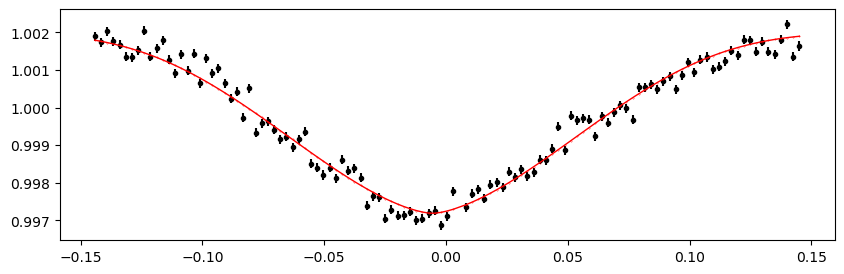

1615.11245 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.10it/s]


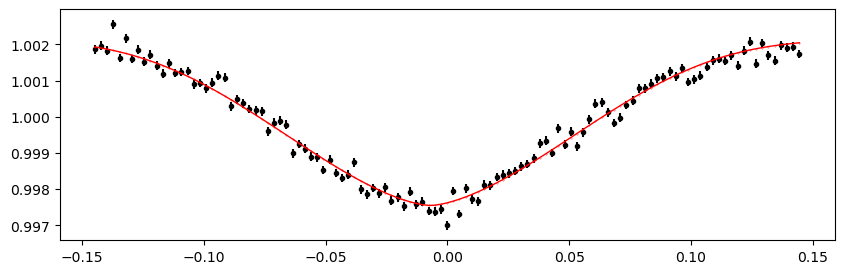

1615.65999 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.55it/s]


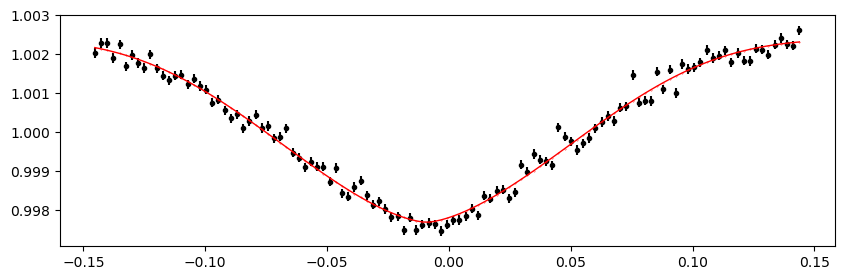

1616.20753 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.19it/s]


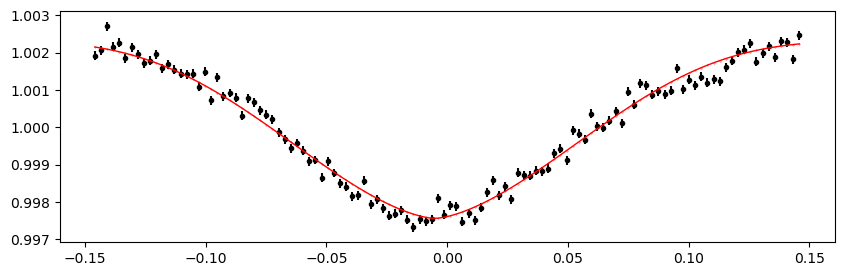

1616.75507 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.15it/s]


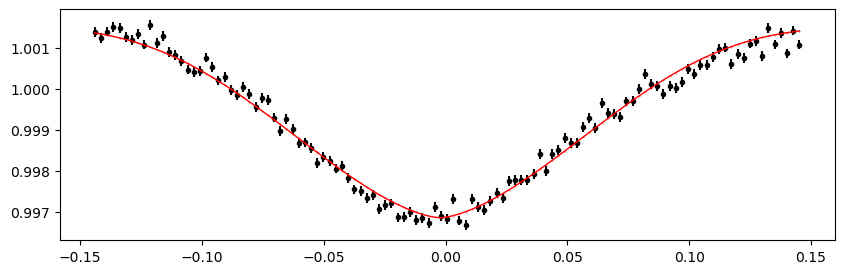

1617.30261 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.33it/s]


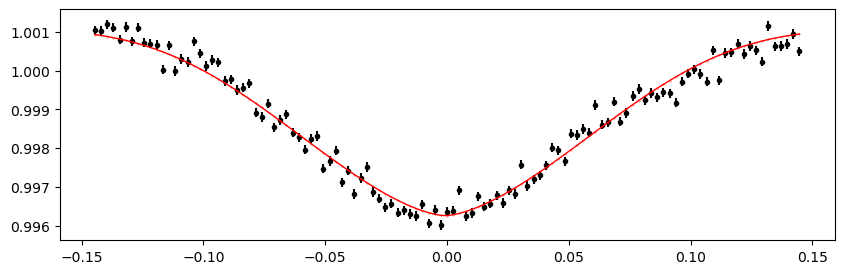

1617.85015 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.32it/s]


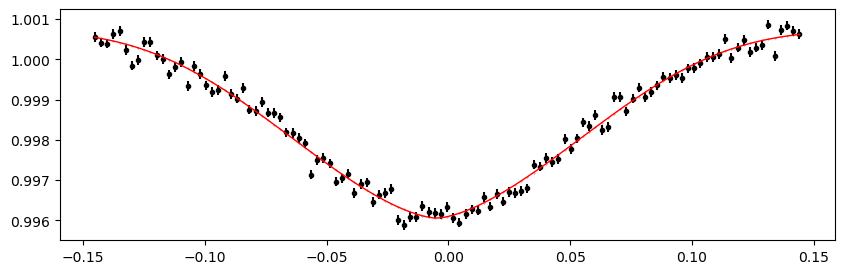

1618.39769 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.38it/s]


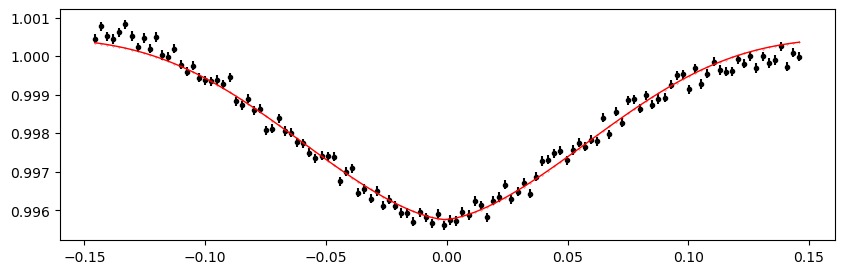

1618.94523 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.31it/s]


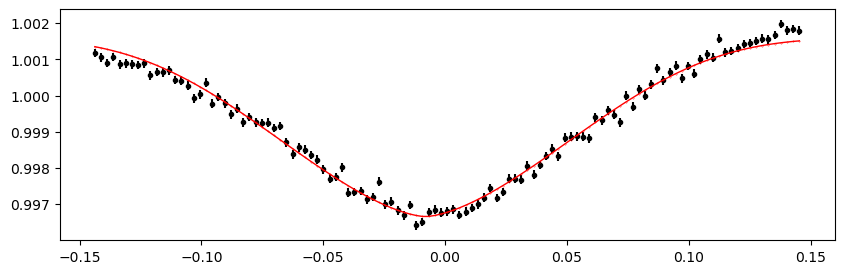

1619.49277 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.00it/s]


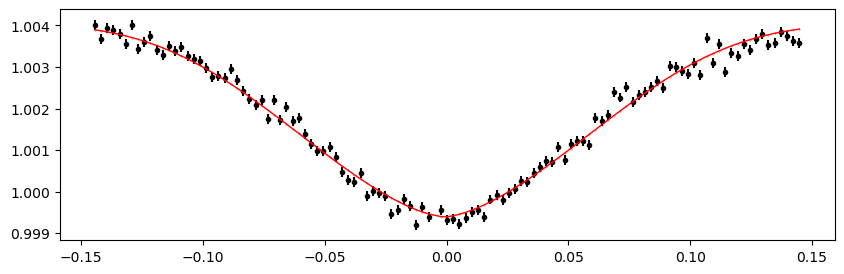

1620.04031 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.85it/s]


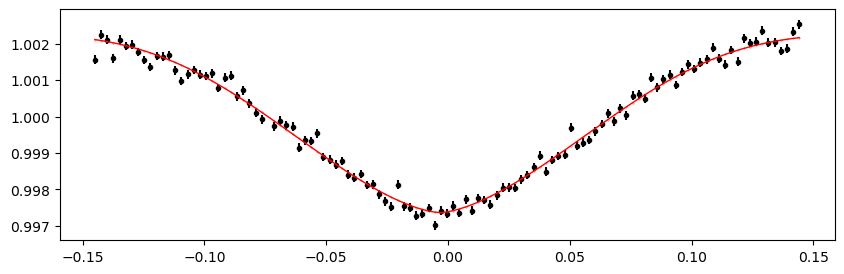

1620.58785 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.10it/s]


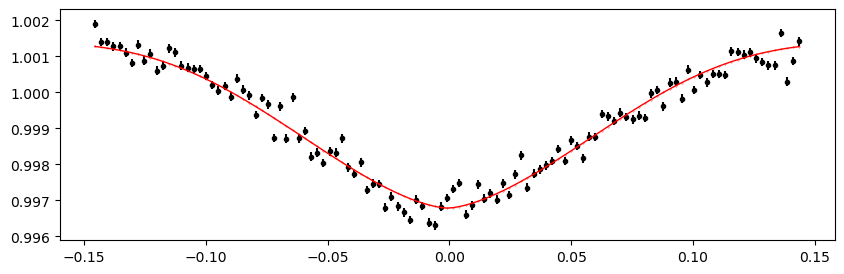

1621.13539 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.40it/s]


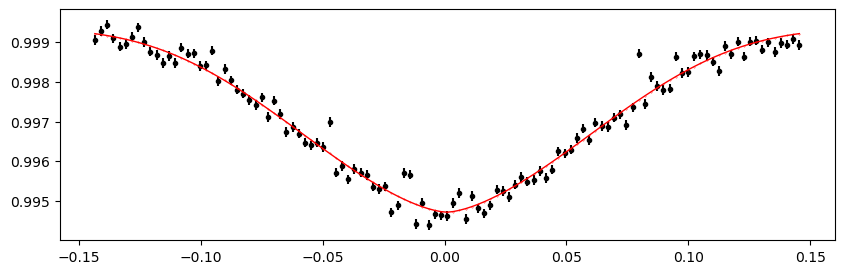

1621.68293 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.87it/s]


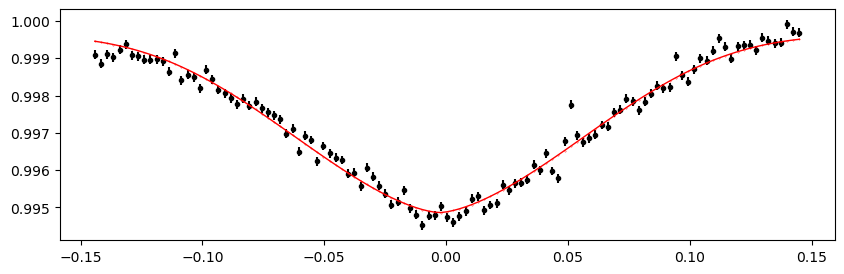

1622.23047 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.24it/s]


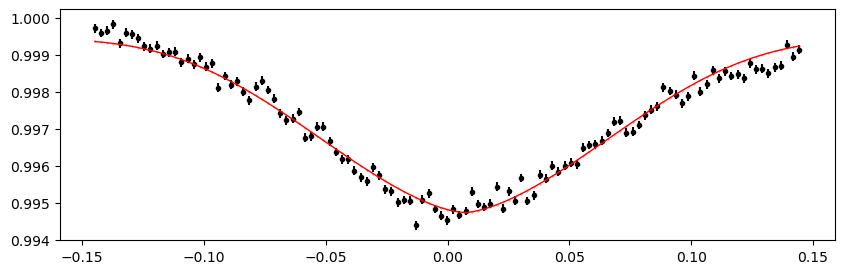

1622.77801 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.56it/s]


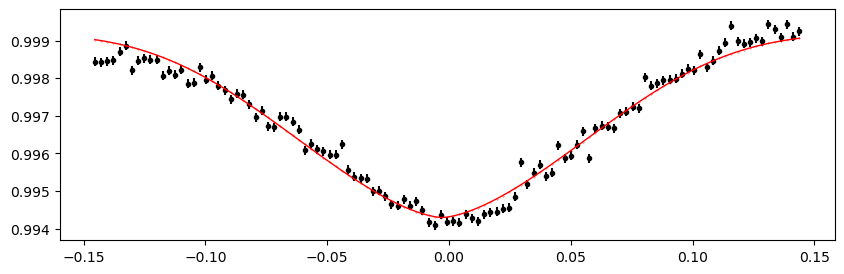

1623.32555 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.81it/s]


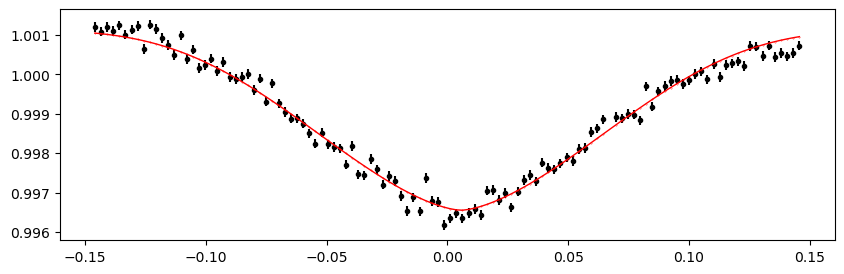

1623.87309 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.65it/s]


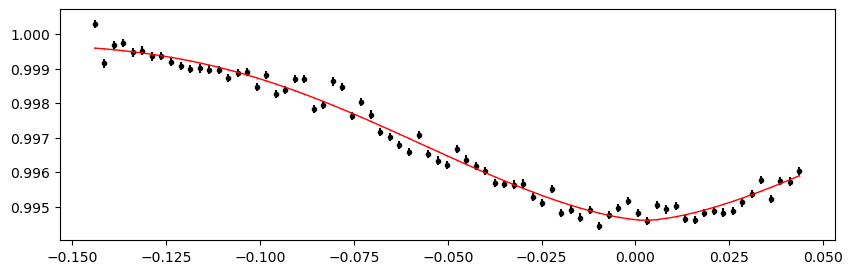

2334.58001 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.79it/s]


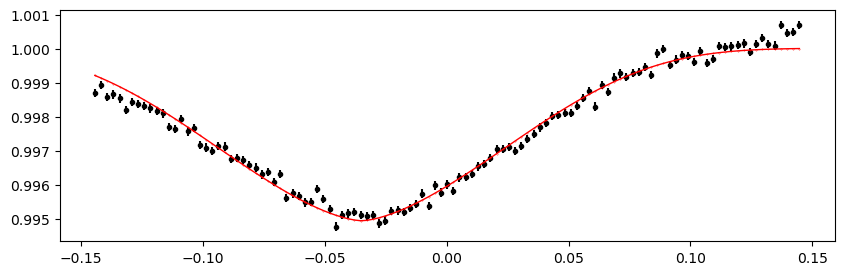

2335.12755 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.02it/s]


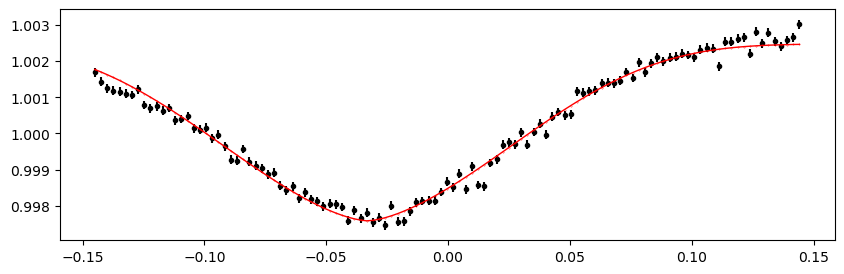

2335.67509 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.33it/s]


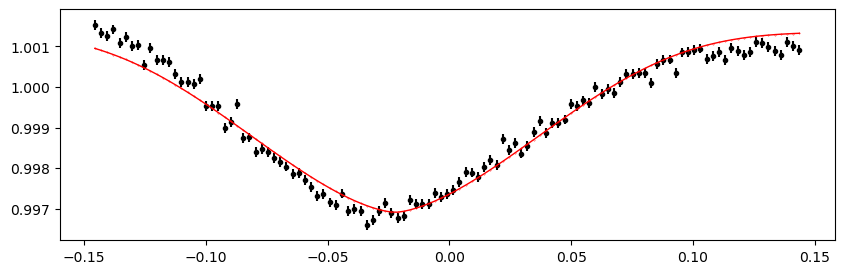

2336.22263 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.40it/s]


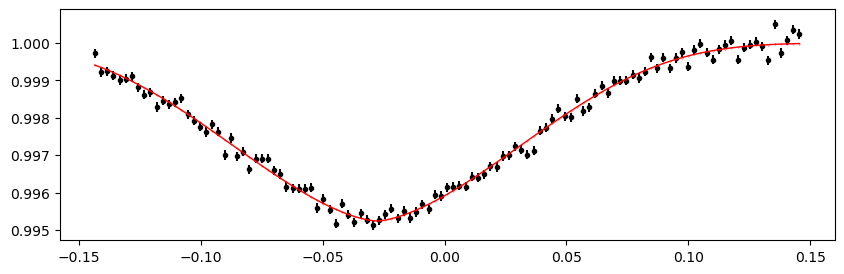

2336.77017 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.54it/s]


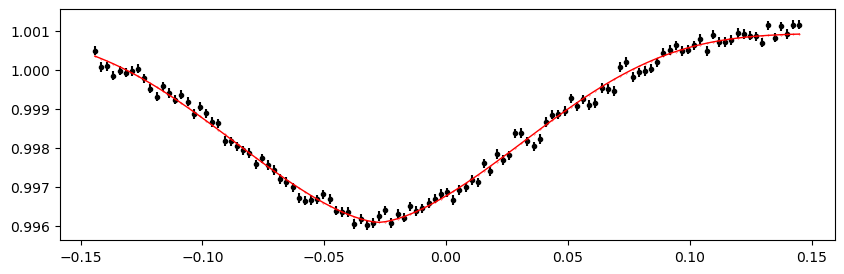

2337.3177100000003 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.83it/s]


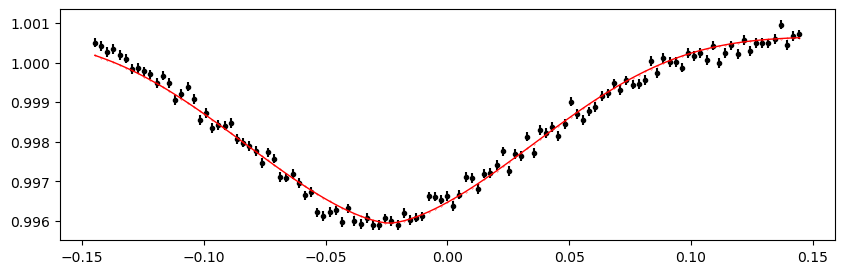

2337.86525 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.52it/s]


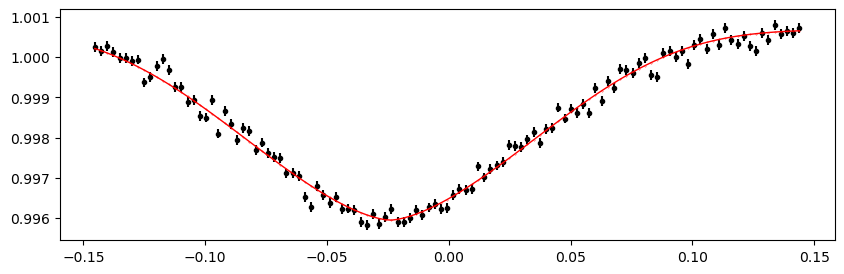

2338.4127900000003 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.66it/s]


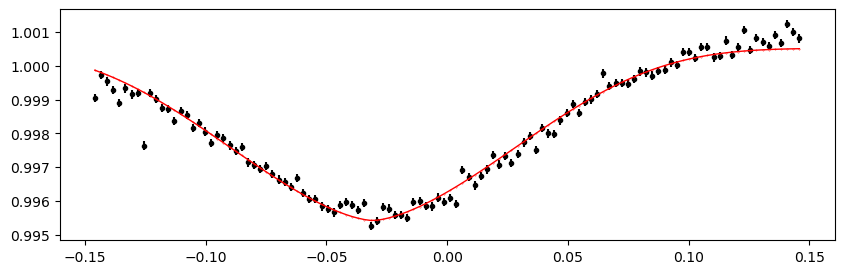

2338.96033 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.00it/s]


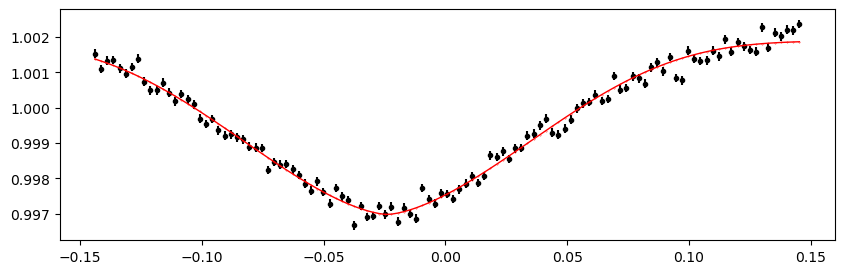

2339.50787 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.80it/s]


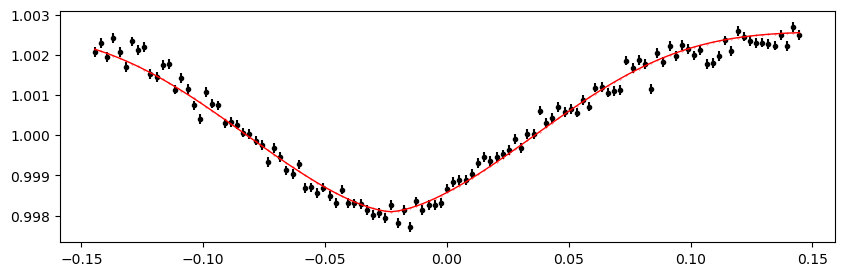

2340.05541 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.73it/s]


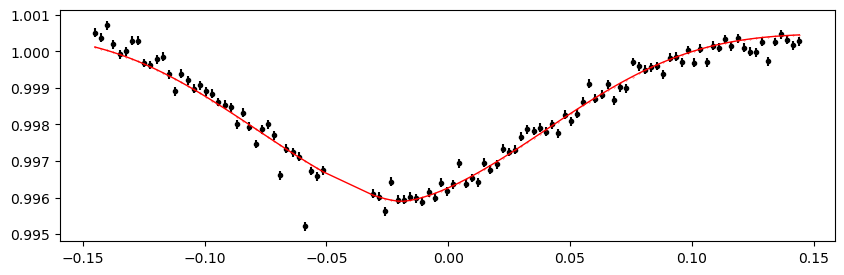

2340.60295 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.24it/s]


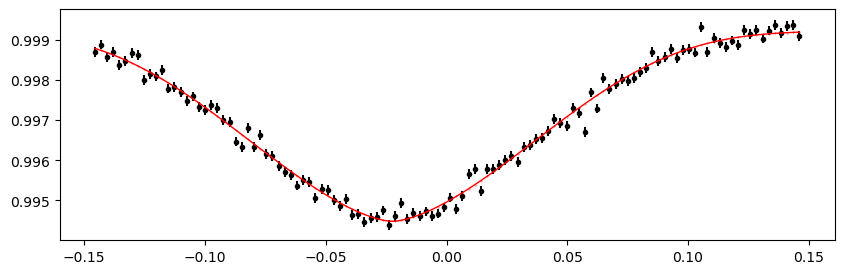

2341.15049 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.17it/s]


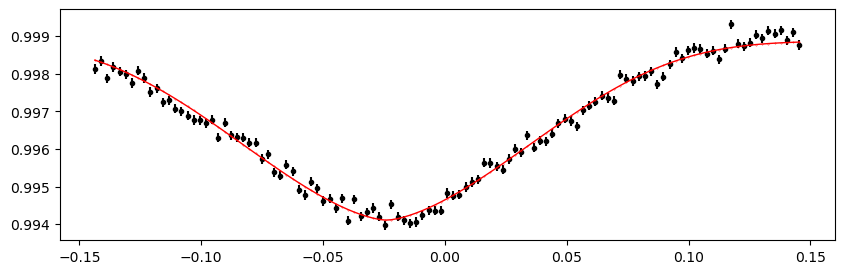

2341.69803 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.03it/s]


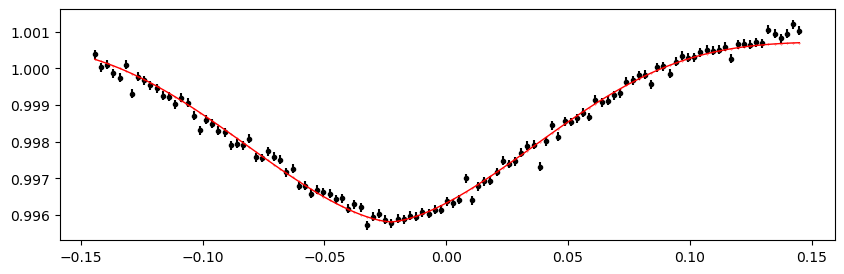

2342.24557 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.08it/s]


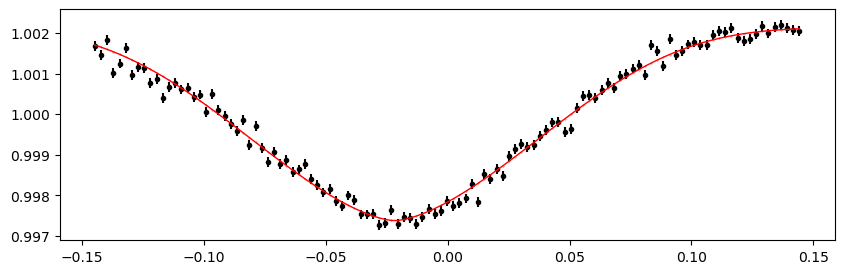

2342.79311 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.40it/s]


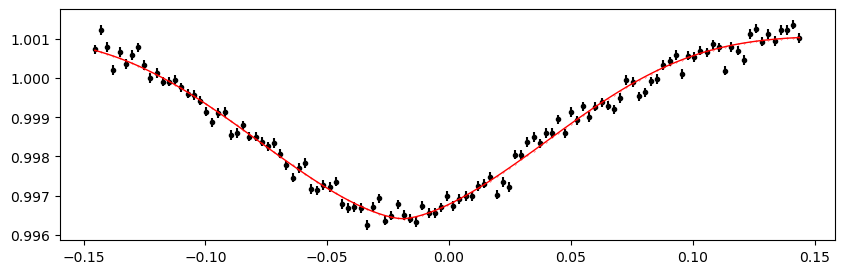

2343.34065 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.07it/s]


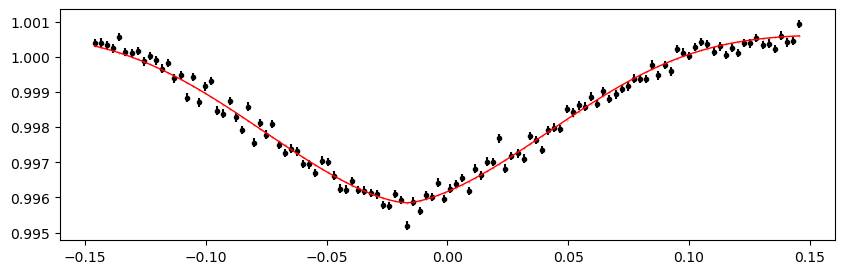

2343.88819 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.06it/s]


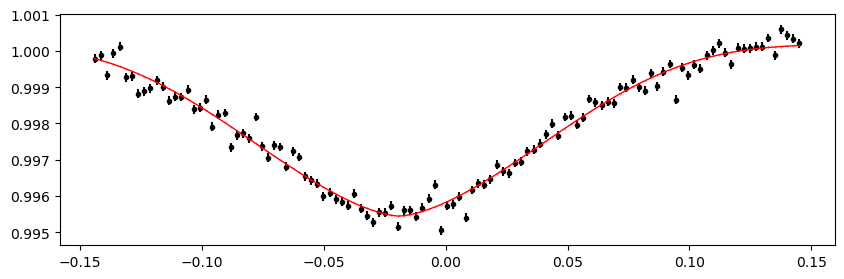

2344.43573 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.81it/s]


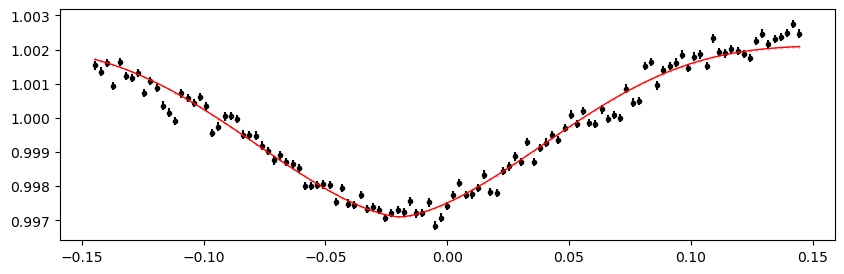

2344.98327 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.53it/s]


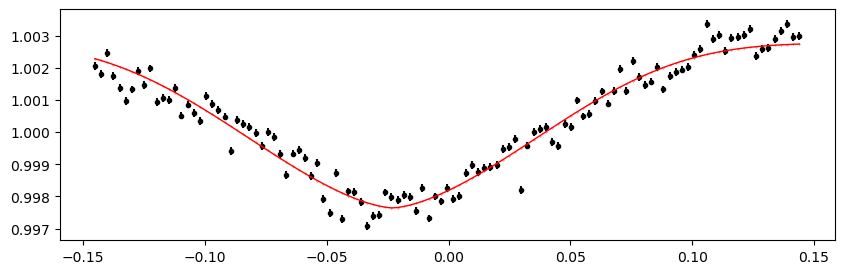

2345.53081 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.12it/s]


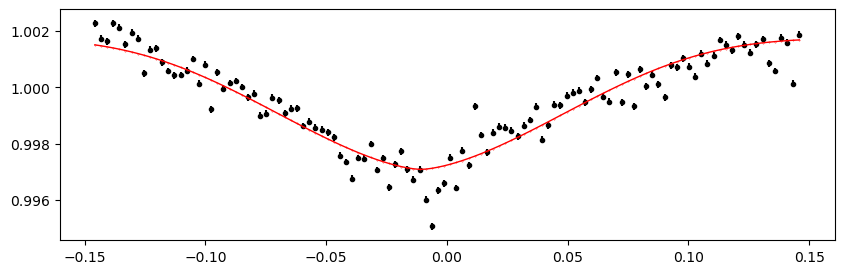

2346.07835 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.39it/s]


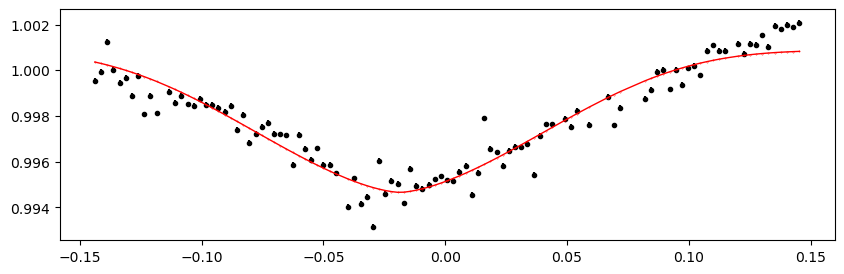

2347.7209700000003 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.60it/s]


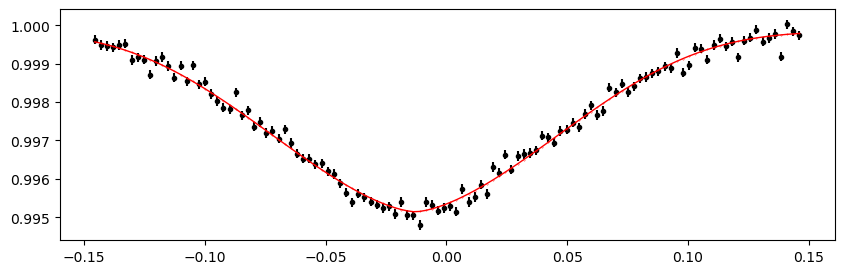

2348.26851 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.60it/s]


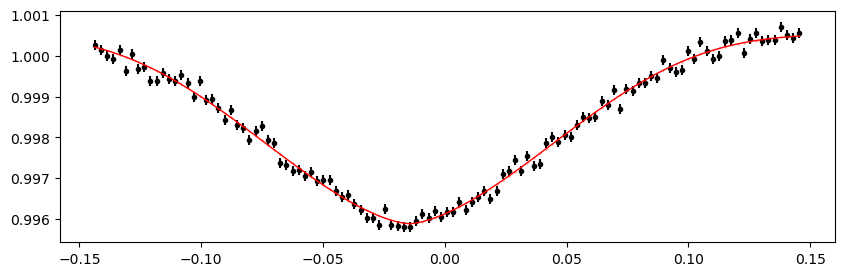

2348.81605 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.81it/s]


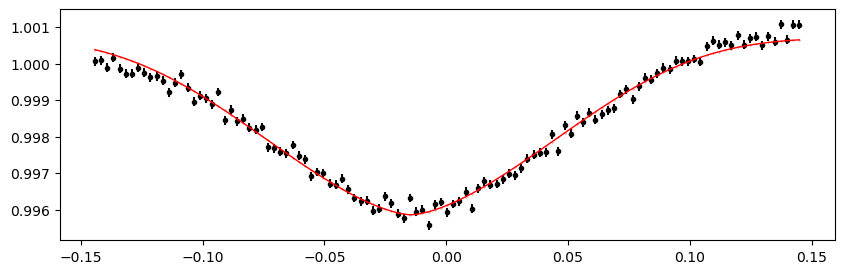

2349.36359 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.07it/s]


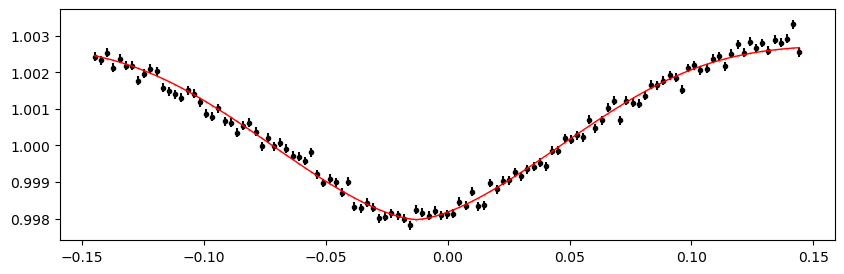

2349.91113 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.69it/s]


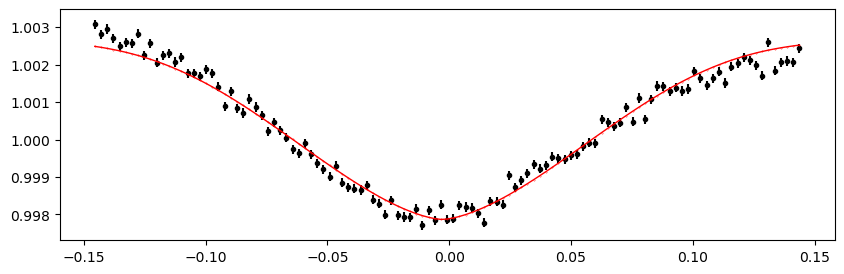

2350.45867 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.84it/s]


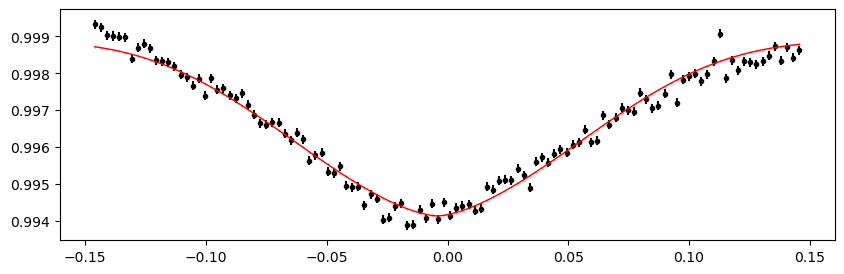

2351.00621 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.52it/s]


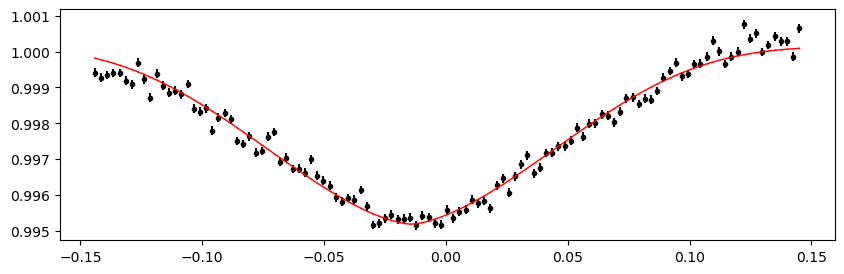

2351.55375 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.88it/s]


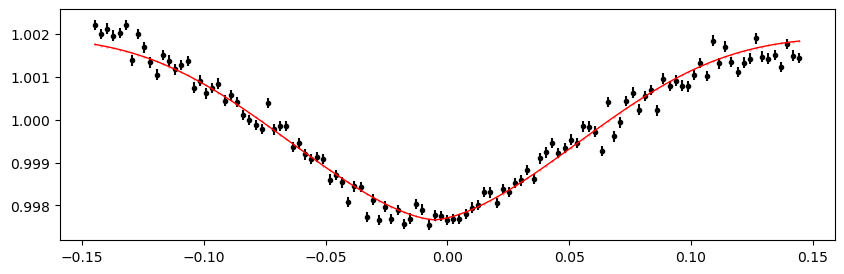

2352.10129 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.50it/s]


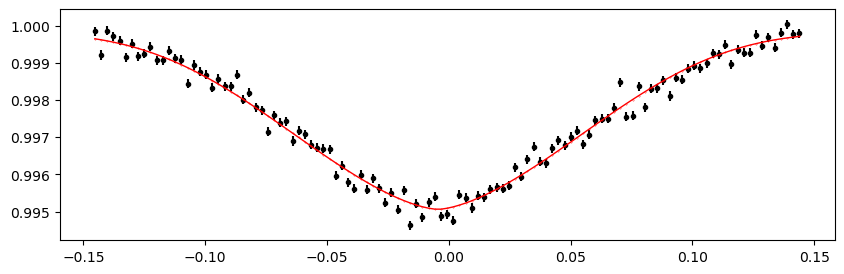

2352.64883 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.33it/s]


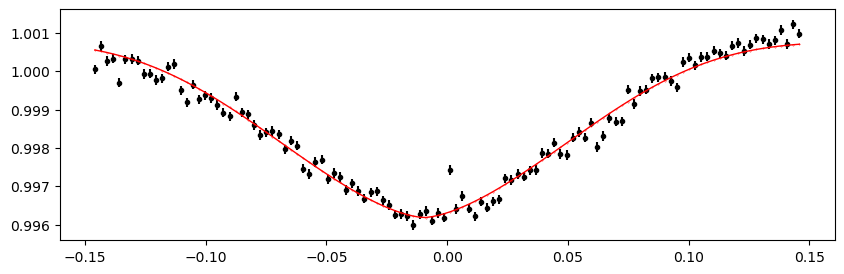

2353.19637 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.56it/s]


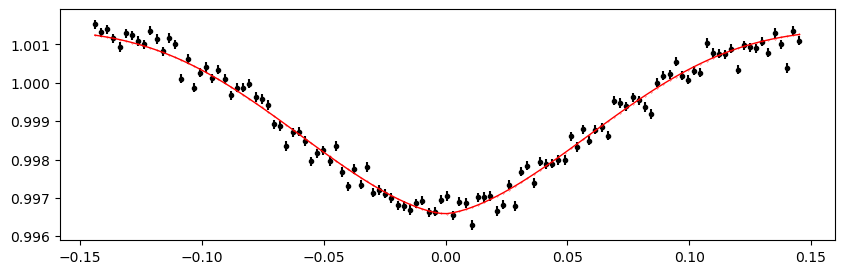

2353.74391 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.00it/s]


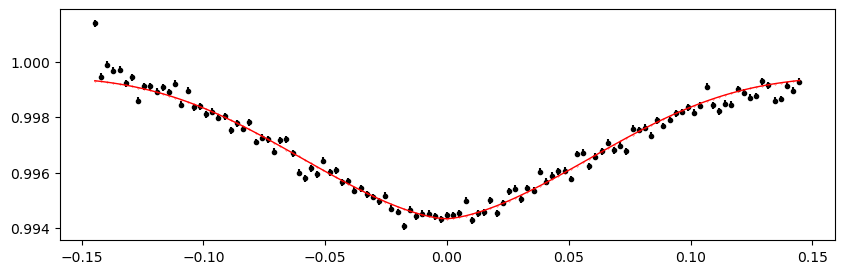

2354.29145 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.88it/s]


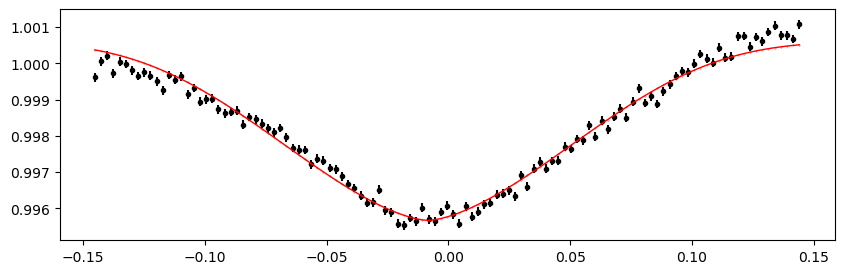

2354.83899 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.58it/s]


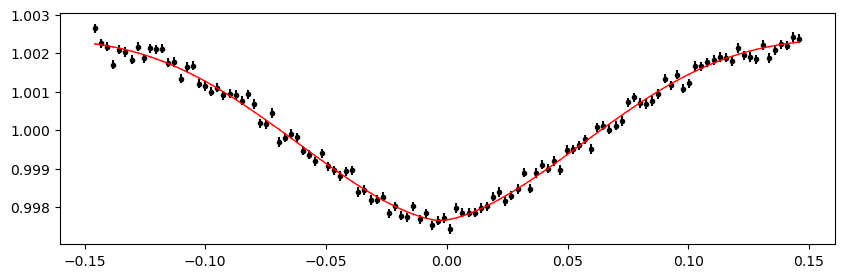

2355.3865299999998 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.64it/s]


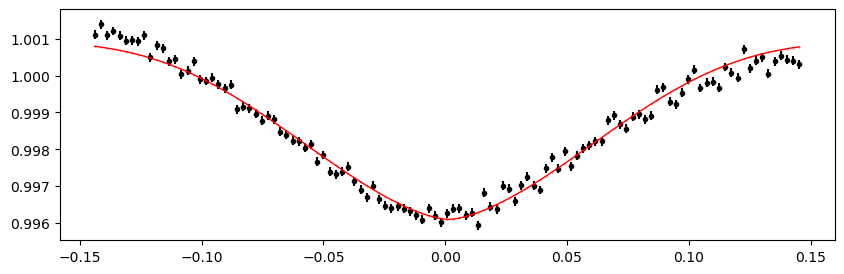

2355.9340700000002 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.28it/s]


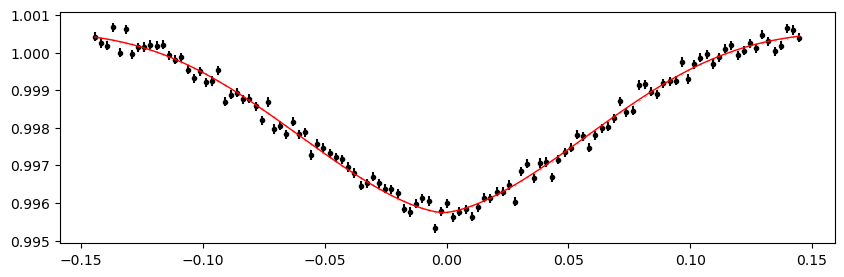

2356.48161 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.39it/s]


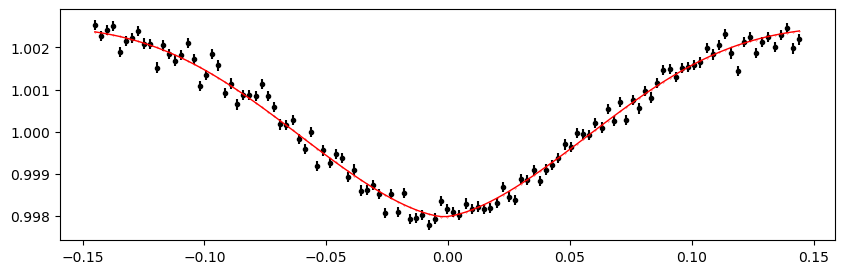

2357.0291500000003 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.49it/s]


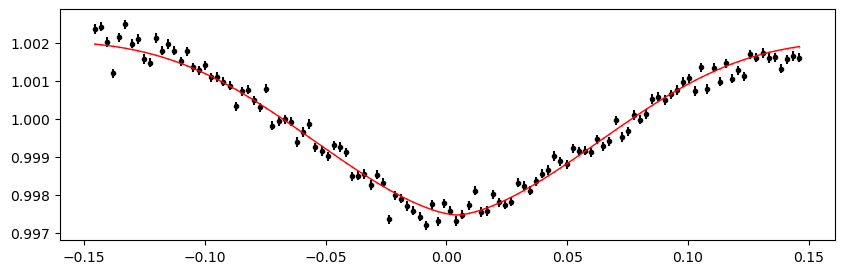

2357.57669 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.44it/s]


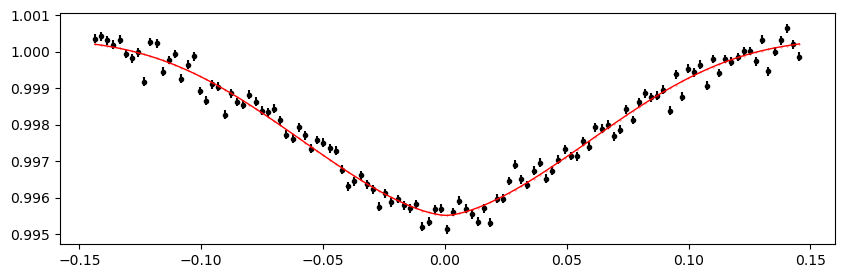

2358.12423 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.29it/s]


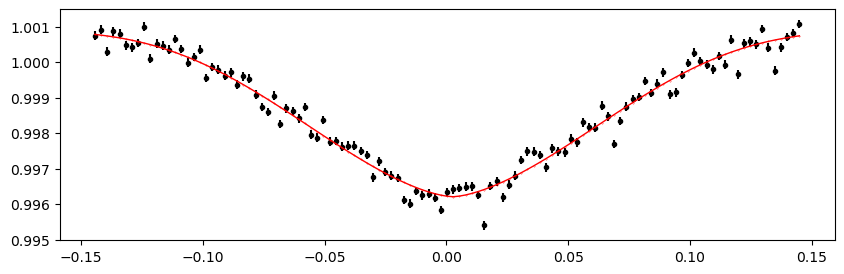

2358.67177 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.82it/s]


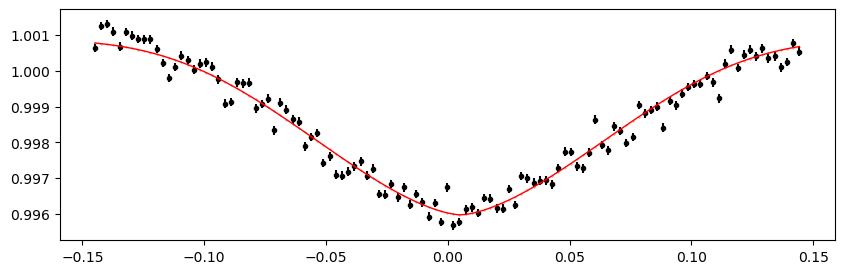

2359.21931 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.34it/s]


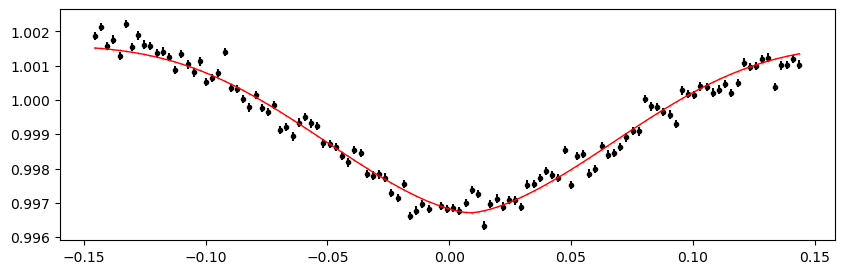

2359.76685 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.82it/s]


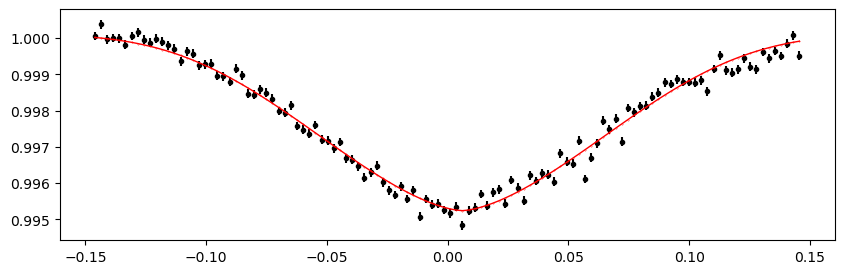

2360.31439 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.02it/s]


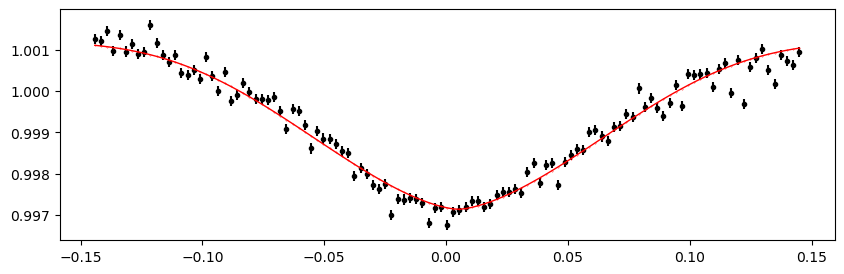

3068.83115 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.53it/s]


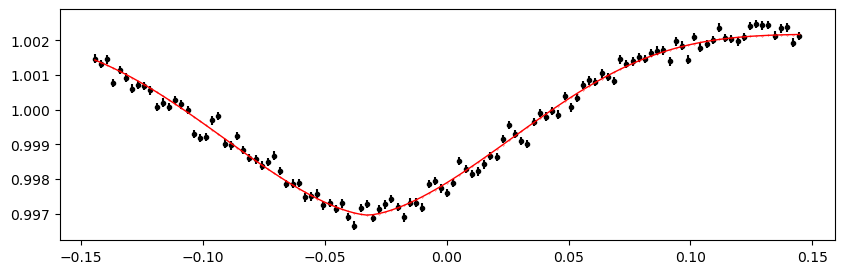

3069.37869 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.85it/s]


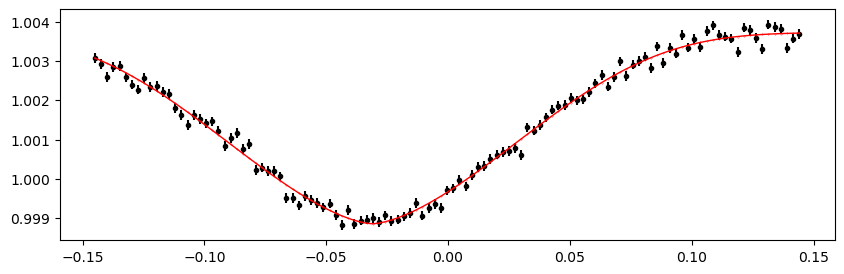

3069.92623 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.91it/s]


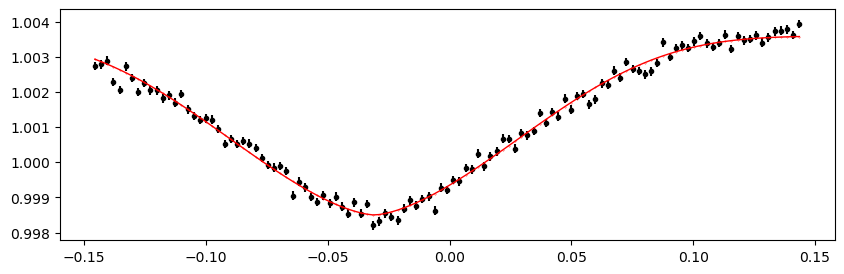

3070.47377 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.77it/s]


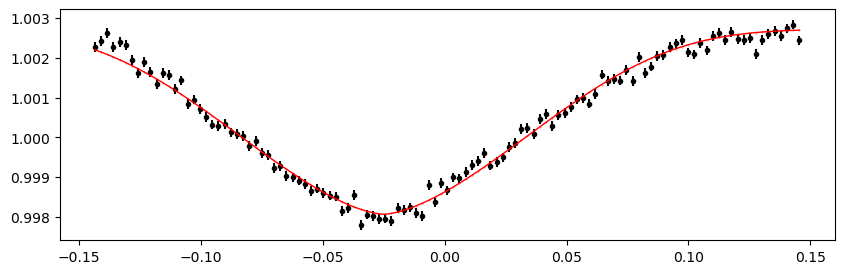

3071.02131 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.68it/s]


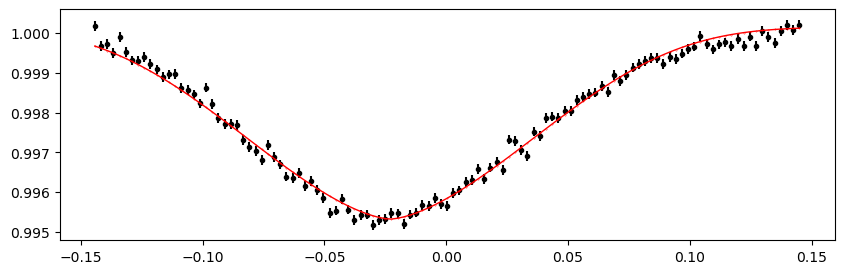

3071.56885 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.78it/s]


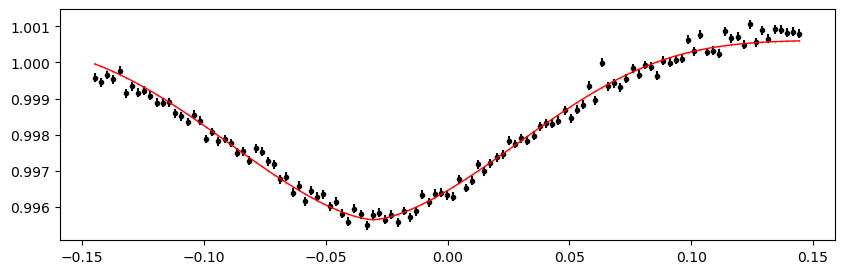

3072.11639 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.70it/s]


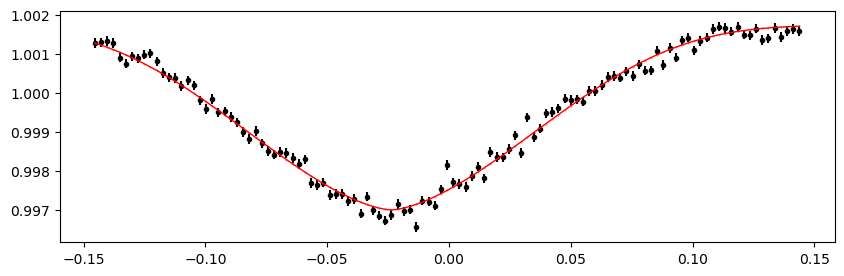

3072.66393 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.83it/s]


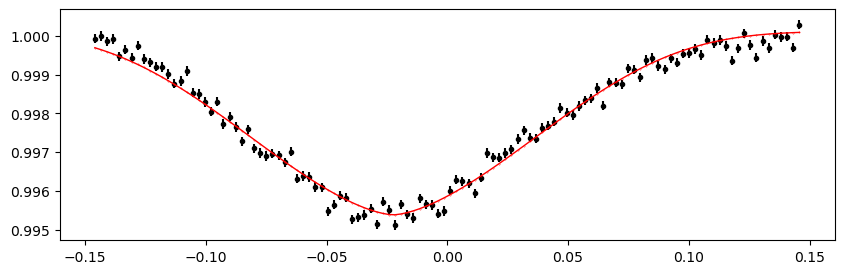

3073.21147 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.96it/s]


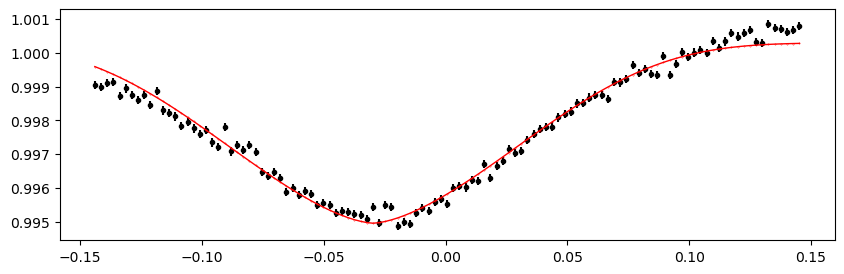

3073.7590099999998 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.13it/s]


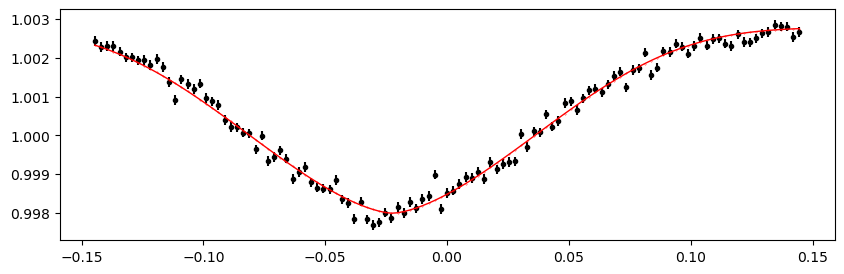

3074.3065500000002 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.33it/s]


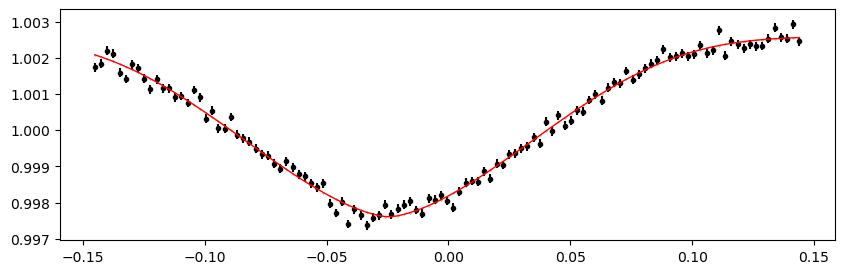

3074.85409 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.75it/s]


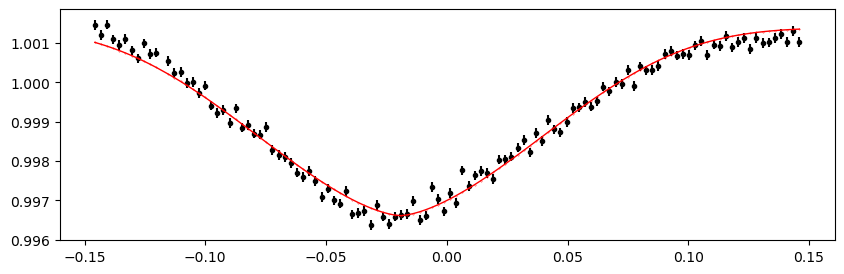

3075.4016300000003 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.54it/s]


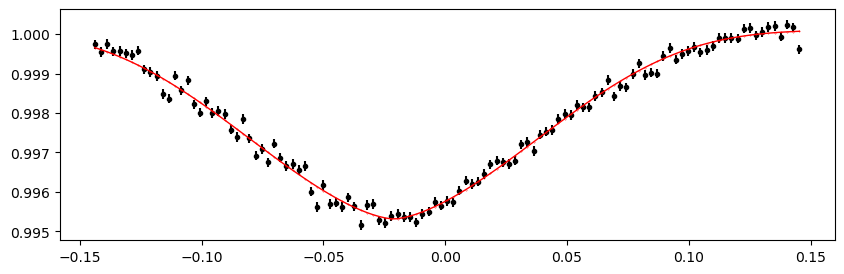

3075.94917 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.48it/s]


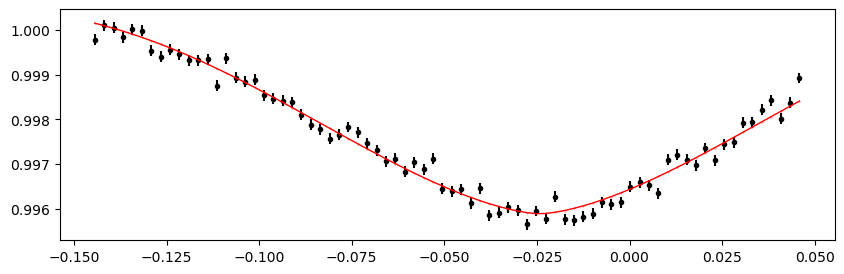

3076.4967100000003 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.41it/s]


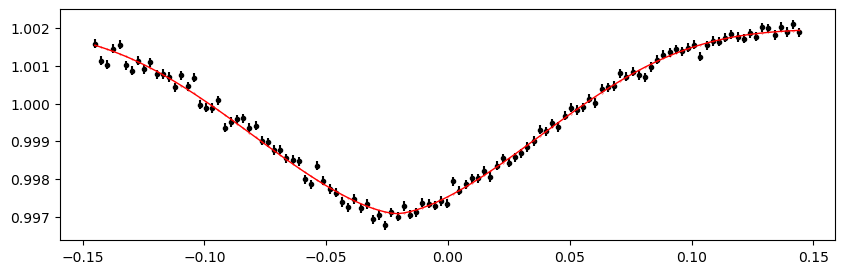

3077.04425 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.81it/s]


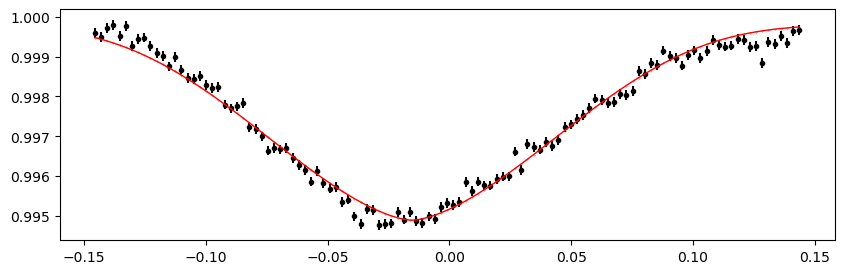

3077.5917900000004 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.17it/s]


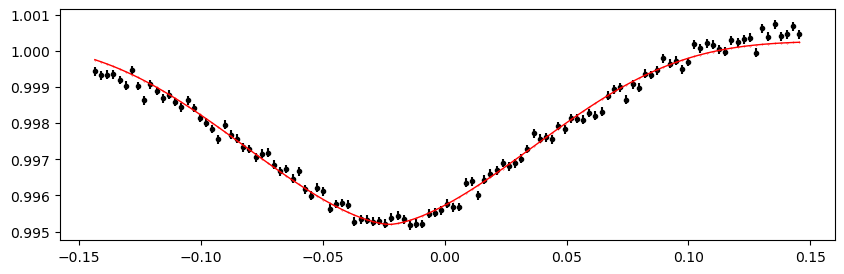

3078.13933 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.28it/s]


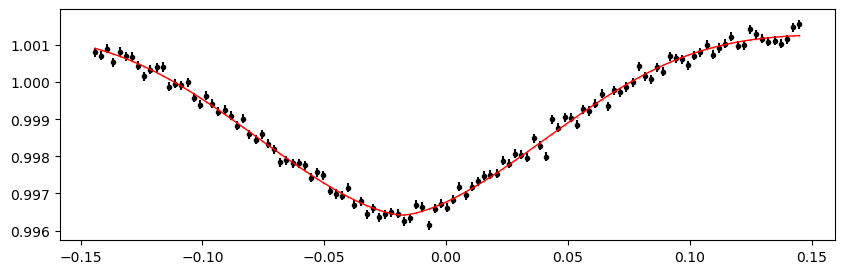

3078.68687 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.29it/s]


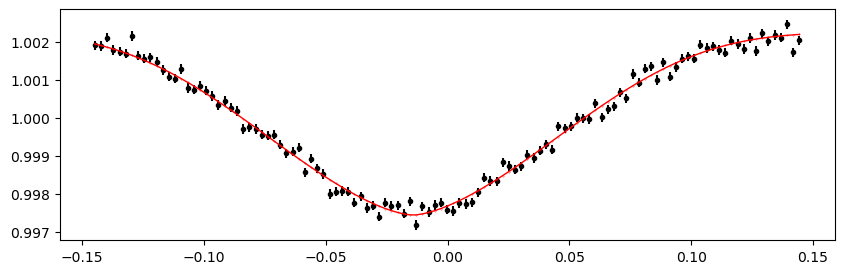

3079.23441 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.23it/s]


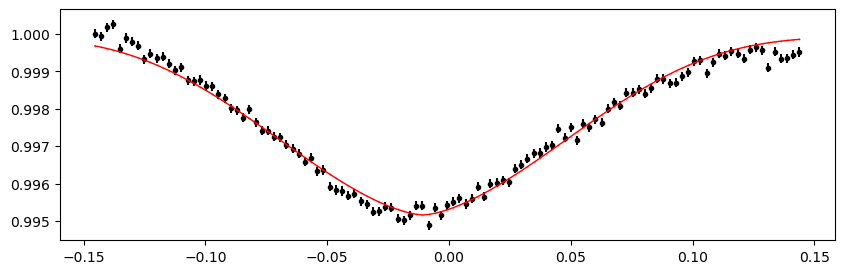

3079.78195 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.11it/s]


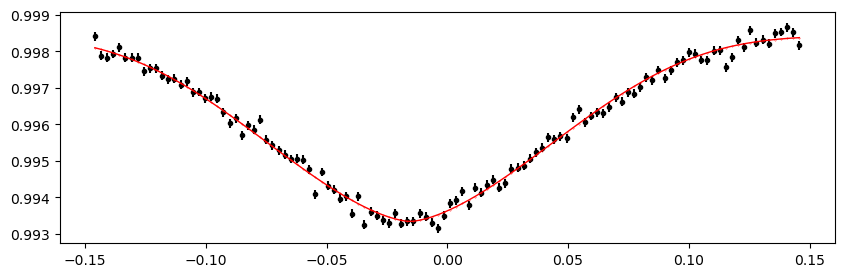

3080.32949 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.75it/s]


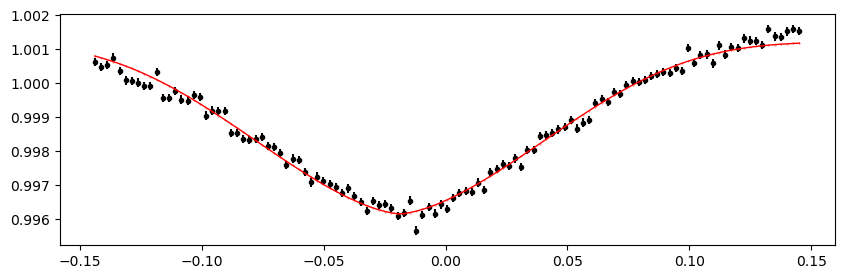

3081.97211 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.90it/s]


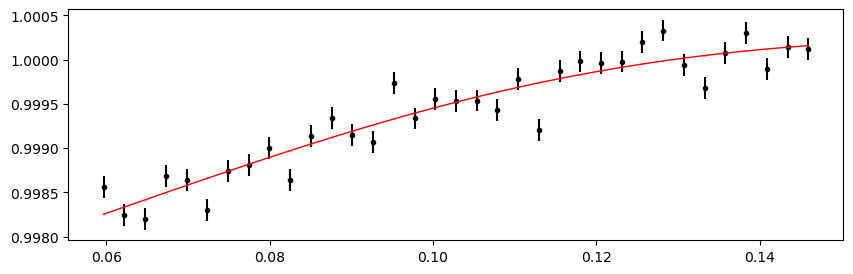

3082.51965 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.69it/s]


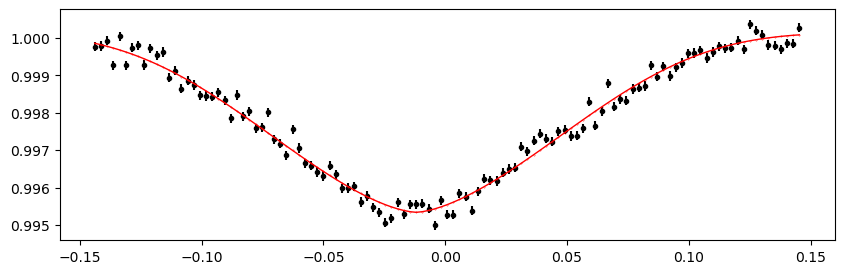

3083.0671899999998 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.82it/s]


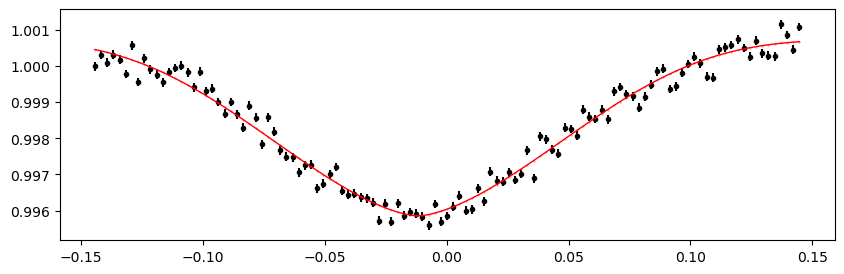

3084.16227 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.75it/s]


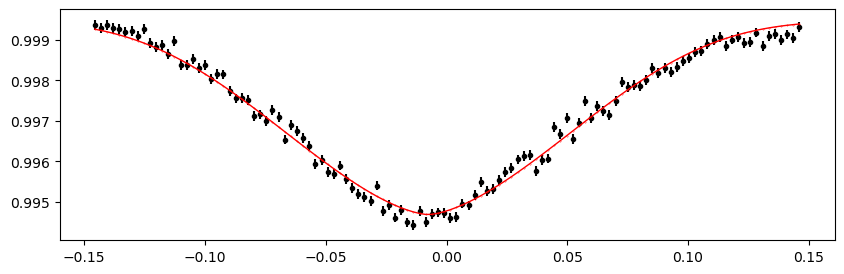

3084.7098100000003 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.93it/s]


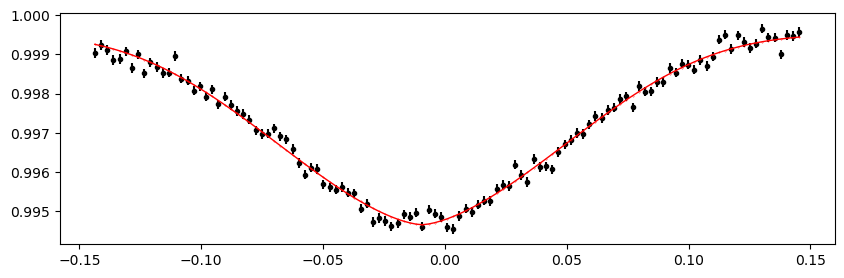

3085.25735 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.28it/s]


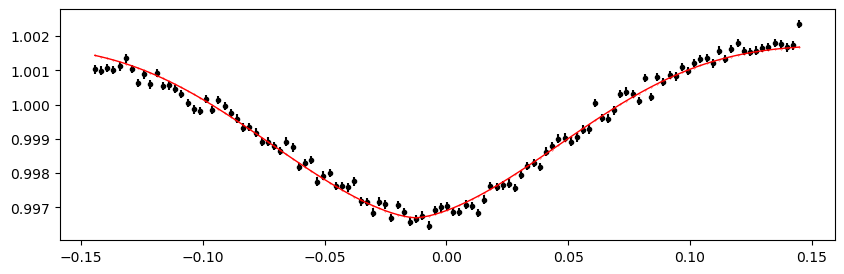

3085.8048900000003 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.21it/s]


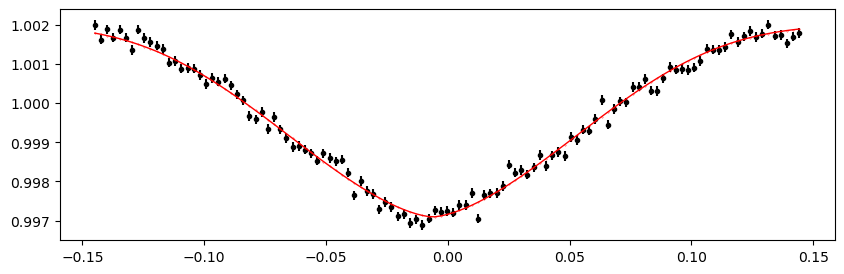

3086.35243 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.72it/s]


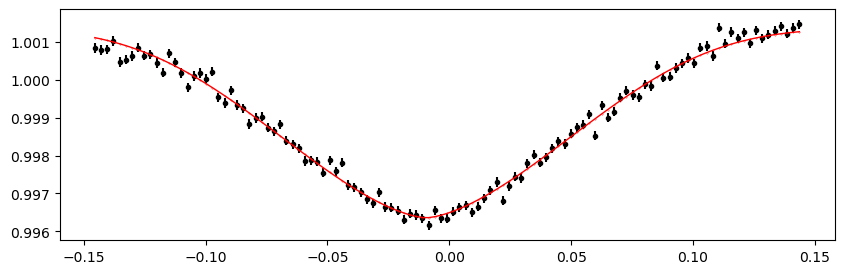

3086.8999700000004 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.13it/s]


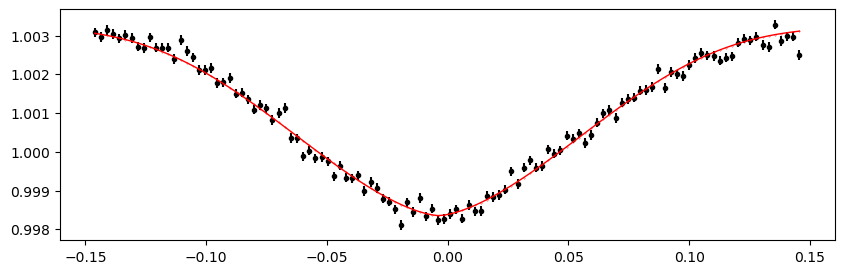

3087.44751 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.89it/s]


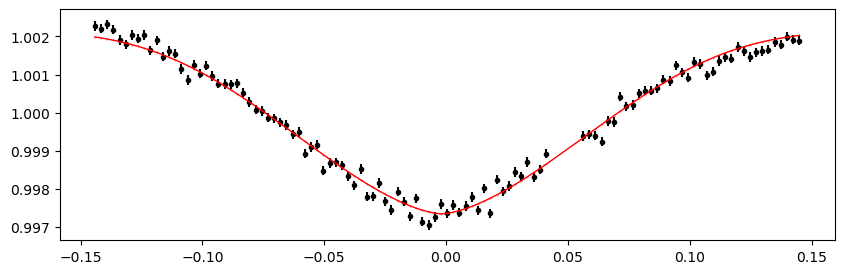

3087.99505 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.59it/s]


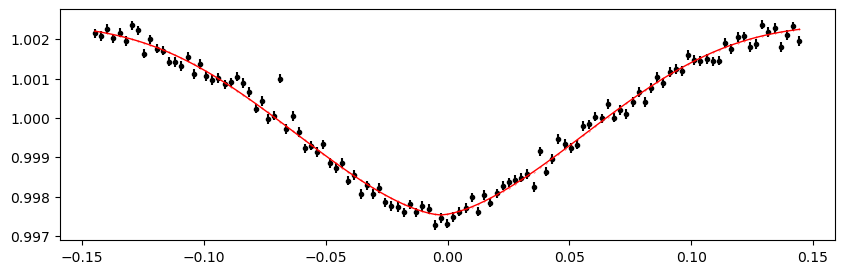

3088.54259 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.40it/s]


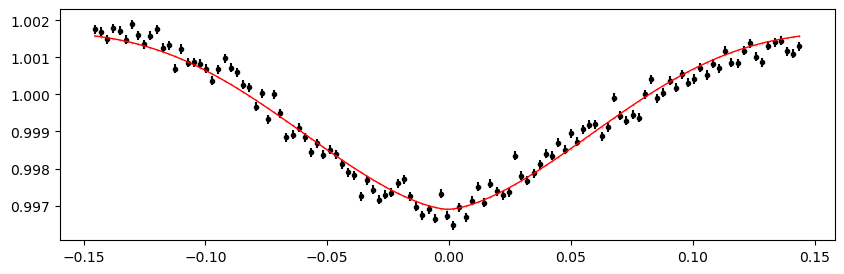

3089.09013 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.20it/s]


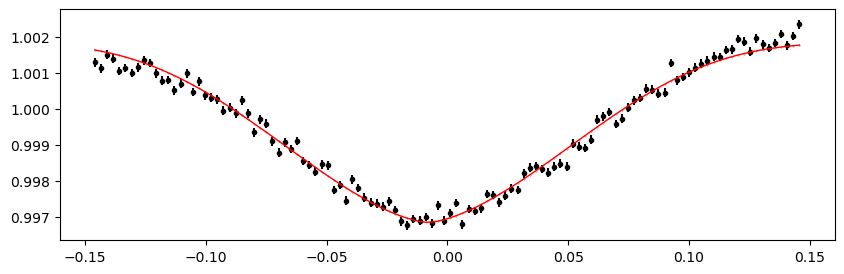

3089.63767 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.27it/s]


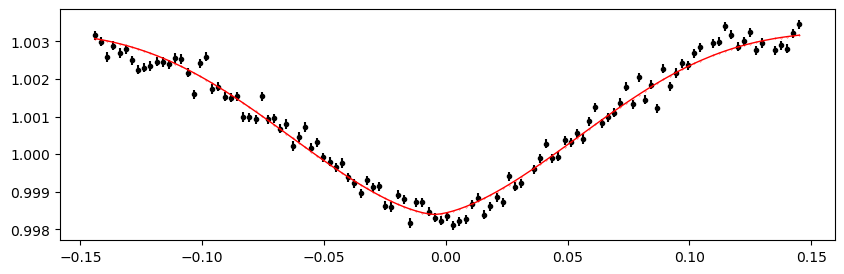

3090.18521 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.93it/s]


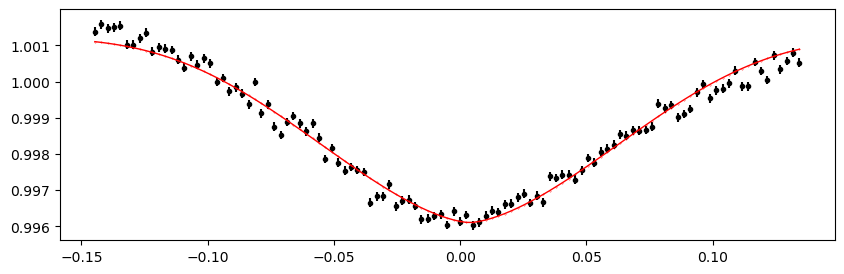

3090.73275 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.54it/s]


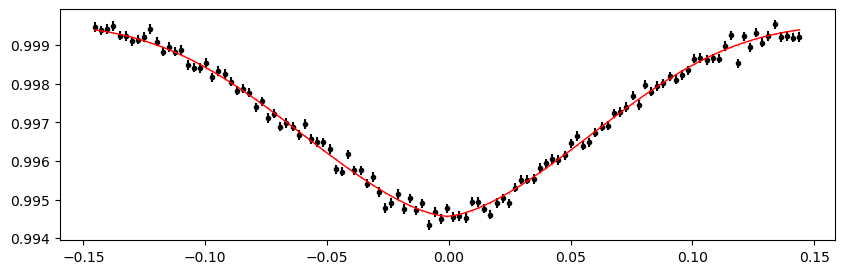

3091.28029 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.24it/s]


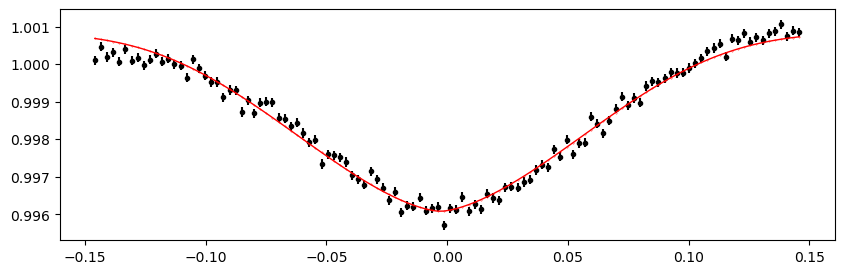

3091.82783 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.42it/s]


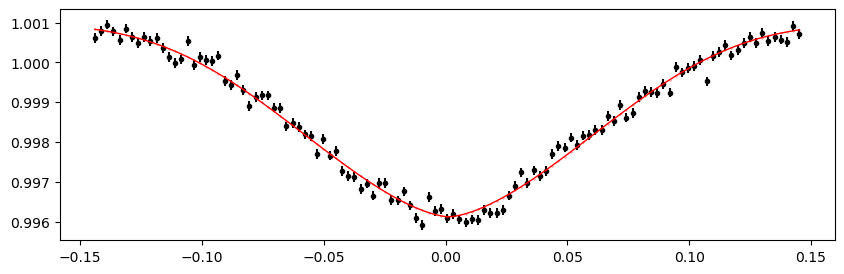

3092.3753699999997 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.31it/s]


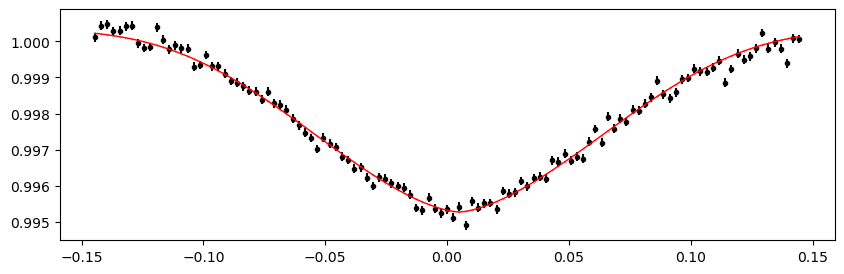

3092.9229100000002 1.0010725223567305 -0.004696784257906559 -0.28762823842949303


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.05it/s]


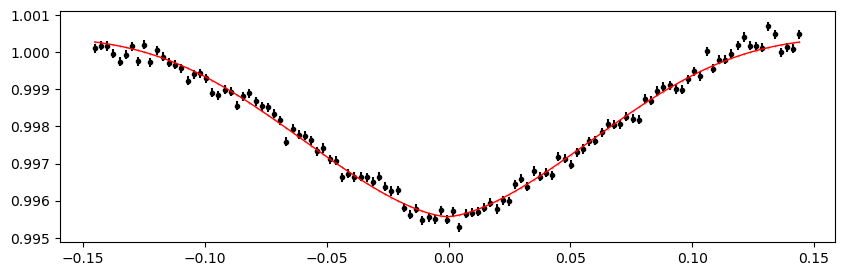

In [103]:
# ---

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   # min_number_data=10,  # to handle 10 min cadence data
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")


## ETV O-C plot

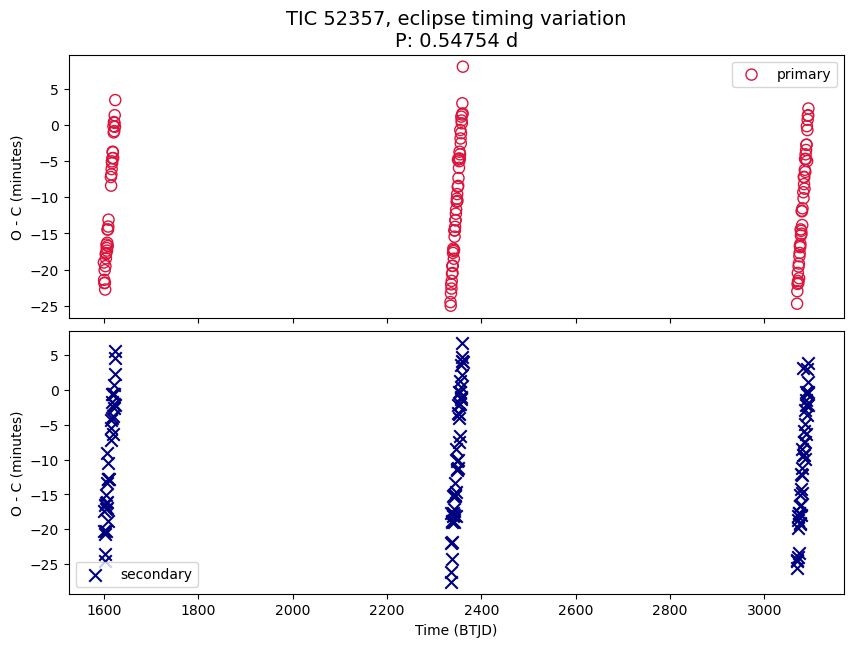

In [134]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
# outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
# outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"
# period = 0.5475400  # MAMC on primary
#
# outfile_path = f"{outfile_base}/tic{ticid}_etv_primary_p_tce1.csv"
# outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary_p_tce1.csv"
# period = 0.5475363  # TCE1

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              lw = 1, color = 'crimson', )
axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
# axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
#              lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    # axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
    #              lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

### O-C Plot, Zoom In

For this target, the difference of the period from TCE1 and MCMC fit, of  0.0000037 d / 0.005328 min, does not any sigificnat impact on the O-C plot

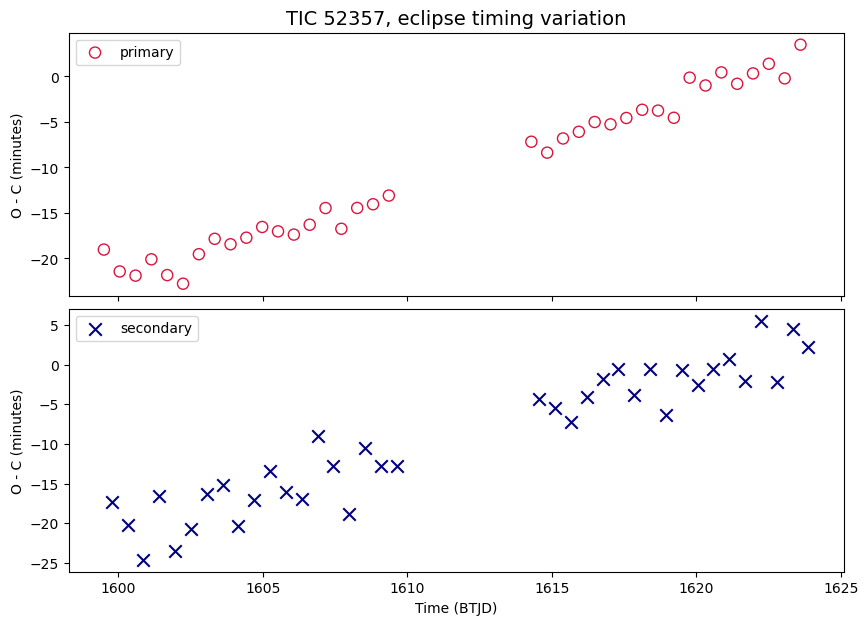

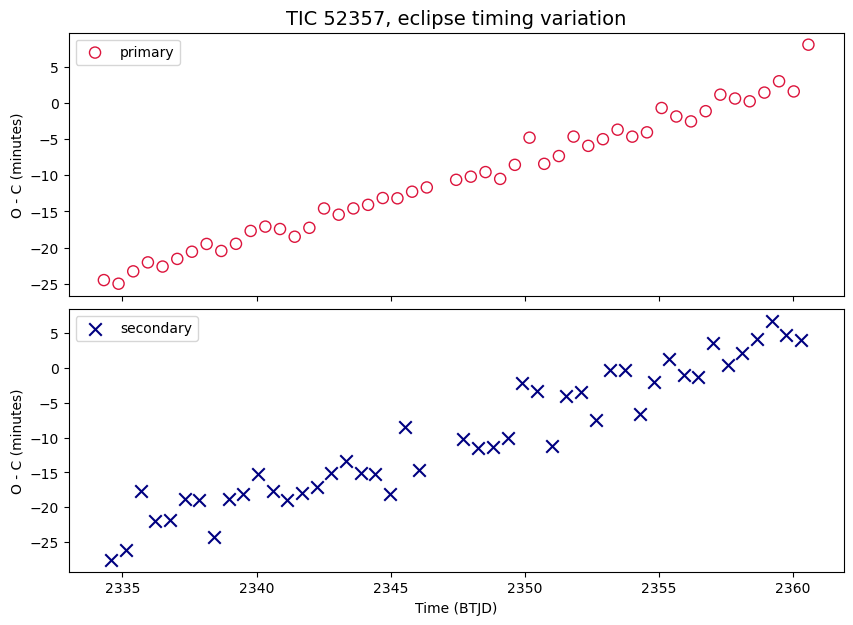

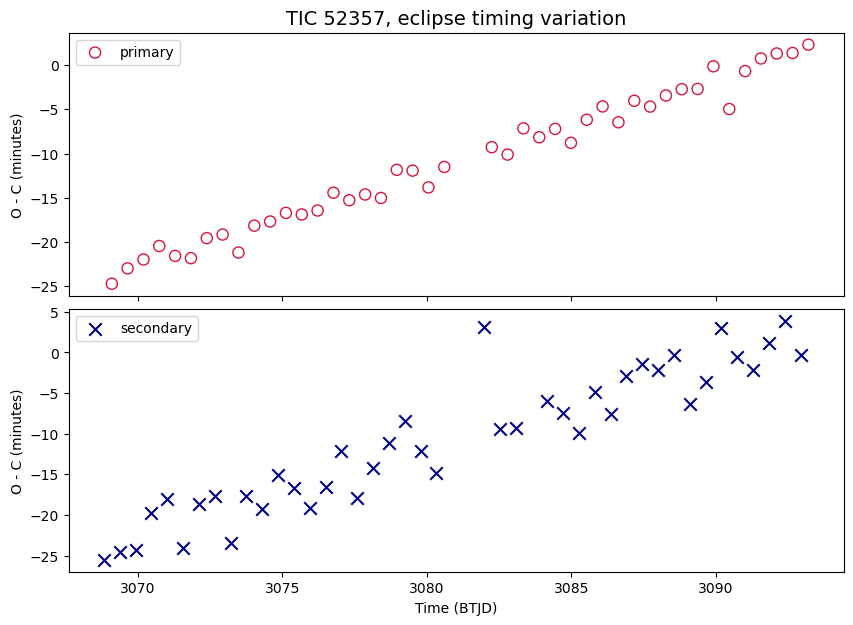

In [135]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1500, 1700),
    (2100, 2400),
    (3050, 3200),
]
title_suffix = "eclipse timing variation"

def tweak_axs_list(axs_list):
    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    # axs_list[1][1].set_ylim(-5.5, 2);

    # ax = axs_list[0][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")
    # ax = axs_list[1][0]
    # ax.set_title(f"{ax.get_title()} (10min cadence)")
    
    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
    
        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]
        
        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]
              
        axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'], 
                       marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        # axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'], 
        #                 lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")
        
        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]
        
            axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
                           marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            # axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
            #                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
        
        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();
        
        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)
        
        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

#### O-C Plots with TCE1 Period 

TCE1 Period: `0.5475363` d

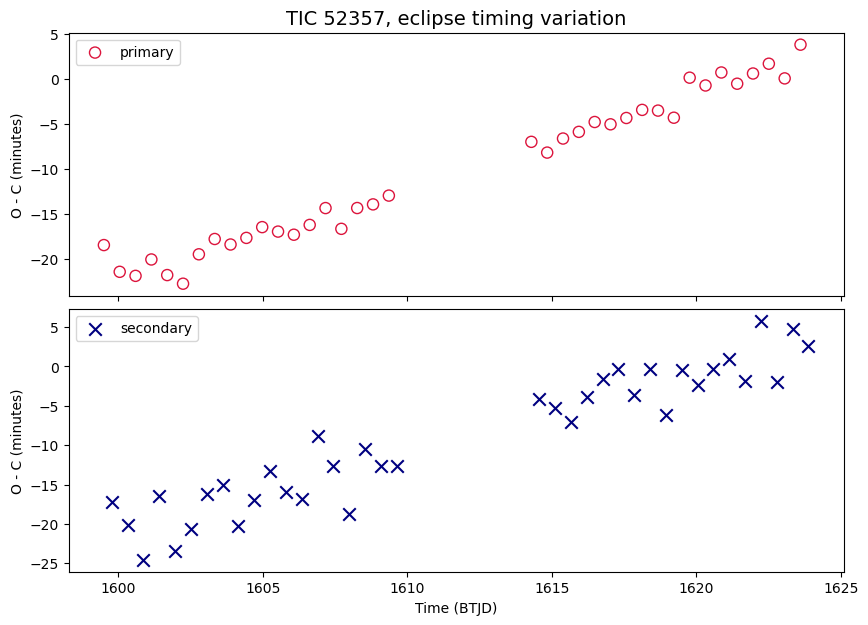

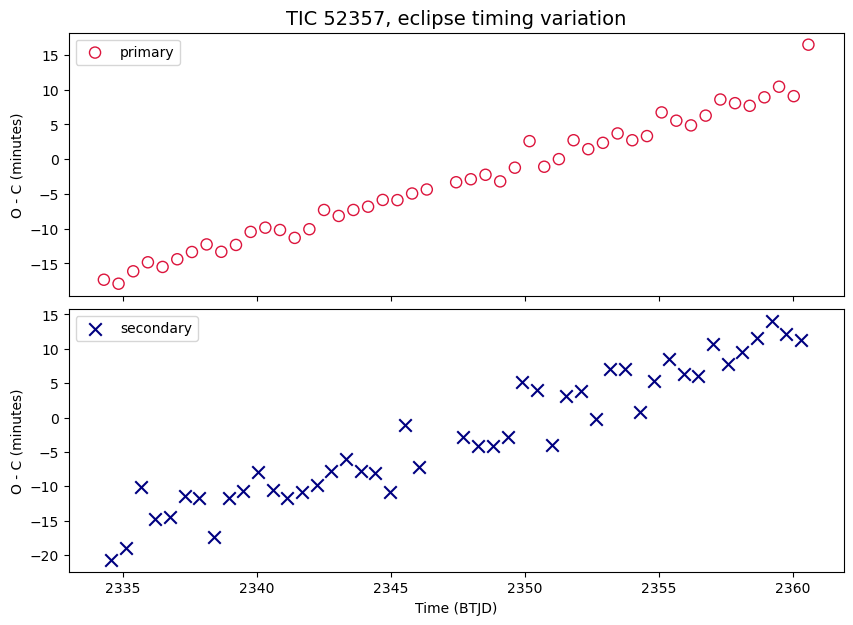

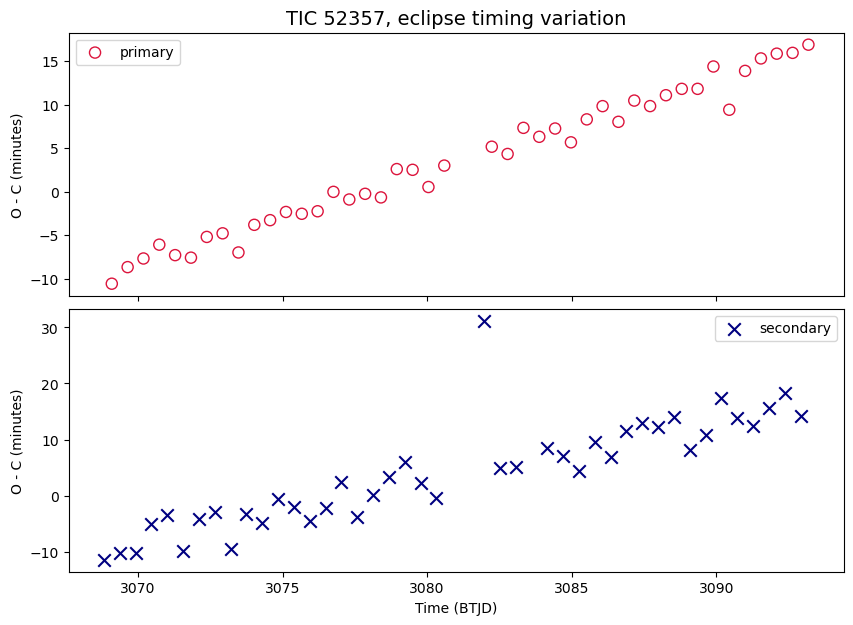

## make a periodogram 

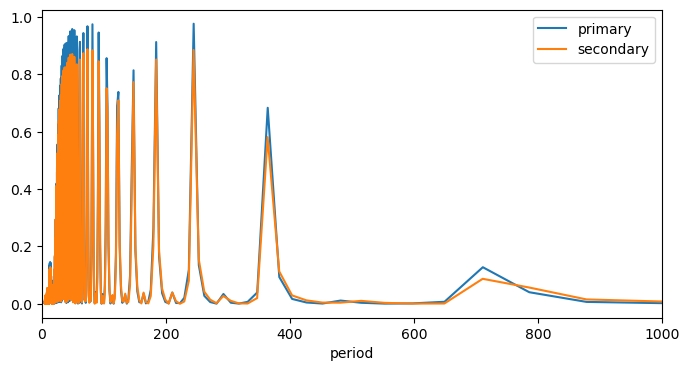

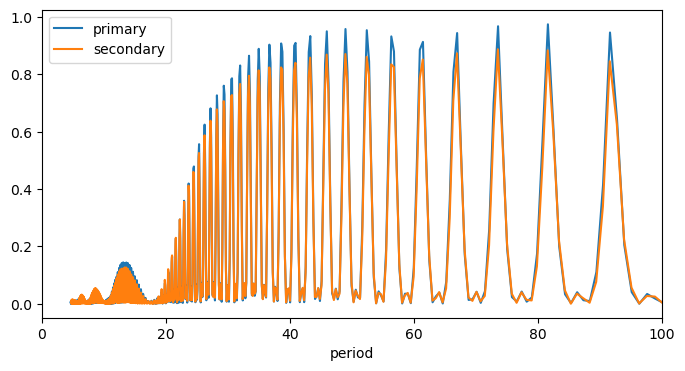

In [124]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 1000)
plt.show()


if True:  # zoom-in
    fig, ax = plt.subplots(figsize=(8, 4))
    
    plt.plot(1/frequency, power, label = 'primary')    
    
    if t0_secondary is not None:
        frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
        plt.plot(1/frequency_s, power_s, label = 'secondary')    
    
    plt.xlabel("period")
    
    plt.legend()
    plt.xlim(0, 100)
    plt.show()

## Results Summary

In [125]:
# FILL-IN the ETV results / comments
has_etv = "Y?"
comments = "Mightbe ETV for both primary and secondary in 3 separate sectors. Ot it might be due to imprecise period. 2 slightly different period (from TCE1 and MCMC) shows comparable result though."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,52357
has_etv,Y?
comments,Mightbe ETV for both primary and secondary in 3 separate sectors. Ot it might be due to imprecise period. 2 slightly different period (from TCE1 and MCMC) shows comparable result though.
period,0.54754
depth_pct_p,1.05
depth_pct_s,0.47
epoch_p,1599.50756
epoch_s,1599.23379
num_sectors,3
time_span,1499.85



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
52357,Y?,Mightbe ETV for both primary and secondary in 3 separate sectors. Ot it might be due to imprecise period. 2 slightly different period (from TCE1 and MCMC) shows comparable result though.,0.54754,1.05,0.47,1599.50756,1599.23379,3,1499.85,1596.78,3096.63

